# Load Libraries

In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn
from torch.nn.functional import relu
from scipy.io import loadmat
import os
from skimage import io
from PIL import Image
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pickle
from ConvLSTM_pytorch import convlstm_wdo as convlstm
import operator
from random import sample
from utils_v4 import *

# Load Data

In [54]:
#selected subset of dates. 
val_dates = ['180409','180412','180414']
test_dates = ['180411', '180413']
bad_dates = ['180326', '180328', '171019', '180715', '180716', '180717']
load_path = '/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/'
model_saving_path = '/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models'





## Load data helper functions

In [55]:
def create_files_new(load_path, bad_dates, T_length=10, proceed=1): 
    sleep_files = os.listdir(load_path+'sleep/')
    move_files = os.listdir(load_path+'move/')
    all_files = sleep_files+move_files
    
    dic = {}
    for f in all_files:
        mvmt_type = f.split('_')[-1].split('.')[0]
        date = f.split('_')[0]
        rec = f.split('_')[1].split('_')[0]
        time = float(f.split('_')[3][4:])
        if date in bad_dates:
            continue
        if mvmt_type == 'sleep':
            label = 1
        else:
            label = 0
        if date in dic:
            if rec in dic[date]:
                dic[date][rec].append([f, label, mvmt_type, date, rec, time])
            else:
                dic[date][rec] = [[f, label, mvmt_type, date, rec, time]]
        else:
            dic[date] = {rec: [[f, label, mvmt_type, date, rec, time]]}
        
    for d in dic:
        for r in dic[d]:
            dic[d][r] = sorted(dic[d][r], key=operator.itemgetter(3, 4, 5))
    
    move_data, sleep_data = [], []
    for d in dic:
        for r in dic[d]:
            sleep_grouped, move_grouped = create_files_new_helper(dic[d][r], T_length=T_length, proceed=proceed)
            sleep_data.append(sleep_grouped)
            move_data.append(move_grouped)
    
    return move_data, sleep_data

In [56]:
def create_files_new_helper(L, T_length, proceed):
    L_labels = np.array([L[i][1] for i in range(len(L))])
    L_times = np.array([L[i][-1] for i in range(len(L))])
    
    L_new_sleep, L_new_move = [], []
    start = 0
    while start <= len(L)-T_length:
        end = start + T_length
        #pdb.pm()
        if sum(L_times[start+1:end]-L_times[start:end-1]-time_window) != 0:
            start += 1
            continue
        if sum(L_labels[start:end]) == T_length:
            L_new_sleep.append(L[start:end])
        elif sum(L_labels[start:end]) == 0:
            L_new_move.append(L[start:end])
        start += proceed
    return L_new_sleep, L_new_move

In [57]:
def upsample(train_files):
    train_sleep = [i for i in train_files if i[0][1] == 1]
    train_move = [i for i in train_files if i[0][1] == 0]
    diff = abs(len(train_sleep)-len(train_move))
    train_new = []
    d = 0
    while d < diff:
        if len(train_sleep) > len(train_move):
            ind = random.randint(0, len(train_move)-1)
            x = train_move[ind]
            d += 1
        else:
            ind = random.randint(0, len(train_sleep)-1)
            x = train_sleep[ind]
            d += 1
        train_new.append(x)   
    train_files = train_sleep+train_move+train_new
    return train_files

In [58]:
class SpectrogramDatasetAtt(Dataset):
    def __init__(self, files, load_path, T_length, all_label=False, CH=None):
        self.CH = CH
        self.files = files
        self.load_path = load_path
        self.T_length = T_length
        self.all_label = all_label
  
    def __len__(self):
        return len(self.files)
    
    def __getitem__(self, idx):
        group = self.files[idx]
        specs, labels, dates, recs, times = [], [], [], [], []
        for i in range(len(group)):
            f, label, mvmt_type, date, rec, time = group[i]
            spec = torch.from_numpy(np.load(self.load_path+mvmt_type+'/'+f))
            if self.CH is not None:
                spec = torch.transpose(spec[self.CH,:,:].unsqueeze(0), 2, 1)
            else:
                spec = torch.transpose(spec, 2, 1)
            specs.append(spec)
            labels.append(torch.Tensor([label]))
            dates.append(date)
            recs.append(rec)
            times.append(time)
            if i == (self.T_length-1)/2:
                label_mid = torch.Tensor([label])
                date_mid = date
                rec_mid = rec
                time_mid = time
        if self.all_label:
            return specs, labels, dates, recs, times
        else:
            return specs, label_mid, date_mid, rec_mid, time_mid

## T-length = 3

In [59]:
time_window = 10
## Load files
move_files, sleep_files = create_files_new(load_path, bad_dates, T_length=3, proceed=1)
train_files, val_files, test_files = [], [], []

## Put files in val, test, and train
for f in move_files+sleep_files:
    if f:
        if f[0][1][3] in val_dates:
            val_files.extend(f)
        elif f[0][1][3] in test_dates:
            test_files.extend(f)
        else:
            train_files.extend(f)           

In [60]:
## Randomly shuffle inside train, val, and test
random.shuffle(train_files)
random.shuffle(val_files)
random.shuffle(test_files)

In [61]:
## Upsample train
train_files = upsample(train_files)

In [62]:
## Balance val 
sleep_files = []
move_files = []
for t in range(len(val_files)):
    if 'sleep' in val_files[t][0]:
        sleep_files.append(val_files[t])
    if 'move' in val_files[t][0]:
        move_files.append(val_files[t])

sleep_sample = sample(sleep_files, len(move_files))
val_2_files = sleep_sample+move_files

In [63]:
len(train_files), len(val_2_files), len(test_files)

(37850, 1694, 4514)

In [64]:
## Load files to dataloader

# train_dataset = SpectrogramDatasetAtt(files=train_files, load_path=load_path, T_length=3, all_label=True)
# valid_dataset = SpectrogramDatasetAtt(files=val_2_files, load_path=load_path, T_length=3, all_label=True)
# test_dataset = SpectrogramDatasetAtt(files=test_files, load_path=load_path, T_length=3, all_label=True)

train_dataset = SpectrogramDatasetAtt(files=train_files, load_path=load_path, T_length=3, all_label=True)
valid_dataset = SpectrogramDatasetAtt(files=val_files, load_path=load_path, T_length=3, all_label=True)
test_dataset = SpectrogramDatasetAtt(files=test_files, load_path=load_path, T_length=3, all_label=True)

train_loader = DataLoader(dataset=train_dataset, batch_size=128, shuffle = True)
val_loader = DataLoader(dataset=valid_dataset, batch_size=128, shuffle = False)
test_loader = DataLoader(dataset=test_dataset, batch_size=128, shuffle = False)

## convLSTM

In [65]:
## Define Model
class convLSTM(nn.Module):
    def __init__(self, input_dim = 1, layers = 1, hidden_dim = 10, frequencies = 100,timewindow = 10, output_size=1, batch_size=128, dropout = 0):
        super(convLSTM, self).__init__()
        
        self.input_dim = input_dim
        self.output_size = output_size
        self.batch_size = batch_size
        self.n_layers = layers
        self.hidden_dim = hidden_dim
        self.freqs = frequencies
        self.timewindow = timewindow
        self.dropout = dropout
        
        # Define the lstm layer
        self.convLSTM = convlstm.ConvLSTM(input_dim=self.input_dim,
                 hidden_dim=self.hidden_dim,
                 kernel_size=(3, 3),
                 num_layers=self.n_layers,
                 batch_first=False,
                 bias=True,
                 return_all_layers=False, 
                 dropout = self.dropout)
        # Define the fully-connected layer
#         self.fc = nn.Linear(self.n_layers*self.hidden_dim, output_size)
        self.fc = nn.Linear(self.hidden_dim*self.freqs*self.timewindow, output_size)

    def forward(self, input_seq):
        
        # convLSTM
        _, last_states = self.convLSTM(input_seq)
        last_states = last_states[0][0]
        last_states = last_states.reshape(last_states.shape[0], -1)
        fc = self.fc(last_states)        

        return fc

### Training functions

In [66]:
def get_accuracy(model, loader, device='cuda', collect_result = False):
    """
    Function that calculate the accuracy of the model. 
    """
    correct = 0
    total = 0
    pred, labs = [],[]
    with torch.no_grad():
        for data, labels, _, _, _ in loader:
            # Labels
            labels = torch.stack(labels)
            labels = labels[0]
            labels = labels.to(device).float()
            # Data
            data = torch.tensor(np.stack(data)).to(device).float() 
            data = data.to(device).float()
            # Feed data to model
            outputs = model(data)            
            outputs = torch.tensor(outputs).to(device)
            # Predictions
            predictions = (outputs > 0.5) * 1.0
            predictions = predictions.flatten().detach().cpu().numpy()
            labels = labels.flatten().cpu().numpy()
            # Calculate Accuracy
            total += len(labels)
            correct += (predictions == labels).sum()
            
            if collect_result:
                pred.append(predictions)
                labs.append(labels)
            
    accuracy = correct / total
    if collect_result:
        return accuracy, pred, labs
    return accuracy

In [67]:
def train(model, optimizer, criterion, loader, device='cuda'):
    """
    Function that train the model. 
    """
    model.train()
    epoch_losses = 0
    epoch_lens = 0
    parameter_history = []
    # criterion = nn.BCELoss()
    for batch_idx, (data, labels, _, _, _) in enumerate(loader):
        # Get Label
        labels = torch.stack(labels)
        labels = labels[0]
        labels = torch.flatten(labels).to(device).float()
        labels = labels.to(device).float()
#         print(batch_idx)
        
        # Get data
        data = torch.tensor(np.stack(data)).to(device).float() 
        data = data.to(device).float()

        # Zero out grad
        optimizer.zero_grad()

        # Data in model
        outputs = model(data)
#         outputs = torch.tensor(outputs,requires_grad = True).to(device)
        outputs = torch.squeeze(outputs)

        # Get loss
        loss = criterion(torch.sigmoid(outputs), labels)
#         print(loss)
        epoch_losses += loss
        epoch_lens += 1

        parameter_history.append(list(model.parameters())[0])
        loss.backward() # error?
        optimizer.step()

    epoch_accs = get_accuracy(model, loader, device=device, collect_result = False)
    return epoch_losses/epoch_lens, epoch_accs, parameter_history

def evaluate(model, optimizer, criterion, loader, device='cuda', collect_result = False):
    model.eval()
    epoch_losses = 0
    epoch_lens = 0
    
    with torch.no_grad():
        for batch_idx, (data, labels, _, _, _) in enumerate(loader):
            labels = torch.stack(labels)
            labels = labels[0]
            labels = labels.to(device).float()
            labels = torch.flatten(labels).to(device).float()
            data = torch.tensor(np.stack(data)).to(device).float() 
            data = data.to(device).float()
            outputs = model(data)
#             outputs = torch.tensor(outputs).to(device)
            outputs = torch.squeeze(outputs)
            loss = criterion(torch.sigmoid(outputs), labels)
            epoch_losses += loss
            epoch_lens += 1
    
    if collect_result:
        epoch_accs, pred, labs = get_accuracy(model, loader, device = device, collect_result = True)
        return epoch_losses/epoch_lens,epoch_accs, pred, labs
    else:
        epoch_accs = get_accuracy(model, loader, device=device, collect_result = collect_result)
    return epoch_losses/epoch_lens, epoch_accs

### Training

In [47]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]
# verbose = False

T_length = 3

criterion = nn.BCELoss() # BCE loss

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)


<ipython-input-14-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


0
Train loss for epoch 0: 0.2431984543800354
Val loss for epoch 0: 0.4369644224643707
Train loss for epoch 1: 0.10992489755153656
Val loss for epoch 1: 1.9976917505264282
Train loss for epoch 2: 0.11358553916215897
Val loss for epoch 2: 2.257568120956421
Train loss for epoch 3: 0.1117737665772438
Val loss for epoch 3: 2.4849252700805664
Train loss for epoch 4: 0.09489165991544724
Val loss for epoch 4: 4.161725044250488
Train loss for epoch 5: 0.08336344361305237
Val loss for epoch 5: 3.661287307739258
Train loss for epoch 6: 0.1012381762266159
Val loss for epoch 6: 2.9497499465942383
Train loss for epoch 7: 0.10334481298923492
Val loss for epoch 7: 4.507002353668213
Train loss for epoch 8: 0.07168646901845932
Val loss for epoch 8: 6.321145057678223
Train loss for epoch 9: 0.06229100376367569
Val loss for epoch 9: 6.33182954788208
Train loss for epoch 10: 0.11533207446336746
Val loss for epoch 10: 7.442403316497803
Train loss for epoch 11: 0.07618749141693115
Val loss for epoch 11: 7.62

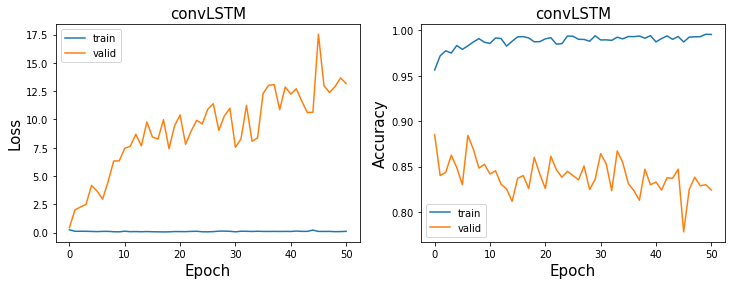

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.46776220202445984
Val loss for epoch 0: 0.5194701552391052
Train loss for epoch 1: 0.1958824098110199
Val loss for epoch 1: 0.9525765180587769
Train loss for epoch 2: 0.1844487339258194
Val loss for epoch 2: 1.9904767274856567
Train loss for epoch 3: 0.16128599643707275
Val loss for epoch 3: 0.8117128014564514
Train loss for epoch 4: 0.16348762810230255
Val loss for epoch 4: 2.1738617420196533
Train loss for epoch 5: 0.15280860662460327
Val loss for epoch 5: 2.2039549350738525
Train loss for epoch 6: 0.14162686467170715
Val loss for epoch 6: 2.4109597206115723
Train loss for epoch 7: 0.15178100764751434
Val loss for epoch 7: 2.3967080116271973
Train loss for epo

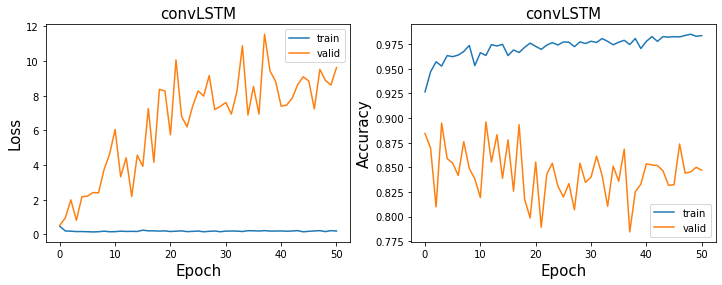

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.4222068786621094
Val loss for epoch 0: 0.5585557222366333
Train loss for epoch 1: 0.2685913145542145
Val loss for epoch 1: 1.4739259481430054
Train loss for epoch 2: 0.22382107377052307
Val loss for epoch 2: 2.48032808303833
Train loss for epoch 3: 0.22611482441425323
Val loss for epoch 3: 4.056520938873291
Train loss for epoch 4: 0.2409375011920929
Val loss for epoch 4: 0.9048432111740112
Train loss for epoch 5: 0.21079297363758087
Val loss for epoch 5: 2.615234136581421
Train loss for epoch 6: 0.22417622804641724
Val loss for epoch 6: 2.1904289722442627
Train loss for epoch 7: 0.22019395232200623
Val loss for epoch 7: 2.250837564468384
Train loss for epoch 8: 

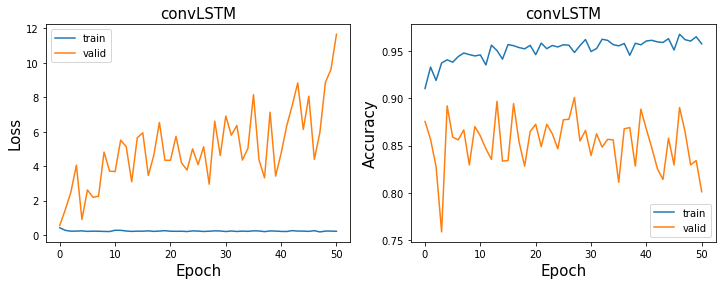

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.8271733522415161
Val loss for epoch 0: 0.42010921239852905
Train loss for epoch 1: 0.12893769145011902
Val loss for epoch 1: 0.4548988342285156
Train loss for epoch 2: 0.10373347997665405
Val loss for epoch 2: 1.259275197982788
Train loss for epoch 3: 0.10325177013874054
Val loss for epoch 3: 2.2249598503112793
Train loss for epoch 4: 0.08341854810714722
Val loss for epoch 4: 2.446075439453125
Train loss for epoch 5: 0.09008380770683289
Val loss for epoch 5: 2.5746724605560303
Train loss for epoch 6: 0.16904331743717194
Val loss for epoch 6: 4.425511360168457
Train loss for epoch 7: 0.11735697090625763
Val loss for epoch 7: 8.395750999450684
Train loss for epoch

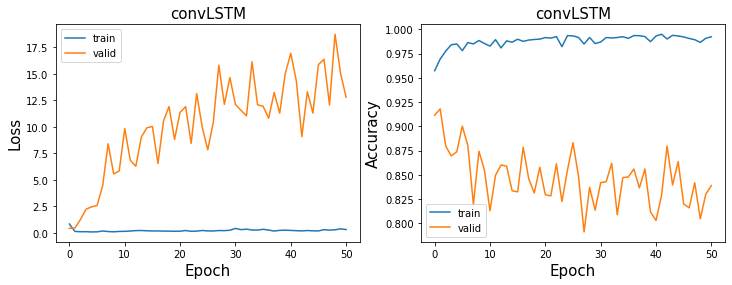

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.755243718624115
Val loss for epoch 0: 0.30445560812950134
Train loss for epoch 1: 0.2354302853345871
Val loss for epoch 1: 0.8672752380371094
Train loss for epoch 2: 0.20231664180755615
Val loss for epoch 2: 1.788872480392456
Train loss for epoch 3: 0.21333761513233185
Val loss for epoch 3: 4.124190330505371
Train loss for epoch 4: 0.20804542303085327
Val loss for epoch 4: 4.432094573974609
Train loss for epoch 5: 0.23716607689857483
Val loss for epoch 5: 3.0885071754455566
Train loss for epoch 6: 0.21450963616371155
Val loss for epoch 6: 4.641408443450928
Train loss for epoch 7: 0.21071980893611908
Val loss for epoch 7: 5.765589237213135
Train loss for epoch 8:

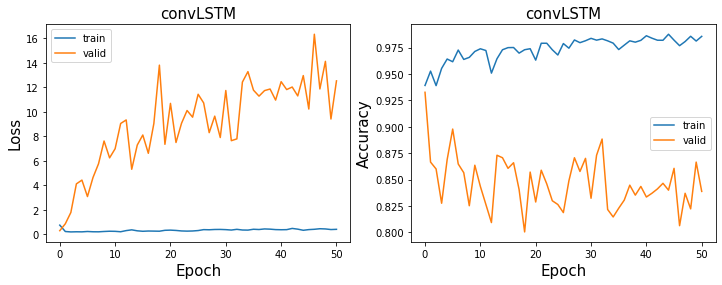

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.511484682559967
Val loss for epoch 0: 0.3667233884334564
Train loss for epoch 1: 0.329118549823761
Val loss for epoch 1: 1.9396719932556152
Train loss for epoch 2: 0.3333756923675537
Val loss for epoch 2: 3.000972032546997
Train loss for epoch 3: 0.3048135042190552
Val loss for epoch 3: 2.253539562225342
Train loss for epoch 4: 0.3023397624492645
Val loss for epoch 4: 3.660360336303711
Train loss for epoch 5: 0.3013007640838623
Val loss for epoch 5: 4.484879970550537
Train loss for epoch 6: 0.30555465817451477
Val loss for epoch 6: 5.026945114135742
Train loss for epoch 7: 0.3580634593963623
Val loss for epoch 7: 4.962085247039795
Train loss for epoch 8: 0.31295

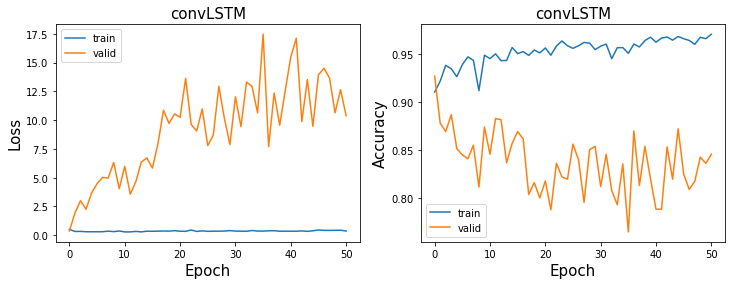

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 6.914702892303467
Val loss for epoch 0: 3.6097640991210938
Train loss for epoch 1: 4.429439544677734
Val loss for epoch 1: 6.950974464416504
2
Train loss for epoch 2: 3.757511854171753
Val loss for epoch 2: 3.064575433731079
Train loss for epoch 3: 3.5439236164093018
Val loss for epoch 3: 8.796919822692871
Train loss for epoch 4: 2.9742414951324463
Val loss for epoch 4: 8.334000587463379
Train loss for epoch 5: 3.0803756713867188
Val loss for epoch 5: 8.005918502807617
Train loss for epoch 6: 2.9641871452331543
Val loss for epoch 6: 14.137422561645508
Train loss for epoch 7: 3.539877414703369
Val loss for epoch 7: 10.834896087646484
Train loss for epoch 8: 3.067

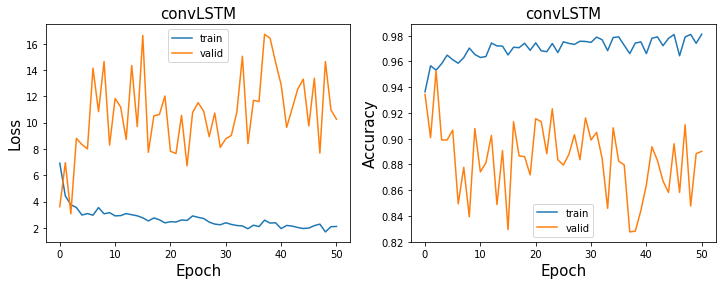

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 9.271880149841309
Val loss for epoch 0: 5.409924507141113
Train loss for epoch 1: 4.5918049812316895
Val loss for epoch 1: 7.151834964752197
2
Train loss for epoch 2: 4.035006523132324
Val loss for epoch 2: 4.43748140335083
Train loss for epoch 3: 3.91641902923584
Val loss for epoch 3: 6.894906520843506
Train loss for epoch 4: 3.6845645904541016
Val loss for epoch 4: 23.232311248779297
Train loss for epoch 5: 3.5513734817504883
Val loss for epoch 5: 10.115140914916992
Train loss for epoch 6: 3.2424802780151367
Val loss for epoch 6: 10.432440757751465
Train loss for epoch 7: 3.428635835647583
Val loss for epoch 7: 11.474579811096191
Train loss for epoch 8: 3.3238

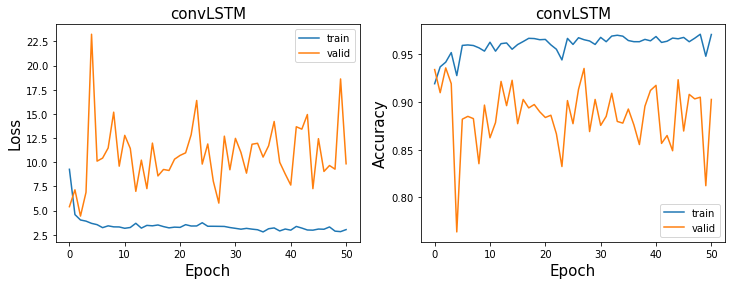

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 4.80918550491333
Val loss for epoch 0: 5.566126346588135
Train loss for epoch 1: 2.6174216270446777
Val loss for epoch 1: 9.575885772705078
Train loss for epoch 2: 2.6047356128692627
Val loss for epoch 2: 9.009464263916016
Train loss for epoch 3: 2.57891583442688
Val loss for epoch 3: 26.351276397705078
Train loss for epoch 4: 2.6792140007019043
Val loss for epoch 4: 18.319835662841797
Train loss for epoch 5: 2.7843918800354004
Val loss for epoch 5: 15.795878410339355
Train loss for epoch 6: 2.468127727508545
Val loss for epoch 6: 19.464256286621094
Train loss for epoch 7: 2.5986547470092773
Val loss for epoch 7: 9.867039680480957
Train loss for epoch 8: 2.54666

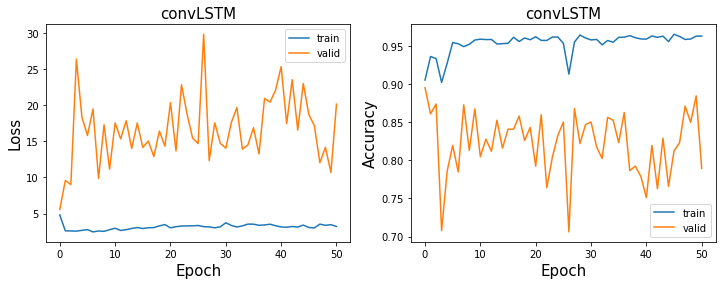

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 8.824995994567871
Val loss for epoch 0: 6.702177047729492
1
Train loss for epoch 1: 4.613338947296143
Val loss for epoch 1: 4.710178375244141
Train loss for epoch 2: 3.9564547538757324
Val loss for epoch 2: 9.526484489440918
Train loss for epoch 3: 3.6579525470733643
Val loss for epoch 3: 6.904827117919922
Train loss for epoch 4: 4.105992794036865
Val loss for epoch 4: 10.927252769470215
Train loss for epoch 5: 3.318464756011963
Val loss for epoch 5: 6.561480522155762
Train loss for epoch 6: 3.1839845180511475
Val loss for epoch 6: 6.469724655151367
Train loss for epoch 7: 3.4818170070648193
Val loss for epoch 7: 10.98932933807373
Train loss for epoch 8: 3.44641

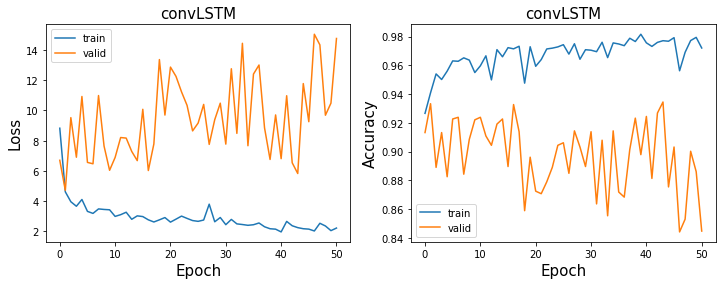

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 5.768603324890137
Val loss for epoch 0: 3.72951340675354
Train loss for epoch 1: 3.7203831672668457
Val loss for epoch 1: 14.44212818145752
Train loss for epoch 2: 3.6249897480010986
Val loss for epoch 2: 12.332257270812988
Train loss for epoch 3: 3.7805795669555664
Val loss for epoch 3: 14.93864917755127
Train loss for epoch 4: 3.686652183532715
Val loss for epoch 4: 12.001542091369629
Train loss for epoch 5: 3.793926477432251
Val loss for epoch 5: 11.471165657043457
Train loss for epoch 6: 3.9508066177368164
Val loss for epoch 6: 8.081382751464844
Train loss for epoch 7: 4.147830486297607
Val loss for epoch 7: 15.499776840209961
Train loss for epoch 8: 4.12489

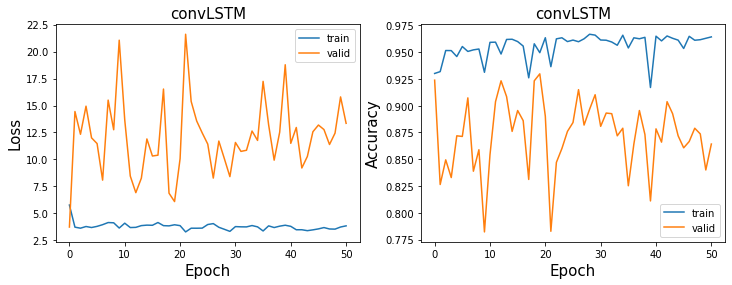

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 6.3887739181518555
Val loss for epoch 0: 15.393738746643066
1
Train loss for epoch 1: 4.233816146850586
Val loss for epoch 1: 7.622952461242676
Train loss for epoch 2: 4.117105960845947
Val loss for epoch 2: 10.67982292175293
Train loss for epoch 3: 3.7112984657287598
Val loss for epoch 3: 16.77457046508789
Train loss for epoch 4: 3.492305040359497
Val loss for epoch 4: 10.080390930175781
Train loss for epoch 5: 3.5291638374328613
Val loss for epoch 5: 22.028968811035156
Train loss for epoch 6: 3.3732800483703613
Val loss for epoch 6: 14.939396858215332
Train loss for epoch 7: 3.5338799953460693
Val loss for epoch 7: 18.031583786010742
Train loss for epoch 8: 3.

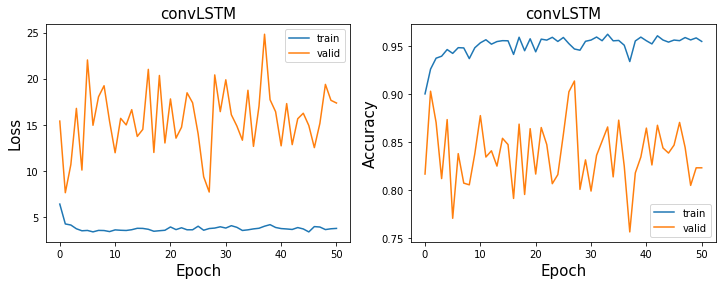

In [17]:
for i in hidden_dim:
    for d in dropout:
        model = convLSTM(input_dim = 62, hidden_dim = i, dropout = d).to(device)
        print(model)
        optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
        criterion = nn.BCELoss() # BCE loss
        train_losses, train_accs, val_losses, val_accs, parameter_history = [], [], [], [],[]

        for epoch in range(num_epochs):
            train_loss, train_acc, parameter_history = train(model, optimizer, criterion, train_loader,  device='cuda')
            val_loss, val_acc = evaluate(model, optimizer, criterion, val_loader, device='cuda')
            train_losses.append(train_loss)
            train_accs.append(train_acc)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
            if epoch == 0:
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))

            if val_loss <= min(val_losses):
                best_epoch = epoch
                print(epoch)
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))
            else:
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))

        #     if epoch == num_epochs-1:
        #         torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_EPOCH{}.pt'.format(model_saving_path, model_type, CH, loss_type, reg_type, alpha, timewindow, epoch))

        train_result_filename =  '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced_trainresult.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch)
        train_result = {'model_type': model_type, 'train_losses' : train_losses, 'val_losses' : val_losses, 'train_accs': train_accs, 'val_accs': val_accs}
        pickle.dump( train_result, open( train_result_filename, "wb" ) )
        plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)

### Balanced result

In [18]:
results = []
for h in hidden_dim:
    for d in dropout:
        model_convLSTM = os.listdir(model_saving_path)

        best_result = 0
        reg_alpha = 'REG'+reg_type+str(alpha)+'_'
        dropout_type = 'DO'+str(d)
        hidden_type = 'HD'+str(h)
        t_len = 'TLEN'+str(T_length)
        for i, s in enumerate(model_convLSTM):
            if 'convLSTM_CHall_' in s and reg_alpha in s and dropout_type in s and 'trainresult' not in s and hidden_type in s and t_len in s and '_balanced' in s and 'valcm' not in s and 'testcm' not in s:
                model_name = model_convLSTM[i].split('_')
                epoch_name = [ind for ind,item in enumerate(np.array(model_name)) if "EPOCH" in item]
                res = [int(i) for i in model_name[epoch_name[0]] if i.isdigit()]
                if len(res) > 1:
                    epoch_result = res[0]*10+res[1]
                else:
                    epoch_result = res[0]
                if epoch_result>best_result and epoch_result != 50:
                    best_result = epoch_result

        results.append([h,d,best_result])

results = pd.DataFrame(np.array(results), columns=['hidden','dropout', 'epoch'])
best_results = results.groupby(['hidden','dropout']).max('epoch')
print(best_results)


                epoch
hidden dropout       
10.0   0.1        0.0
       0.3        0.0
       0.5        0.0
15.0   0.1        0.0
       0.3        0.0
       0.5        0.0
48.0   0.1        2.0
       0.3        2.0
       0.5        0.0
56.0   0.1        1.0
       0.3        0.0
       0.5        1.0


In [19]:
def plot_train_result_file(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch):
    fb = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH50_balanced_trainresult.pt'.format(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    file = open(fb,'rb')
    train_result = pickle.load(file)
    train_losses = train_result['train_losses']
    val_losses = train_result['val_losses']
    train_accs = train_result['train_accs']
    val_accs = train_result['val_accs']
    model_type = train_result['model_type']
    print('best epoch training accuracy: ', train_accs[best_epoch])
    plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)
    

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.956327608982827


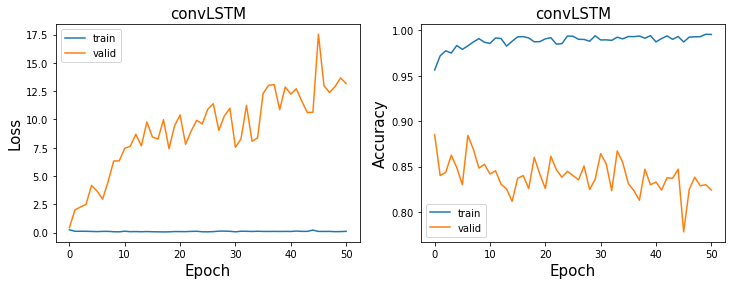

<ipython-input-14-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


validation loss:0.4446771442890167 accuracy:0.8860684769775679
test loss:0.33469682931900024 accuracy:0.9160389898094816
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD10_balanced_valcm.pt


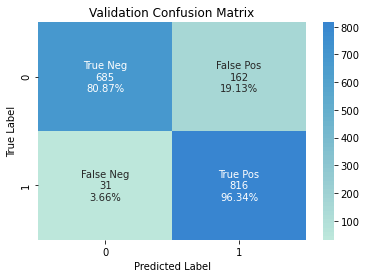

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD10_balanced_testcm.pt


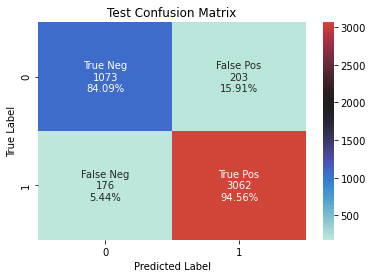

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.926552179656539


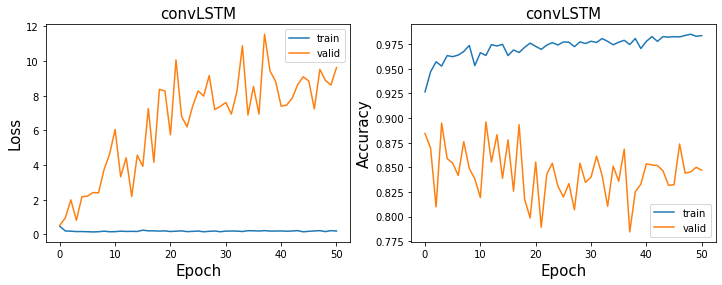

validation loss:0.5686920285224915 accuracy:0.885478158205431
test loss:0.43512681126594543 accuracy:0.9209127159946832
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD10_balanced_valcm.pt


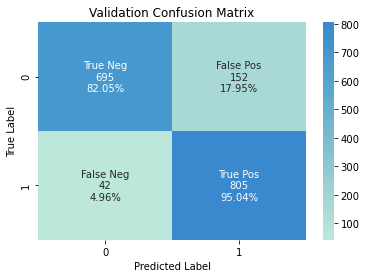

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD10_balanced_testcm.pt


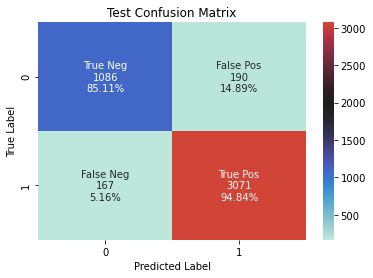

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.9103566710700132


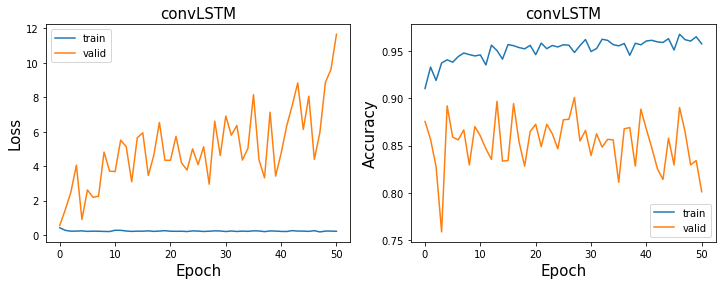

validation loss:0.5897049307823181 accuracy:0.8707201889020071
test loss:0.47481903433799744 accuracy:0.9040762073548959
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD10_balanced_valcm.pt


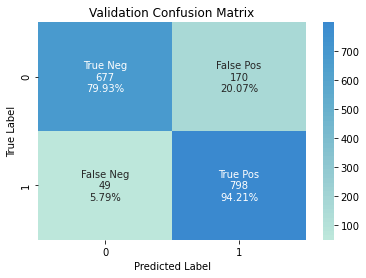

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD10_balanced_testcm.pt


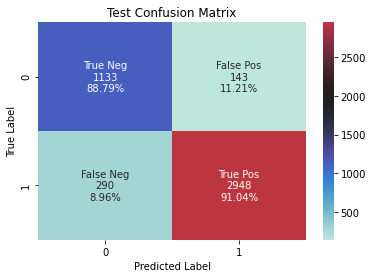

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.9573844121532364


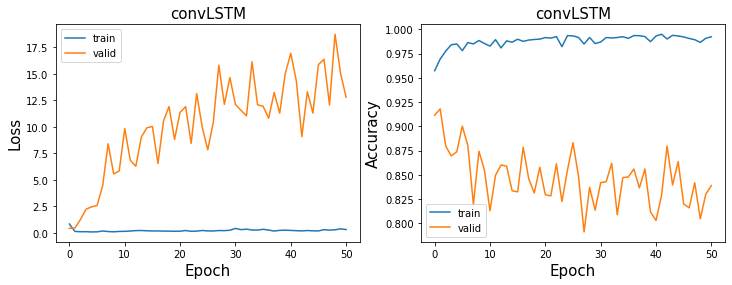

validation loss:0.4070223867893219 accuracy:0.9173553719008265
test loss:0.32177260518074036 accuracy:0.9474966770048737
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD15_balanced_valcm.pt


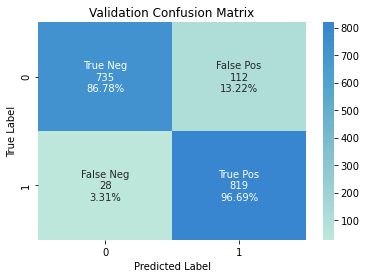

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD15_balanced_testcm.pt


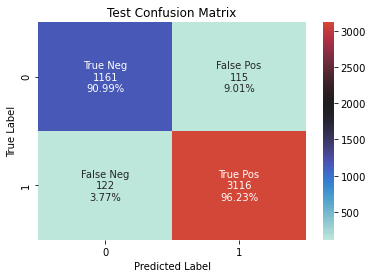

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.9391809775429326


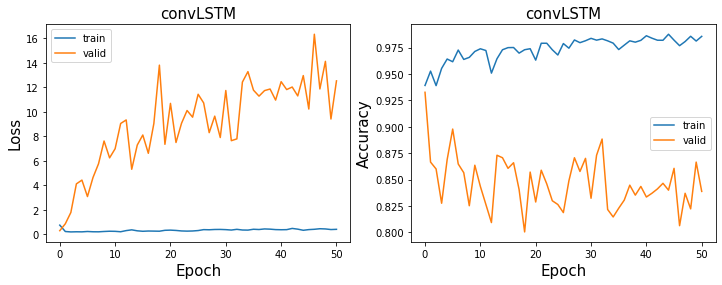

validation loss:0.306618869304657 accuracy:0.935064935064935
test loss:0.36963948607444763 accuracy:0.937306158617634
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD15_balanced_valcm.pt


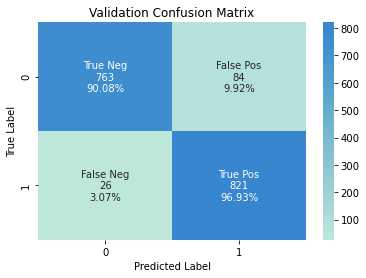

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD15_balanced_testcm.pt


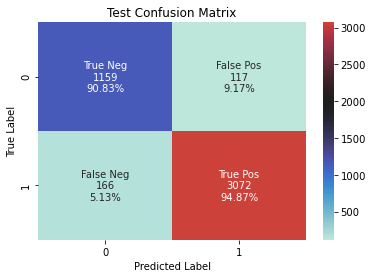

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.9101453104359313


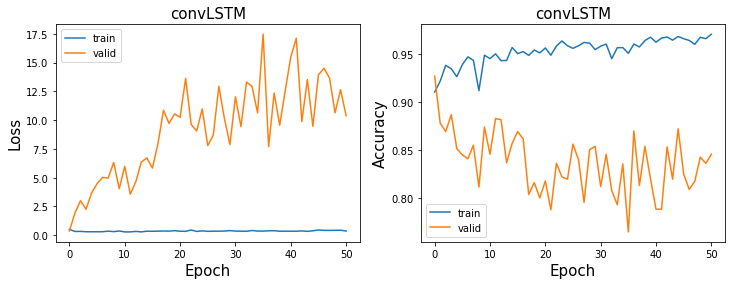

validation loss:0.361934632062912 accuracy:0.9268004722550177
test loss:0.6236427426338196 accuracy:0.9045192733717324
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD15_balanced_valcm.pt


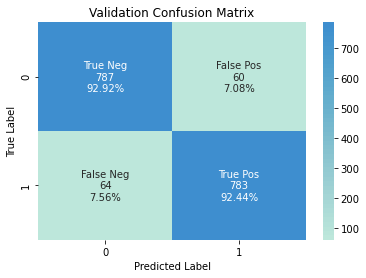

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD15_balanced_testcm.pt


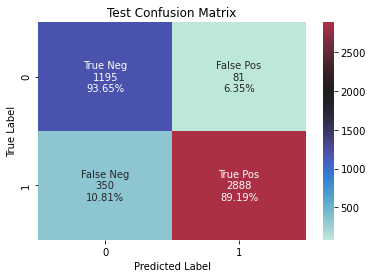

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD48_EPOCH2_balanced.pt
best epoch training accuracy:  0.9532628797886393


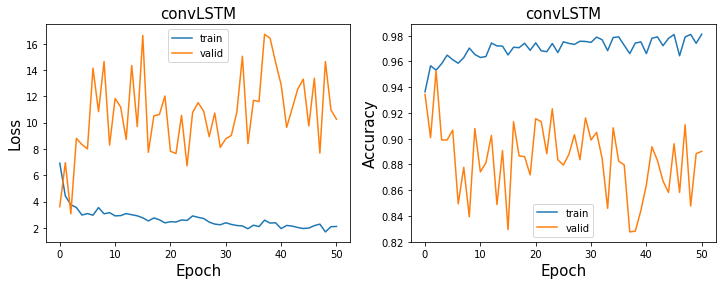

validation loss:3.5283427238464355 accuracy:0.9492325855962219
test loss:3.43129563331604 accuracy:0.9523704031900754
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD48_balanced_valcm.pt


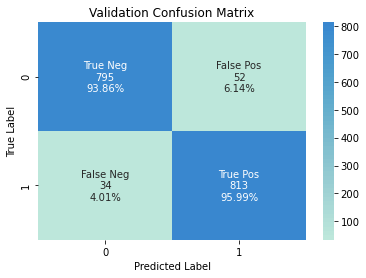

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD48_balanced_testcm.pt


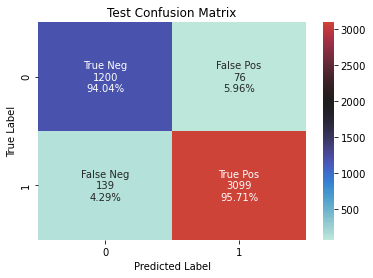

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD48_EPOCH2_balanced.pt
best epoch training accuracy:  0.9416380449141347


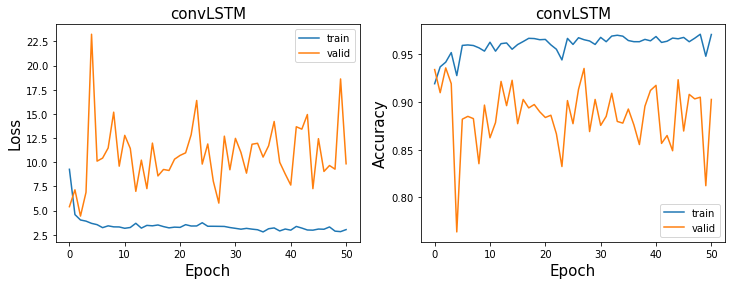

validation loss:4.088657855987549 accuracy:0.9386068476977568
test loss:3.0960030555725098 accuracy:0.9583517944173682
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD48_balanced_valcm.pt


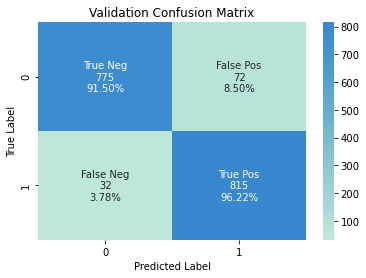

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD48_balanced_testcm.pt


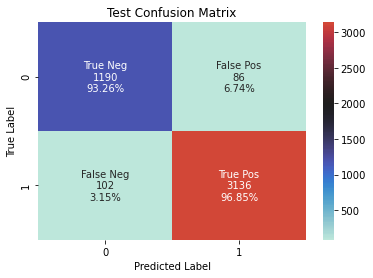

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD48_EPOCH0_balanced.pt
best epoch training accuracy:  0.9050198150594452


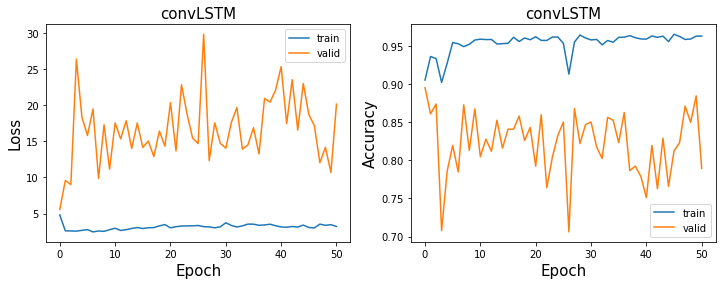

validation loss:6.148074626922607 accuracy:0.8907910271546635
test loss:5.288851261138916 accuracy:0.8774922463447054
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD48_balanced_valcm.pt


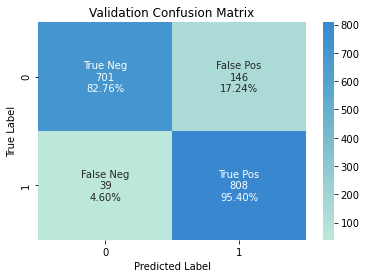

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD48_balanced_testcm.pt


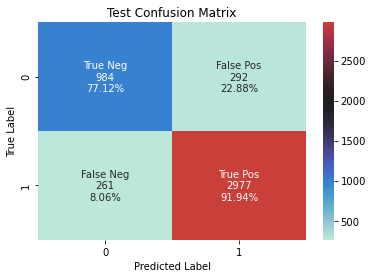

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD56_EPOCH1_balanced.pt
best epoch training accuracy:  0.9408982826948481


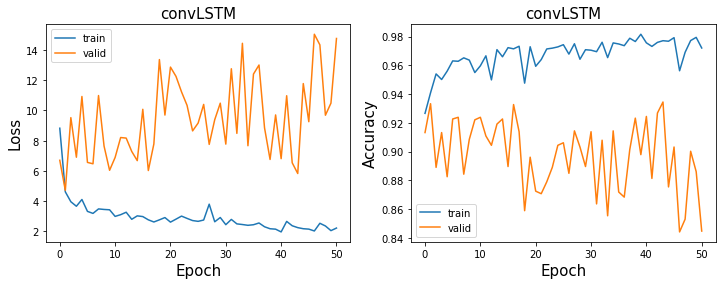

validation loss:5.24586820602417 accuracy:0.9327036599763873
test loss:4.070102691650391 accuracy:0.946832077979619
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD56_balanced_valcm.pt


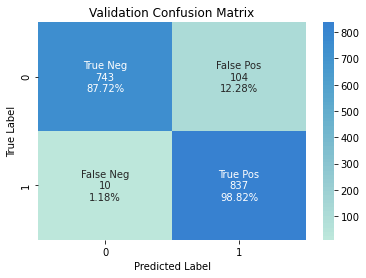

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD56_balanced_testcm.pt


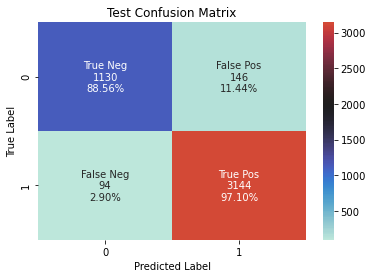

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD56_EPOCH0_balanced.pt
best epoch training accuracy:  0.9301188903566711


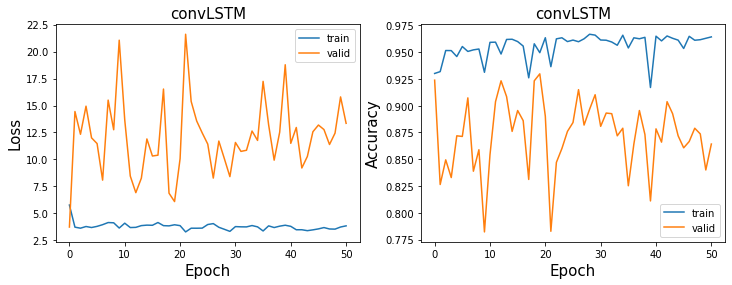

validation loss:4.021160125732422 accuracy:0.9268004722550177
test loss:2.691971778869629 accuracy:0.9472751439964555
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD56_balanced_valcm.pt


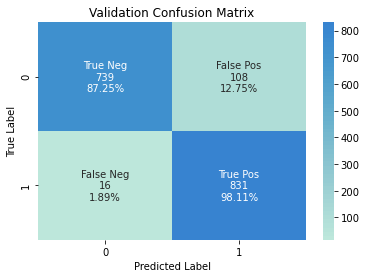

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD56_balanced_testcm.pt


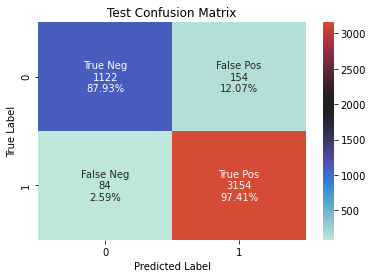

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD56_EPOCH1_balanced.pt
best epoch training accuracy:  0.9261822985468956


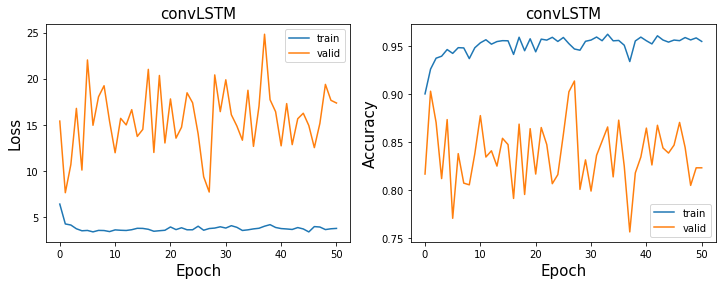

validation loss:8.1934232711792 accuracy:0.9037780401416765
test loss:5.077846050262451 accuracy:0.9326539654408507
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD56_balanced_valcm.pt


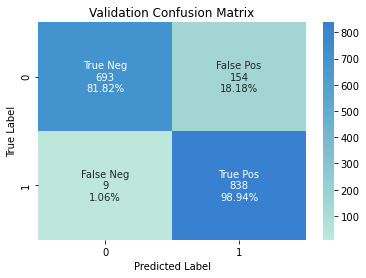

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD56_balanced_testcm.pt


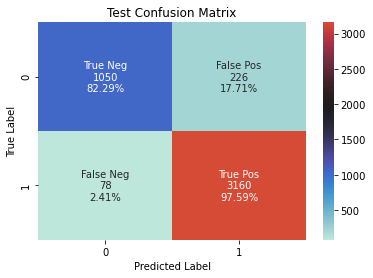

In [23]:
for i,(index,row) in enumerate(best_results.iterrows()):

    best_epoch = int(row)
    hidden = int(index[0])
    dropout = index[1]
    alpha = 0
    
    
    # load best model
    model = convLSTM(input_dim = 62, hidden_dim = hidden).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden,best_epoch)))
    
    print('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, dropout, hidden,best_epoch))

    ## Print Training Result
    plot_train_result_file(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch)
    
    
    ## Calculate validation accuracy and validation loss
    val_loss, val_acc, val_preds, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
    print('validation loss:{} accuracy:{}'.format(val_loss, val_acc))
    
    ## Calculate test accuracy and test loss
    test_loss, test_acc, test_preds, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
    print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
    print(np.mean(np.concatenate(test_labels)))
    
    ## Confusion matrix-validation
    predictions_val = np.concatenate(val_preds)
    labels_val = np.concatenate(val_labels)
    
    val_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_balanced_valcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
    print(val_cm_filename)
    val_cm_result = {'predictions_val': predictions_val, 'labels_val' : labels_val}

    pickle.dump( val_cm_result, open( val_cm_filename, "wb" ) )
    
    
    df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

    cm_val = confusion_matrix(labels_val, predictions_val)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_val.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_val, annot=labels, fmt='', center = 2000)
    ax.set_title('Validation Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    
    ## Confusion matrix-test
    predictions_test = np.concatenate(test_preds)
    labels_test = np.concatenate(test_labels)

    test_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_balanced_testcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
    print(test_cm_filename)
    test_cm_result = {'predictions_test': predictions_test, 'labels_val' : labels_test}

    pickle.dump( test_cm_result, open( test_cm_filename, "wb" ) )

    df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

    cm_test = confusion_matrix(labels_test, predictions_test)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_test.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
    ax.set_title('Test Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    


### Unbalanced result

In [97]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]
# verbose = False

T_length = 3
criterion = nn.BCELoss() # BCE loss

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)


<ipython-input-45-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


0
Train loss for epoch 0: 11.94019889831543
Val loss for epoch 0: 3.1593782901763916
Train loss for epoch 1: 4.926751613616943
Val loss for epoch 1: 3.264551877975464
Train loss for epoch 2: 4.427300453186035
Val loss for epoch 2: 5.076780319213867
Train loss for epoch 3: 4.007021903991699
Val loss for epoch 3: 4.851469039916992
Train loss for epoch 4: 4.117285251617432
Val loss for epoch 4: 5.163518905639648
Train loss for epoch 5: 3.6980810165405273
Val loss for epoch 5: 6.515077114105225
Train loss for epoch 6: 4.202467918395996
Val loss for epoch 6: 3.598294496536255
Train loss for epoch 7: 3.4568662643432617
Val loss for epoch 7: 3.433264970779419
Train loss for epoch 8: 3.2054433822631836
Val loss for epoch 8: 3.805231809616089
Train loss for epoch 9: 2.9023220539093018
Val loss for epoch 9: 4.086544513702393
Train loss for epoch 10: 2.633455991744995
Val loss for epoch 10: 3.4317502975463867
Train loss for epoch 11: 2.635190963745117
Val loss for epoch 11: 4.325346946716309
Trai

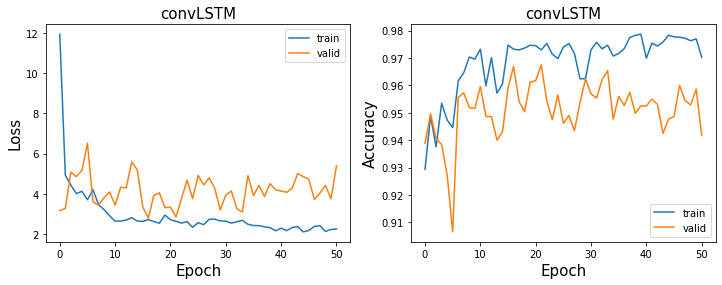

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.69673538208008
Val loss for epoch 0: 16.227825164794922
1
Train loss for epoch 1: 49.99435043334961
Val loss for epoch 1: 16.227825164794922
2
Train loss for epoch 2: 50.00334167480469
Val loss for epoch 2: 16.227825164794922
3
Train loss for epoch 3: 44.08725357055664
Val loss for epoch 3: 7.655144214630127
4
Train loss for epoch 4: 10.862462043762207
Val loss for epoch 4: 4.712141036987305
5
Train loss for epoch 5: 7.607877254486084
Val loss for epoch 5: 3.955045223236084
Train loss for epoch 6: 7.120599269866943
Val loss for epoch 6: 8.56387710571289
7
Train loss for epoch 7: 6.006754398345947
Val loss for epoch 7: 2.6214439868927
Train loss for epoch 8: 5

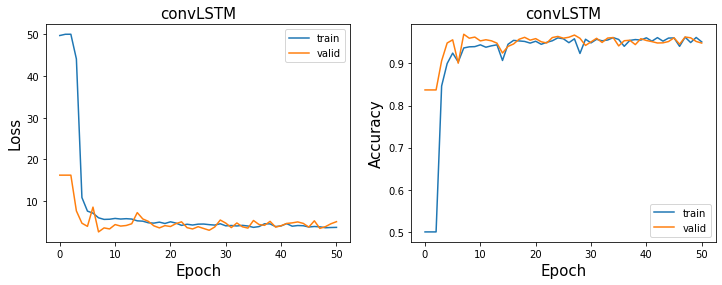

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 4.007354259490967
Val loss for epoch 0: 1.5985691547393799
Train loss for epoch 1: 1.9411640167236328
Val loss for epoch 1: 3.315852642059326
Train loss for epoch 2: 2.0217652320861816
Val loss for epoch 2: 5.47257661819458
Train loss for epoch 3: 2.0654549598693848
Val loss for epoch 3: 3.7962992191314697
Train loss for epoch 4: 2.236928701400757
Val loss for epoch 4: 5.8898515701293945
Train loss for epoch 5: 2.3535821437835693
Val loss for epoch 5: 6.244114875793457
Train loss for epoch 6: 2.388103723526001
Val loss for epoch 6: 3.8152267932891846
Train loss for epoch 7: 2.4665708541870117
Val loss for epoch 7: 3.568640947341919
Train loss for epoch 8: 2.4645

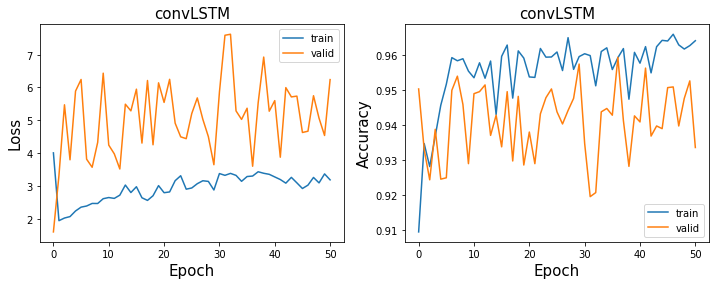

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 8.390238761901855
Val loss for epoch 0: 5.345871925354004
1
Train loss for epoch 1: 5.560336112976074
Val loss for epoch 1: 4.284160614013672
2
Train loss for epoch 2: 4.3590850830078125
Val loss for epoch 2: 3.2799882888793945
3
Train loss for epoch 3: 4.3737473487854
Val loss for epoch 3: 2.6758406162261963
Train loss for epoch 4: 3.9903573989868164
Val loss for epoch 4: 3.149235725402832
Train loss for epoch 5: 3.9961957931518555
Val loss for epoch 5: 2.8182263374328613
6
Train loss for epoch 6: 4.049222469329834
Val loss for epoch 6: 2.2187585830688477
Train loss for epoch 7: 4.003917694091797
Val loss for epoch 7: 4.4313530921936035
Train loss for epoch 8: 

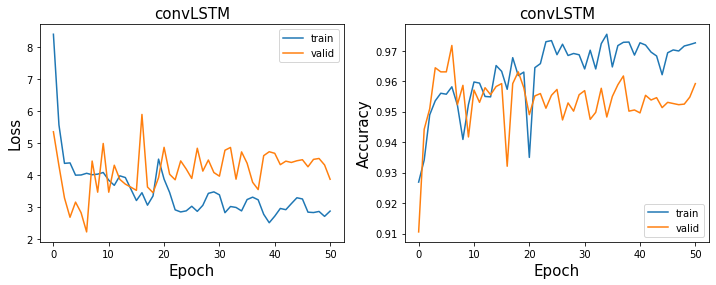

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.72147750854492
Val loss for epoch 0: 16.227825164794922
1
Train loss for epoch 1: 50.0078010559082
Val loss for epoch 1: 16.227825164794922
2
Train loss for epoch 2: 50.0
Val loss for epoch 2: 16.227825164794922
3
Train loss for epoch 3: 50.00334167480469
Val loss for epoch 3: 16.227825164794922
4
Train loss for epoch 4: 49.997772216796875
Val loss for epoch 4: 16.227825164794922
5
Train loss for epoch 5: 49.99665832519531
Val loss for epoch 5: 16.227825164794922
6
Train loss for epoch 6: 50.008914947509766
Val loss for epoch 6: 16.227825164794922
7
Train loss for epoch 7: 50.0078010559082
Val loss for epoch 7: 16.227825164794922
8
Train loss for epoch 8: 50.

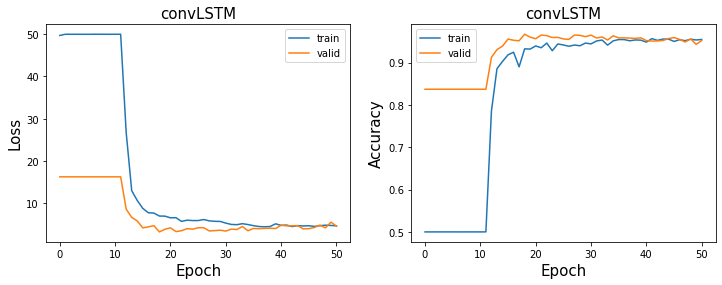

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 14.789912223815918
Val loss for epoch 0: 3.1100268363952637
Train loss for epoch 1: 6.716820240020752
Val loss for epoch 1: 5.256534099578857
Train loss for epoch 2: 6.174325466156006
Val loss for epoch 2: 3.455143928527832
Train loss for epoch 3: 6.290910243988037
Val loss for epoch 3: 4.5202789306640625
Train loss for epoch 4: 5.395873546600342
Val loss for epoch 4: 3.6907269954681396
Train loss for epoch 5: 4.938194274902344
Val loss for epoch 5: 4.845873832702637
Train loss for epoch 6: 5.121754169464111
Val loss for epoch 6: 5.155856609344482
Train loss for epoch 7: 4.730916500091553
Val loss for epoch 7: 7.447141170501709
Train loss for epoch 8: 4.74349927

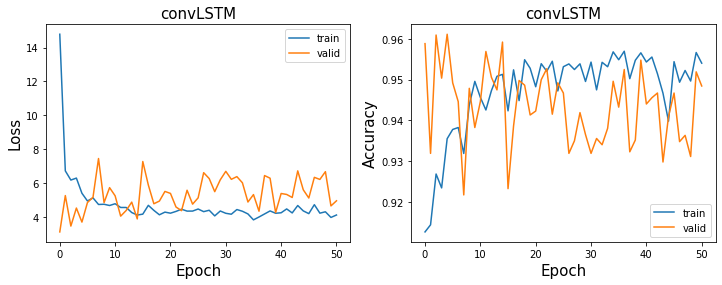

In [49]:
for i in hidden_dim:
    for d in dropout:
        model = convLSTM(input_dim = 62, hidden_dim = i, dropout = d).to(device)
        print(model)
        optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
        criterion = nn.BCELoss() # BCE loss
        train_losses, train_accs, val_losses, val_accs, parameter_history = [], [], [], [],[]

        for epoch in range(num_epochs):
            train_loss, train_acc, parameter_history = train(model, optimizer, criterion, train_loader,  device='cuda')
            val_loss, val_acc = evaluate(model, optimizer, criterion, val_loader, device='cuda')
            train_losses.append(train_loss)
            train_accs.append(train_acc)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
            if epoch == 0:
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))

            if val_loss <= min(val_losses):
                best_epoch = epoch
                print(epoch)
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))
            else:
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))

        #     if epoch == num_epochs-1:
        #         torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_EPOCH{}.pt'.format(model_saving_path, model_type, CH, loss_type, reg_type, alpha, timewindow, epoch))

        train_result_filename =  '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_trainresult.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch)
        train_result = {'model_type': model_type, 'train_losses' : train_losses, 'val_losses' : val_losses, 'train_accs': train_accs, 'val_accs': val_accs}
        pickle.dump( train_result, open( train_result_filename, "wb" ) )
        plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)

In [98]:
results = []
for h in hidden_dim:
    for d in dropout:
        model_convLSTM = os.listdir(model_saving_path)

        best_result = 0
        reg_alpha = 'REG'+reg_type+str(alpha)+'_'
        dropout_type = 'DO'+str(d)
        hidden_type = 'HD'+str(h)
        t_len = 'TLEN'+str(T_length)
        for i, s in enumerate(model_convLSTM):
            if 'convLSTM_CHall_' in s and reg_alpha in s and dropout_type in s and 'trainresult' not in s and hidden_type in s and t_len in s and '_balanced' not in s and 'valcm' not in s and 'testcm' not in s:
                model_name = model_convLSTM[i].split('_')
                epoch_name = [ind for ind,item in enumerate(np.array(model_name)) if "EPOCH" in item]
                res = [int(i) for i in model_name[epoch_name[0]] if i.isdigit()]
                if len(res) > 1:
                    epoch_result = res[0]*10+res[1]
                else:
                    epoch_result = res[0]
                if epoch_result>best_result and epoch_result != 50:
                    best_result = epoch_result

        results.append([h,d,best_result])

results = pd.DataFrame(np.array(results), columns=['hidden','dropout', 'epoch'])
best_results = results.groupby(['hidden','dropout']).max('epoch')
print(best_results)


                epoch
hidden dropout       
10.0   0.1        0.0
       0.3        1.0
       0.5        0.0
15.0   0.1        4.0
       0.3        0.0
       0.5        1.0
48.0   0.1       16.0
       0.3        7.0
       0.5        0.0
56.0   0.1        6.0
       0.3       18.0
       0.5        0.0


In [99]:
def plot_train_result_file(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch):
    fb = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH50_trainresult.pt'.format(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    file = open(fb,'rb')
    train_result = pickle.load(file)
    train_losses = train_result['train_losses']
    val_losses = train_result['val_losses']
    train_accs = train_result['train_accs']
    val_accs = train_result['val_accs']
    model_type = train_result['model_type']
    print('best epoch training accuracy: ', train_accs[best_epoch])
    plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)
    

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD10_EPOCH0.pt
best epoch training accuracy:  0.950330250990753


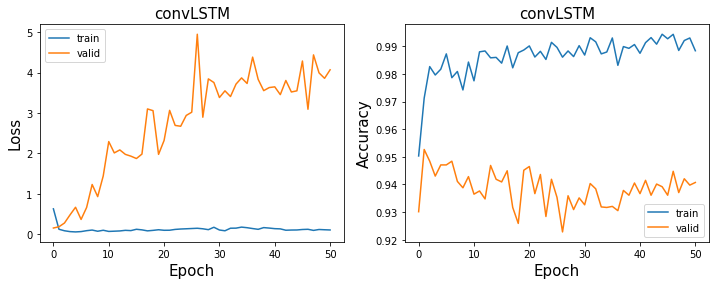

<ipython-input-66-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


validation loss:0.15803532302379608 accuracy:0.9301520107754474
test loss:0.18890772759914398 accuracy:0.934647762516615
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD10_valcm.pt


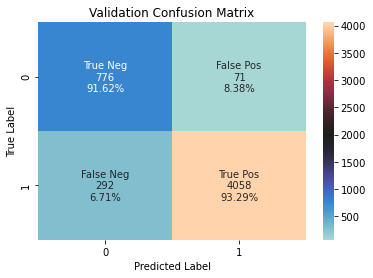

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD10_testcm.pt


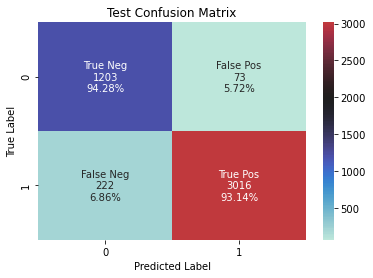

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD10_EPOCH1.pt
best epoch training accuracy:  0.9338969616908851


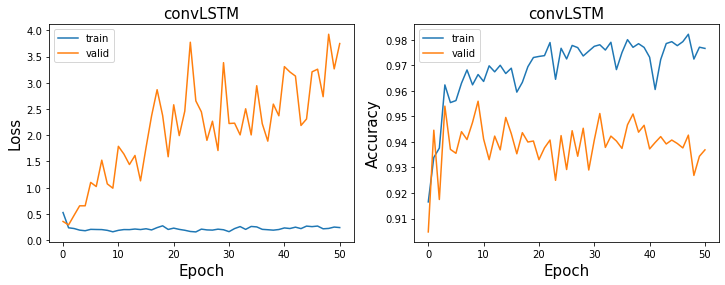

validation loss:0.2888258993625641 accuracy:0.944583413507793
test loss:0.5098956227302551 accuracy:0.9266725742135579
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD10_valcm.pt


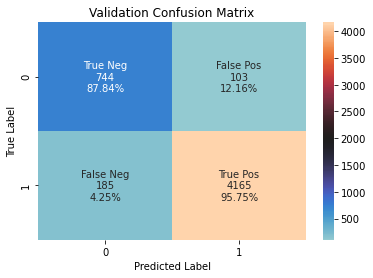

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD10_testcm.pt


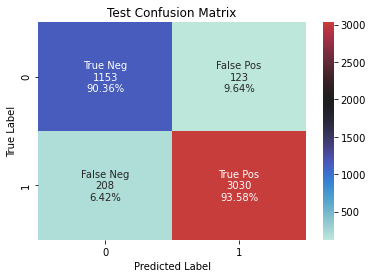

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD10_EPOCH0.pt
best epoch training accuracy:  0.8897490092470277


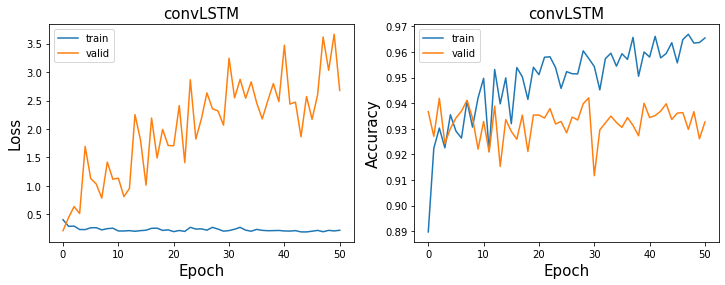

validation loss:0.2114621102809906 accuracy:0.9366942466807774
test loss:0.3900872766971588 accuracy:0.9153743907842269
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD10_valcm.pt


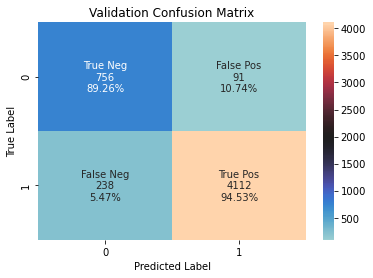

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD10_testcm.pt


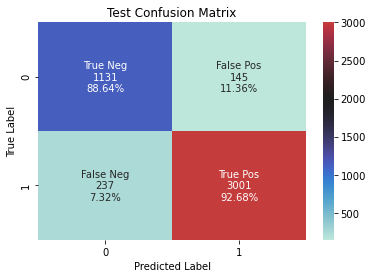

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD15_EPOCH4.pt
best epoch training accuracy:  0.9762747688243065


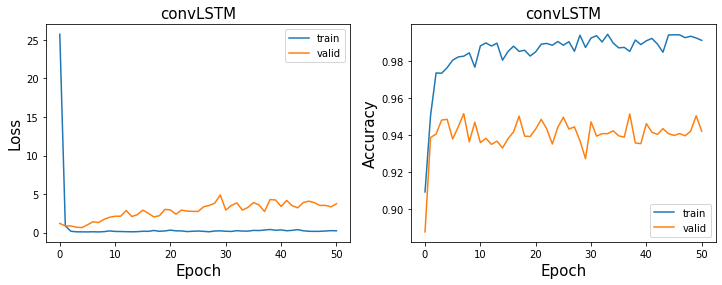

validation loss:0.6596776247024536 accuracy:0.9484317875697518
test loss:0.7112962603569031 accuracy:0.9397430217102348
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD15_valcm.pt


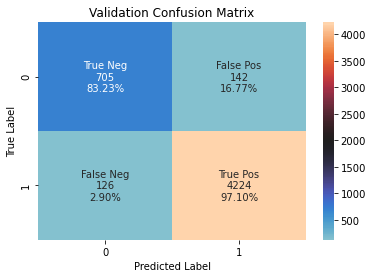

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD15_testcm.pt


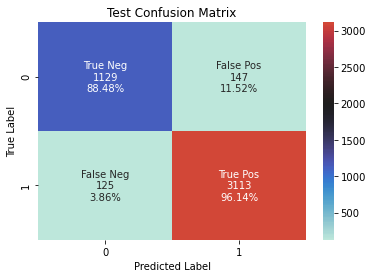

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD15_EPOCH0.pt
best epoch training accuracy:  0.9370145310435931


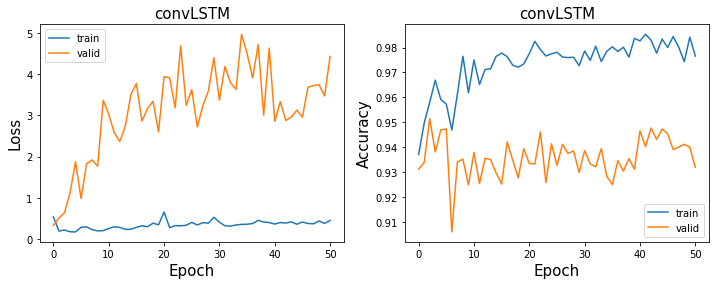

validation loss:0.3281862437725067 accuracy:0.9311141042909371
test loss:0.4253256022930145 accuracy:0.9173681878599912
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD15_valcm.pt


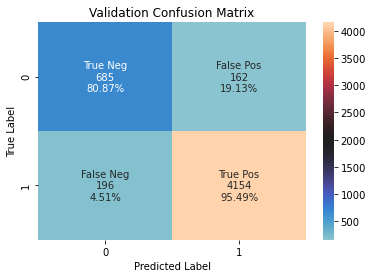

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD15_testcm.pt


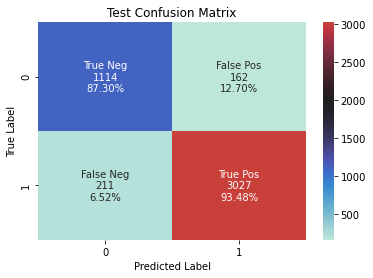

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD15_EPOCH1.pt
best epoch training accuracy:  0.8968560105680317


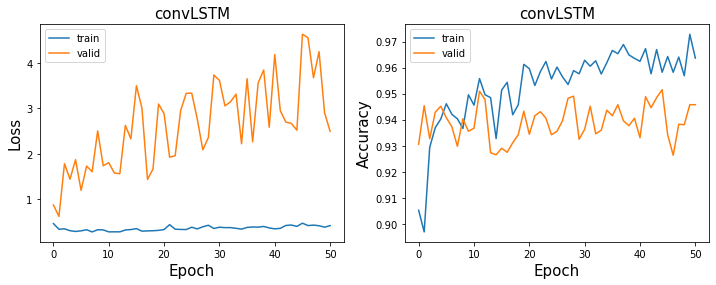

validation loss:0.6234265565872192 accuracy:0.9453530883201847
test loss:0.8827449083328247 accuracy:0.9087284005316792
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD15_valcm.pt


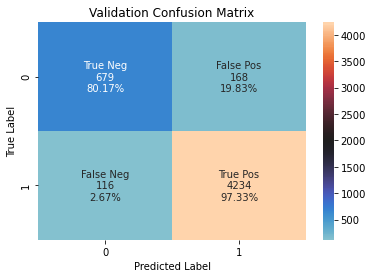

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD15_testcm.pt


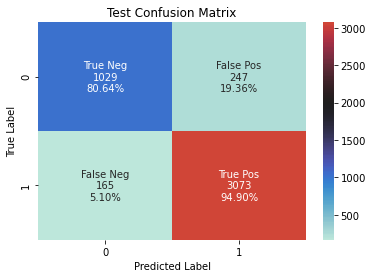

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD48_EPOCH16.pt
best epoch training accuracy:  0.9732100396301189


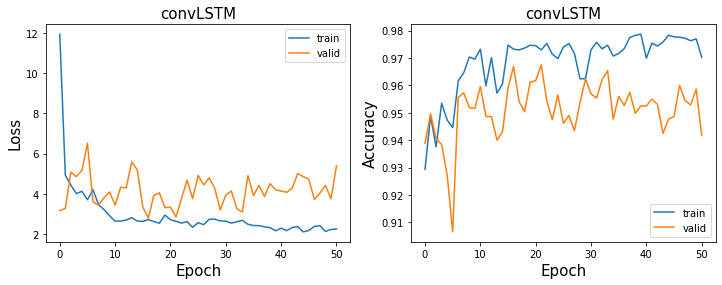

validation loss:2.7476465702056885 accuracy:0.9669039830671541
test loss:4.150696754455566 accuracy:0.9514842711564023
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD48_valcm.pt


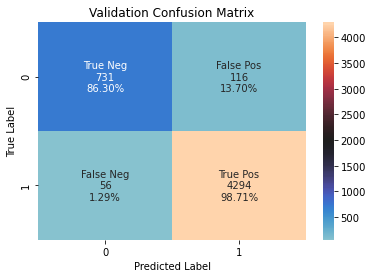

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD48_testcm.pt


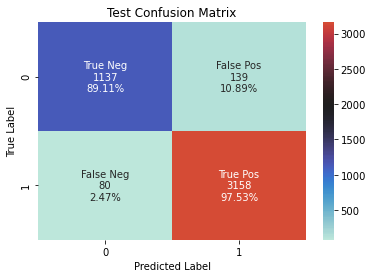

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD48_EPOCH7.pt
best epoch training accuracy:  0.93667107001321


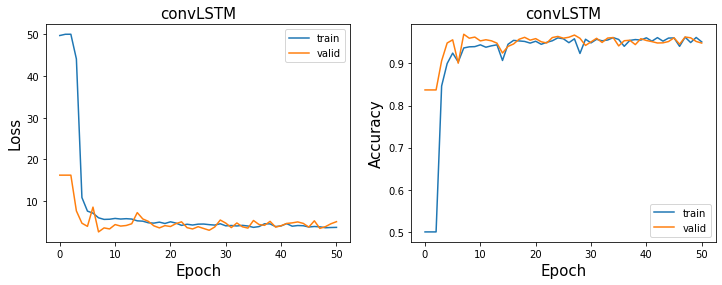

validation loss:2.6083714962005615 accuracy:0.9692130075043294
test loss:4.352497577667236 accuracy:0.9541426672574214
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD48_valcm.pt


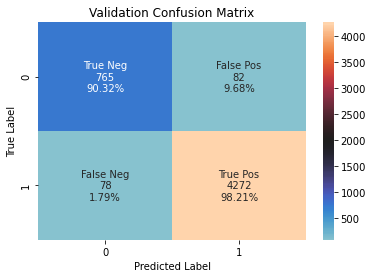

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD48_testcm.pt


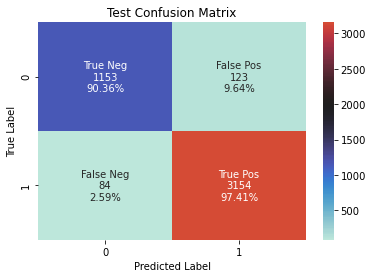

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD48_EPOCH0.pt
best epoch training accuracy:  0.9094848084544254


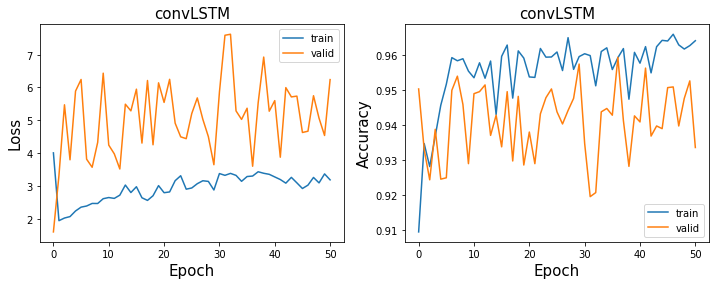

validation loss:1.5899144411087036 accuracy:0.9503559746007312
test loss:2.6784441471099854 accuracy:0.9395214887018166
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD48_valcm.pt


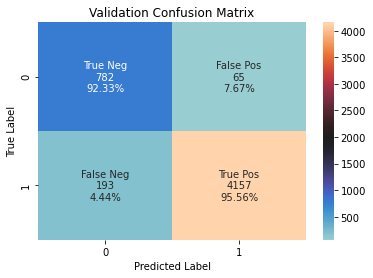

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD48_testcm.pt


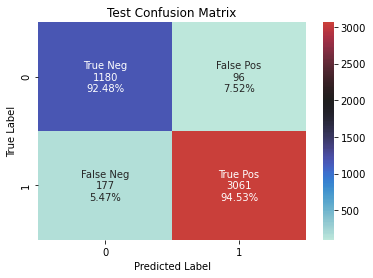

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD56_EPOCH6.pt
best epoch training accuracy:  0.9581505944517834


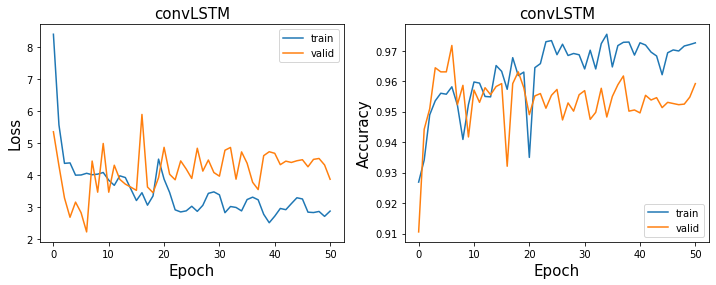

validation loss:2.180896282196045 accuracy:0.9717144506446026
test loss:3.8827388286590576 accuracy:0.9548072662826761
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD56_valcm.pt


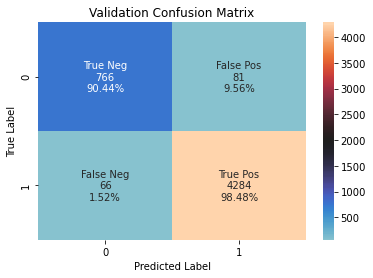

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.1_HD56_testcm.pt


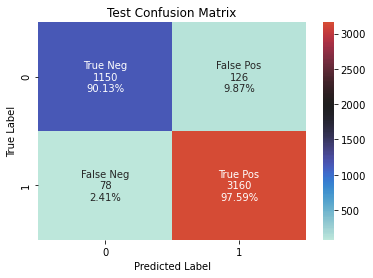

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD56_EPOCH18.pt
best epoch training accuracy:  0.9323910171730515


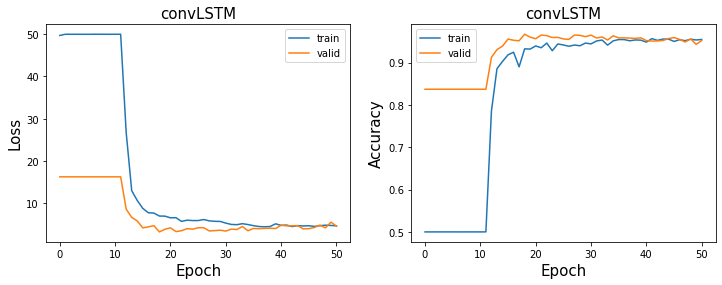

validation loss:3.1493008136749268 accuracy:0.9669039830671541
test loss:5.978695869445801 accuracy:0.9386353566681436
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD56_valcm.pt


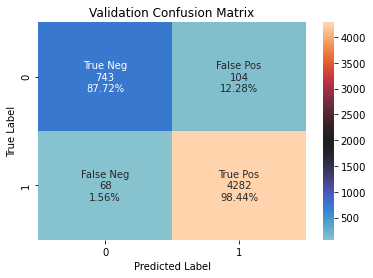

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.3_HD56_testcm.pt


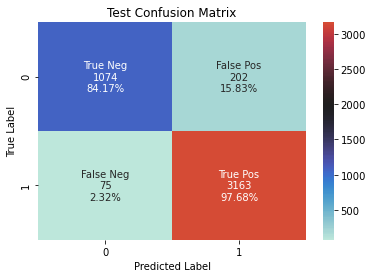

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD56_EPOCH0.pt
best epoch training accuracy:  0.9126023778071334


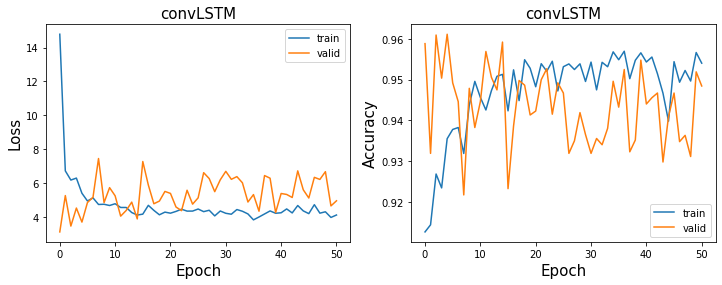

validation loss:3.0974061489105225 accuracy:0.9588223975370406
test loss:6.1614227294921875 accuracy:0.9308817013735047
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD56_valcm.pt


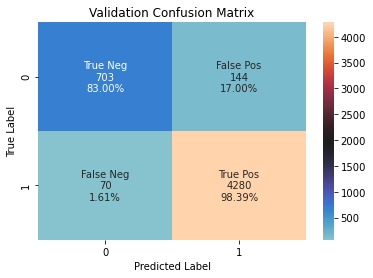

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN3_DO0.5_HD56_testcm.pt


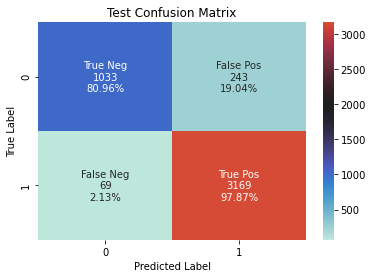

In [100]:
for i,(index,row) in enumerate(best_results.iterrows()):

    best_epoch = int(row)
    hidden = int(index[0])
    dropout = index[1]
    alpha = 0
    
    
    # load best model
    model = convLSTM(input_dim = 62, hidden_dim = hidden).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden,best_epoch)))
    
    print('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, dropout, hidden,best_epoch))

    ## Print Training Result
    plot_train_result_file(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch)
    
    
    ## Calculate validation accuracy and validation loss
    val_loss, val_acc, val_preds, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
    print('validation loss:{} accuracy:{}'.format(val_loss, val_acc))
    
    ## Calculate test accuracy and test loss
    test_loss, test_acc, test_preds, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
    print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
    print(np.mean(np.concatenate(test_labels)))
    
    ## Confusion matrix-validation
    predictions_val = np.concatenate(val_preds)
    labels_val = np.concatenate(val_labels)
    
    val_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_valcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
    print(val_cm_filename)
    val_cm_result = {'predictions_val': predictions_val, 'labels_val' : labels_val}

    pickle.dump( val_cm_result, open( val_cm_filename, "wb" ) )
    
    
    df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

    cm_val = confusion_matrix(labels_val, predictions_val)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_val.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_val, annot=labels, fmt='', center = 2000)
    ax.set_title('Validation Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    
    ## Confusion matrix-test
    predictions_test = np.concatenate(test_preds)
    labels_test = np.concatenate(test_labels)

    test_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_testcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
    print(test_cm_filename)
    test_cm_result = {'predictions_test': predictions_test, 'labels_val' : labels_test}

    pickle.dump( test_cm_result, open( test_cm_filename, "wb" ) )

    df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

    cm_test = confusion_matrix(labels_test, predictions_test)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_test.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
    ax.set_title('Test Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    


## T-length = 5

In [140]:
time_window = 10
T_length = 5
## Load files
move_files, sleep_files = create_files_new(load_path, bad_dates, T_length=T_length, proceed=1)
train_files, val_files, test_files = [], [], []

## Put files in val, test, and train
for f in move_files+sleep_files:
    if f:
        if f[0][1][3] in val_dates:
            val_files.extend(f)
        elif f[0][1][3] in test_dates:
            test_files.extend(f)
        else:
            train_files.extend(f)           

In [141]:
## Randomly shuffle inside train, val, and test
random.shuffle(train_files)
random.shuffle(val_files)
random.shuffle(test_files)

In [142]:
## Upsample train
train_files = upsample(train_files)

In [143]:
## Balance val 
sleep_files = []
move_files = []
for t in range(len(val_files)):
    if 'sleep' in val_files[t][0]:
        sleep_files.append(val_files[t])
    if 'move' in val_files[t][0]:
        move_files.append(val_files[t])

sleep_sample = sample(sleep_files, len(move_files))
val_2_files = sleep_sample+move_files

In [144]:
len(train_files), len(val_files), len(test_files)

(33680, 4325, 3523)

In [145]:
## Load files to dataloader
T_length = 5

# train_dataset = SpectrogramDatasetAtt(files=train_files, load_path=load_path, T_length=T_length, all_label=True)
# valid_dataset = SpectrogramDatasetAtt(files=val_2_files, load_path=load_path, T_length=T_length, all_label=True)
# test_dataset = SpectrogramDatasetAtt(files=test_files, load_path=load_path, T_length=T_length, all_label=True)

train_dataset = SpectrogramDatasetAtt(files=train_files, load_path=load_path, T_length=T_length, all_label=True)
valid_dataset = SpectrogramDatasetAtt(files=val_files, load_path=load_path, T_length=T_length, all_label=True)
test_dataset = SpectrogramDatasetAtt(files=test_files, load_path=load_path, T_length=T_length, all_label=True)

train_loader = DataLoader(dataset=train_dataset, batch_size=128, shuffle = True)
val_loader = DataLoader(dataset=valid_dataset, batch_size=128, shuffle = False)
test_loader = DataLoader(dataset=test_dataset, batch_size=128, shuffle = False)

### Training

In [146]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
# verbose = False
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]




convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)


<ipython-input-14-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


0
Train loss for epoch 0: 0.7152562737464905
Val loss for epoch 0: 0.24738851189613342
Train loss for epoch 1: 0.12265459448099136
Val loss for epoch 1: 0.879295825958252
Train loss for epoch 2: 0.11579329520463943
Val loss for epoch 2: 0.6581742763519287
Train loss for epoch 3: 0.09370321780443192
Val loss for epoch 3: 0.542549729347229
Train loss for epoch 4: 0.08603962510824203
Val loss for epoch 4: 1.5576491355895996
Train loss for epoch 5: 0.07804903388023376
Val loss for epoch 5: 1.964267373085022
Train loss for epoch 6: 0.08032698929309845
Val loss for epoch 6: 3.0934858322143555
Train loss for epoch 7: 0.06807343661785126
Val loss for epoch 7: 4.810281753540039
Train loss for epoch 8: 0.053523898124694824
Val loss for epoch 8: 3.592026472091675
Train loss for epoch 9: 0.07245531678199768
Val loss for epoch 9: 3.4943313598632812
Train loss for epoch 10: 0.0674801617860794
Val loss for epoch 10: 3.993335247039795
Train loss for epoch 11: 0.07166637480258942
Val loss for epoch 11:

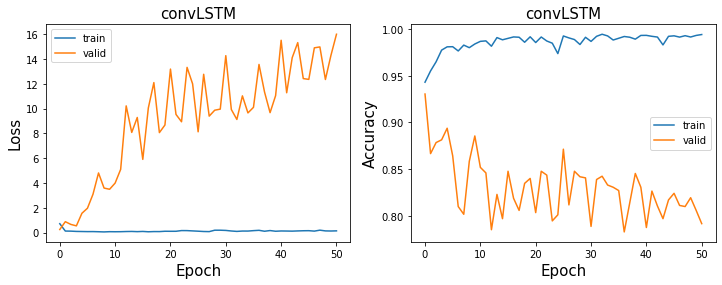

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.41858938336372375
Val loss for epoch 0: 0.6908261775970459
Train loss for epoch 1: 0.21381065249443054
Val loss for epoch 1: 0.9897776246070862
Train loss for epoch 2: 0.1814524382352829
Val loss for epoch 2: 1.9313340187072754
Train loss for epoch 3: 0.16940851509571075
Val loss for epoch 3: 2.8472132682800293
Train loss for epoch 4: 0.15888622403144836
Val loss for epoch 4: 2.636798620223999
Train loss for epoch 5: 0.19584934413433075
Val loss for epoch 5: 2.2912983894348145
Train loss for epoch 6: 0.21192863583564758
Val loss for epoch 6: 3.0909712314605713
Train loss for epoch 7: 0.20856733620166779
Val loss for epoch 7: 3.265929937362671
Train loss for epoc

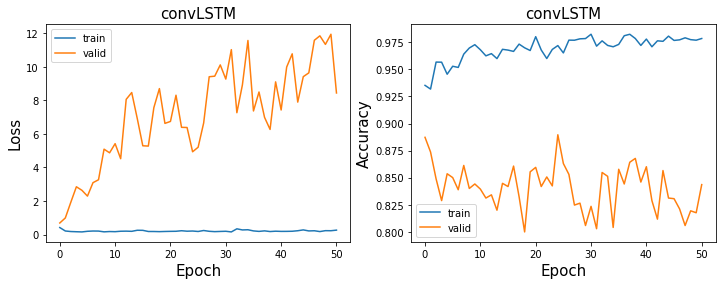

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.38259631395339966
Val loss for epoch 0: 0.6647427082061768
Train loss for epoch 1: 0.25359445810317993
Val loss for epoch 1: 1.0642658472061157
Train loss for epoch 2: 0.23277172446250916
Val loss for epoch 2: 3.053576707839966
Train loss for epoch 3: 0.23434104025363922
Val loss for epoch 3: 2.077570915222168
Train loss for epoch 4: 0.24255384504795074
Val loss for epoch 4: 2.1530349254608154
Train loss for epoch 5: 0.22248026728630066
Val loss for epoch 5: 4.557241916656494
Train loss for epoch 6: 0.2253396064043045
Val loss for epoch 6: 4.3172783851623535
Train loss for epoch 7: 0.23202672600746155
Val loss for epoch 7: 3.3407351970672607
Train loss for epoch

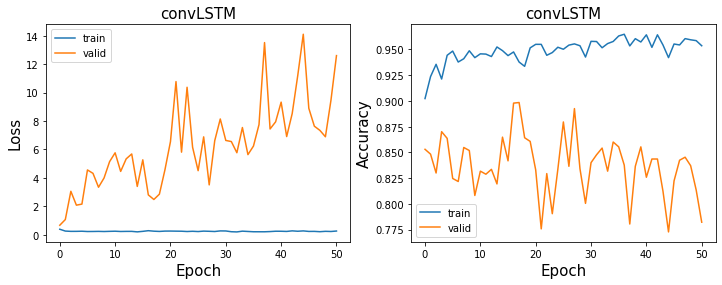

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 1.2393476963043213
Val loss for epoch 0: 0.33222267031669617
Train loss for epoch 1: 0.1320028156042099
Val loss for epoch 1: 0.9198408722877502
Train loss for epoch 2: 0.11293942481279373
Val loss for epoch 2: 1.434515357017517
Train loss for epoch 3: 0.10133030265569687
Val loss for epoch 3: 2.1251158714294434
Train loss for epoch 4: 0.10848094522953033
Val loss for epoch 4: 4.420799732208252
Train loss for epoch 5: 0.08321721106767654
Val loss for epoch 5: 5.918198108673096
Train loss for epoch 6: 0.08023589104413986
Val loss for epoch 6: 2.8046443462371826
Train loss for epoch 7: 0.1283293515443802
Val loss for epoch 7: 2.844719409942627
Train loss for epoch 8

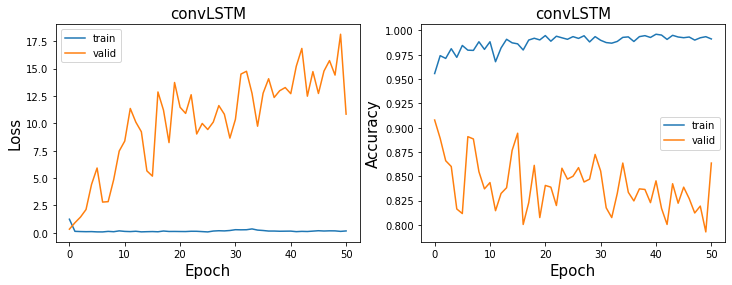

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.553637683391571
Val loss for epoch 0: 0.9093855619430542
Train loss for epoch 1: 0.30765244364738464
Val loss for epoch 1: 2.134436845779419
Train loss for epoch 2: 0.2923058867454529
Val loss for epoch 2: 2.2558867931365967
Train loss for epoch 3: 0.23837533593177795
Val loss for epoch 3: 4.580389499664307
Train loss for epoch 4: 0.2529464364051819
Val loss for epoch 4: 6.26521635055542
Train loss for epoch 5: 0.27237164974212646
Val loss for epoch 5: 5.7325568199157715
Train loss for epoch 6: 0.22213296592235565
Val loss for epoch 6: 7.43913459777832
Train loss for epoch 7: 0.19948968291282654
Val loss for epoch 7: 5.956728935241699
Train loss for epoch 8: 0.2

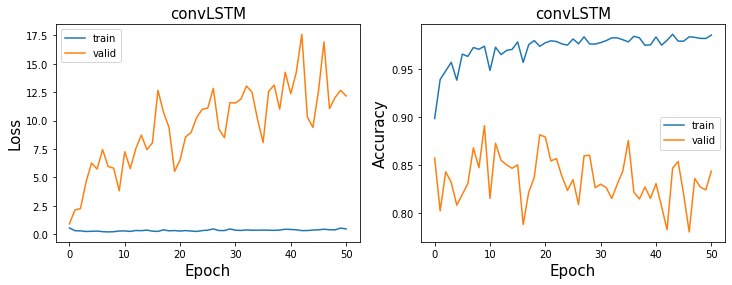

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.5303069949150085
Val loss for epoch 0: 0.40392741560935974
Train loss for epoch 1: 0.28942927718162537
Val loss for epoch 1: 1.4448726177215576
Train loss for epoch 2: 0.25570231676101685
Val loss for epoch 2: 2.0426154136657715
Train loss for epoch 3: 0.25261372327804565
Val loss for epoch 3: 1.774718999862671
Train loss for epoch 4: 0.2589493691921234
Val loss for epoch 4: 2.662595510482788
Train loss for epoch 5: 0.27008140087127686
Val loss for epoch 5: 5.849991798400879
Train loss for epoch 6: 0.25885963439941406
Val loss for epoch 6: 3.851863384246826
Train loss for epoch 7: 0.26431745290756226
Val loss for epoch 7: 4.617871284484863
Train loss for epoch 8

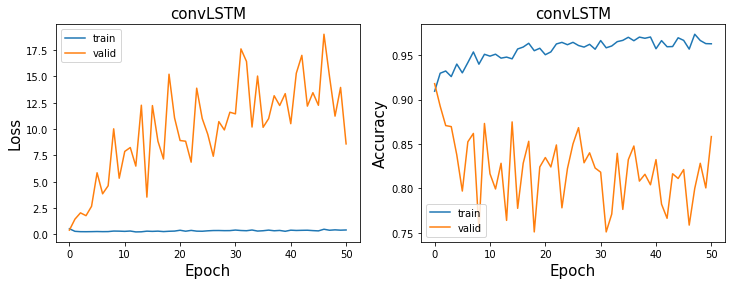

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.7229118347168
Val loss for epoch 0: 52.734378814697266
1
Train loss for epoch 1: 49.98997116088867
Val loss for epoch 1: 52.734378814697266
2
Train loss for epoch 2: 49.985103607177734
Val loss for epoch 2: 52.734378814697266
3
Train loss for epoch 3: 50.00557327270508
Val loss for epoch 3: 52.734378814697266
4
Train loss for epoch 4: 50.00070571899414
Val loss for epoch 4: 52.734378814697266
5
Train loss for epoch 5: 50.00334167480469
Val loss for epoch 5: 52.734378814697266
6
Train loss for epoch 6: 50.00505065917969
Val loss for epoch 6: 52.734378814697266
7
Train loss for epoch 7: 50.00111770629883
Val loss for epoch 7: 52.734378814697266
8
Train loss for

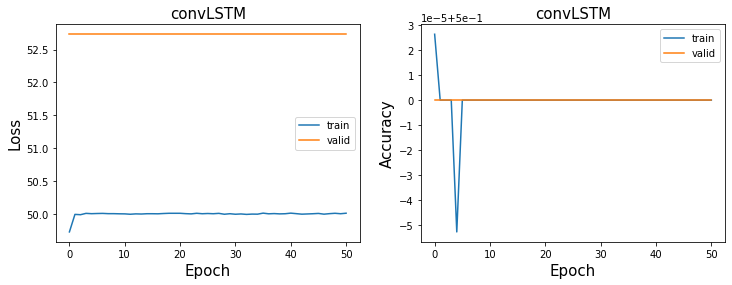

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 5.425948619842529
Val loss for epoch 0: 13.460221290588379
Train loss for epoch 1: 4.381457805633545
Val loss for epoch 1: 23.16425323486328
2
Train loss for epoch 2: 3.94946551322937
Val loss for epoch 2: 8.885363578796387
Train loss for epoch 3: 3.8160276412963867
Val loss for epoch 3: 13.9243745803833
Train loss for epoch 4: 3.385986089706421
Val loss for epoch 4: 11.935616493225098
5
Train loss for epoch 5: 3.3934195041656494
Val loss for epoch 5: 4.210493087768555
Train loss for epoch 6: 3.2337520122528076
Val loss for epoch 6: 16.96870994567871
Train loss for epoch 7: 3.397296190261841
Val loss for epoch 7: 12.991124153137207
Train loss for epoch 8: 3.3029

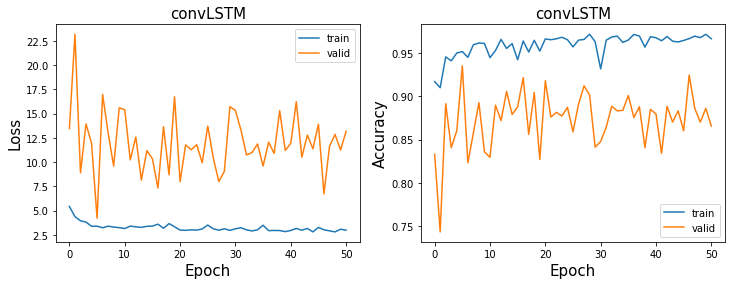

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 8.055747985839844
Val loss for epoch 0: 6.01899528503418
Train loss for epoch 1: 3.68046498298645
Val loss for epoch 1: 6.037728309631348
Train loss for epoch 2: 3.0913712978363037
Val loss for epoch 2: 7.825033664703369
Train loss for epoch 3: 3.040729522705078
Val loss for epoch 3: 16.387399673461914
Train loss for epoch 4: 3.1774649620056152
Val loss for epoch 4: 17.230873107910156
Train loss for epoch 5: 3.216050624847412
Val loss for epoch 5: 11.132558822631836
Train loss for epoch 6: 3.283151149749756
Val loss for epoch 6: 14.926102638244629
Train loss for epoch 7: 3.2486705780029297
Val loss for epoch 7: 15.964816093444824
Train loss for epoch 8: 3.294092

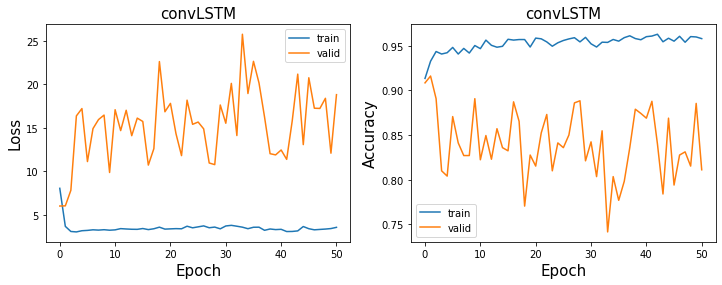

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 9.186079025268555
Val loss for epoch 0: 7.2472357749938965
1
Train loss for epoch 1: 5.78999137878418
Val loss for epoch 1: 6.465896129608154
Train loss for epoch 2: 5.3552117347717285
Val loss for epoch 2: 7.840348720550537
3
Train loss for epoch 3: 4.667888164520264
Val loss for epoch 3: 5.7900214195251465
4
Train loss for epoch 4: 4.7469916343688965
Val loss for epoch 4: 5.755029201507568
Train loss for epoch 5: 4.477379322052002
Val loss for epoch 5: 5.967068195343018
Train loss for epoch 6: 5.002234935760498
Val loss for epoch 6: 6.546159267425537
Train loss for epoch 7: 3.8907196521759033
Val loss for epoch 7: 8.516448974609375
Train loss for epoch 8: 3.84

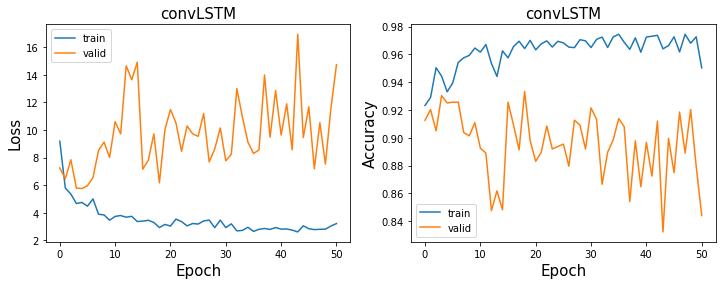

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 6.426852226257324
Val loss for epoch 0: 8.455074310302734
Train loss for epoch 1: 4.464810848236084
Val loss for epoch 1: 11.286288261413574
2
Train loss for epoch 2: 4.750164031982422
Val loss for epoch 2: 7.819372653961182
Train loss for epoch 3: 4.477684497833252
Val loss for epoch 3: 12.533843040466309
Train loss for epoch 4: 4.090720176696777
Val loss for epoch 4: 8.836686134338379
Train loss for epoch 5: 4.1889801025390625
Val loss for epoch 5: 9.632723808288574
Train loss for epoch 6: 4.289817810058594
Val loss for epoch 6: 9.208949089050293
7
Train loss for epoch 7: 4.4965128898620605
Val loss for epoch 7: 6.7500386238098145
Train loss for epoch 8: 4.317

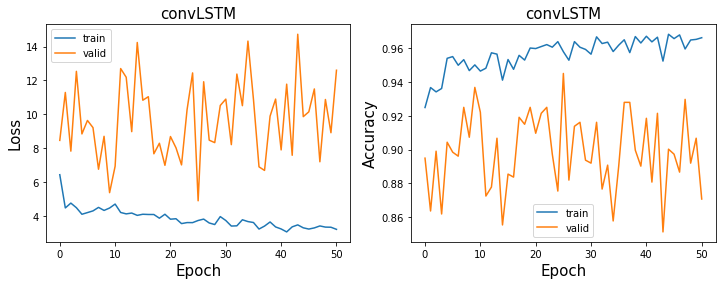

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 5.6285080909729
Val loss for epoch 0: 18.50874137878418
1
Train loss for epoch 1: 3.2281932830810547
Val loss for epoch 1: 16.14849853515625
2
Train loss for epoch 2: 3.4056293964385986
Val loss for epoch 2: 12.701257705688477
Train loss for epoch 3: 3.5988614559173584
Val loss for epoch 3: 17.090612411499023
Train loss for epoch 4: 3.5745248794555664
Val loss for epoch 4: 27.339923858642578
Train loss for epoch 5: 3.797086715698242
Val loss for epoch 5: 14.642247200012207
Train loss for epoch 6: 3.538585901260376
Val loss for epoch 6: 15.744012832641602
7
Train loss for epoch 7: 3.696058511734009
Val loss for epoch 7: 10.91190242767334
Train loss for epoch 8: 3

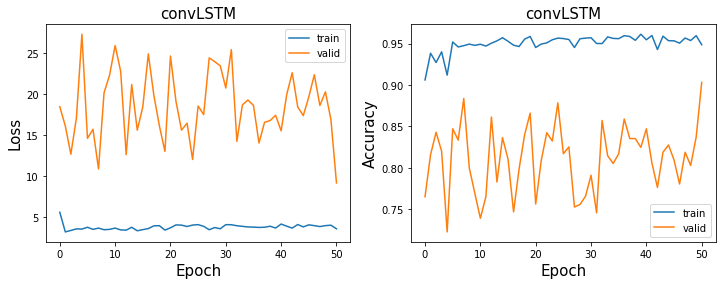

In [28]:
for i in hidden_dim:
    for d in dropout:
        model = convLSTM(input_dim = 62, hidden_dim = i, dropout = d).to(device)
        print(model)
        optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
        criterion = nn.BCELoss() # BCE loss
        train_losses, train_accs, val_losses, val_accs, parameter_history = [], [], [], [],[]

        for epoch in range(num_epochs):
            train_loss, train_acc, parameter_history = train(model, optimizer, criterion, train_loader,  device='cuda')
            val_loss, val_acc = evaluate(model, optimizer, criterion, val_loader, device='cuda')
            train_losses.append(train_loss)
            train_accs.append(train_acc)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
            if epoch == 0:
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length,d, i,epoch))
            if val_loss <= min(val_losses):
                best_epoch = epoch
                print(epoch)
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length,d, i,epoch))
        #     elif verbose:
            else:
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))

        #     if epoch == num_epochs-1:
        #         torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_EPOCH{}.pt'.format(model_saving_path, model_type, CH, loss_type, reg_type, alpha, timewindow, epoch))
        train_result_filename =  '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_EPOCH{}_balanced_trainresult.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length,d, i,epoch)
        train_result = {'model_type': model_type, 'train_losses' : train_losses, 'val_losses' : val_losses, 'train_accs': train_accs, 'val_accs': val_accs}
        pickle.dump( train_result, open( train_result_filename, "wb" ) )
        plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)

In [31]:
def plot_train_result_file(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch):
    fb = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_EPOCH50_balanced_trainresult.pt'.format(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    file = open(fb,'rb')
    train_result = pickle.load(file)
    train_losses = train_result['train_losses']
    val_losses = train_result['val_losses']
    train_accs = train_result['train_accs']
    val_accs = train_result['val_accs']
    model_type = train_result['model_type']
    print('best epoch training accuracy: ', train_accs[best_epoch])
    plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)
    

### Balanced Result

In [32]:
results = []
for h in hidden_dim:
    for d in dropout:
        model_convLSTM = os.listdir(model_saving_path)

        best_result = 0
        reg_alpha = 'REG'+reg_type+str(alpha)+'_'
        dropout_type = 'DO'+str(d)
        hidden_type = 'HD'+str(h)
        t_len = 'TLENGTH'+str(T_length)
        for i, s in enumerate(model_convLSTM):
            if 'convLSTM_CHall_' in s and reg_alpha in s and dropout_type in s and 'trainresult' not in s and hidden_type in s and t_len in s and 'valcm' not in s and 'testcm' not in s and 'balanced' in s:
                model_name = model_convLSTM[i].split('_')
                epoch_name = [ind for ind,item in enumerate(np.array(model_name)) if "EPOCH" in item]
                res = [int(i) for i in model_name[epoch_name[0]] if i.isdigit()]
                if len(res) > 1:
                    epoch_result = res[0]*10+res[1]
                else:
                    epoch_result = res[0]
                if epoch_result>best_result and epoch_result != 50:
                    best_result = epoch_result

        results.append([h,d,best_result])

results = pd.DataFrame(np.array(results), columns=['hidden','dropout', 'epoch'])
best_results = results.groupby(['hidden','dropout']).max('epoch')
print(best_results)


                epoch
hidden dropout       
10.0   0.1        0.0
       0.3        0.0
       0.5        0.0
15.0   0.1        0.0
       0.3        0.0
       0.5        0.0
48.0   0.1       49.0
       0.3        5.0
       0.5        0.0
56.0   0.1        4.0
       0.3       25.0
       0.5        7.0


/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.9430118890356671


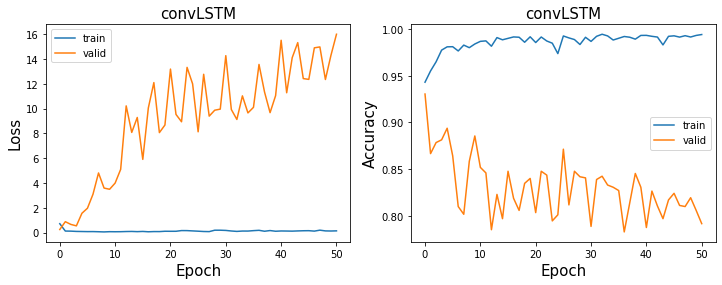

<ipython-input-14-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


validation loss:0.27648434042930603 accuracy:0.9327036599763873
test loss:0.20329774916172028 accuracy:0.9450598139122729
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD10_balanced_valcm.pt


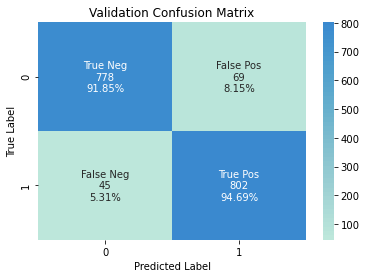

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD10_balanced_testcm.pt


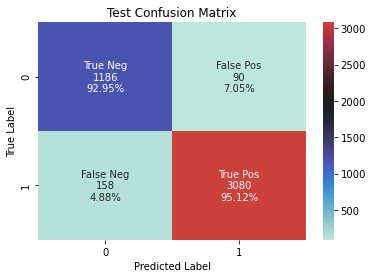

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.9352443857331572


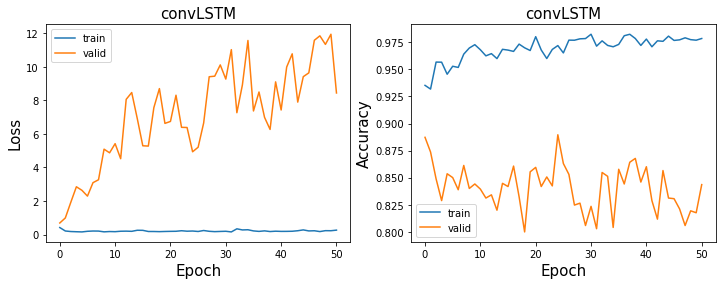

validation loss:0.7038094401359558 accuracy:0.8890200708382526
test loss:0.32976213097572327 accuracy:0.9370846256092158
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD10_balanced_valcm.pt


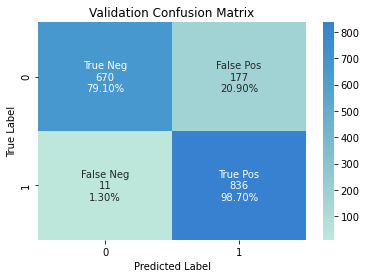

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD10_balanced_testcm.pt


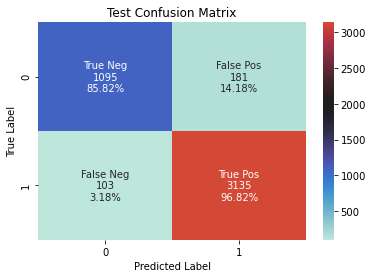

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.9022985468956407


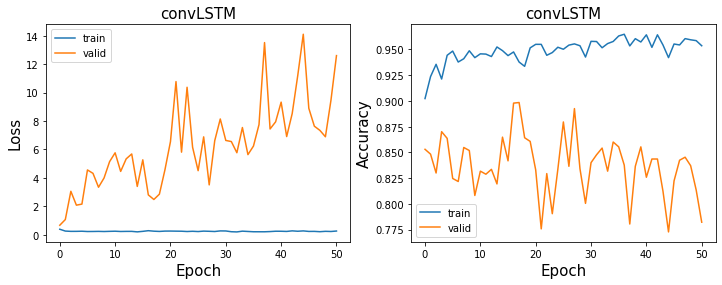

validation loss:0.6868197321891785 accuracy:0.8530106257378984
test loss:0.5348106622695923 accuracy:0.898094816127603
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD10_balanced_valcm.pt


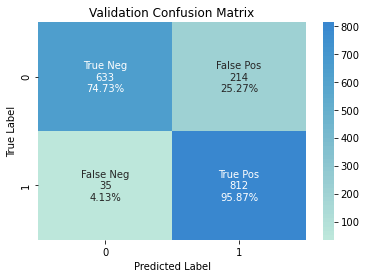

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD10_balanced_testcm.pt


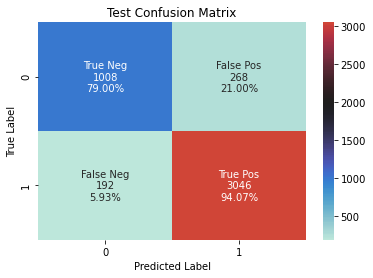

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.9557199471598414


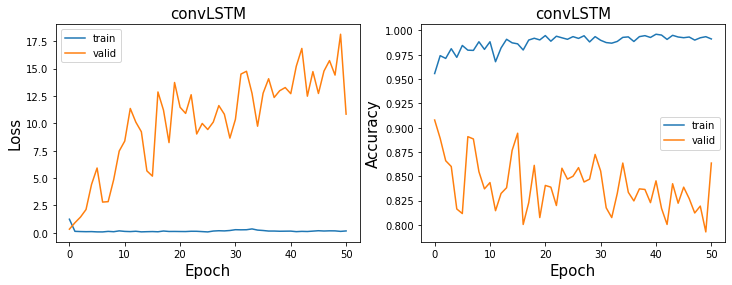

validation loss:0.33370140194892883 accuracy:0.9155844155844156
test loss:0.30469584465026855 accuracy:0.9224634470536109
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD15_balanced_valcm.pt


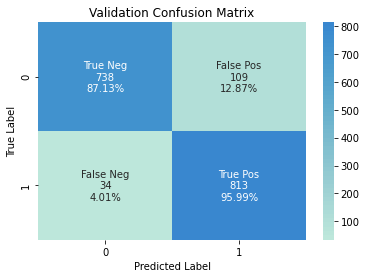

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD15_balanced_testcm.pt


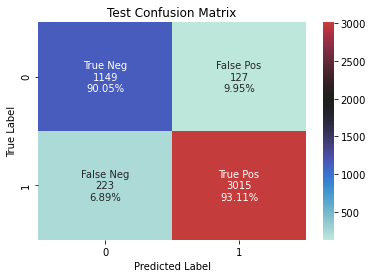

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.8982034346103038


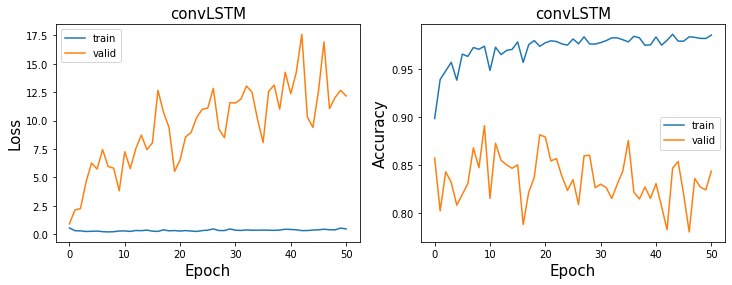

validation loss:0.9321606755256653 accuracy:0.8618654073199528
test loss:0.5306165814399719 accuracy:0.9136021267168808
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD15_balanced_valcm.pt


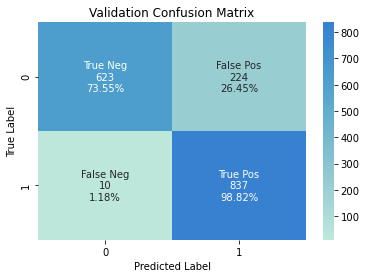

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD15_balanced_testcm.pt


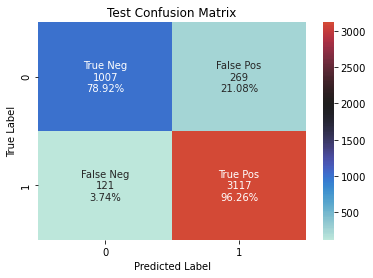

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.9094055482166447


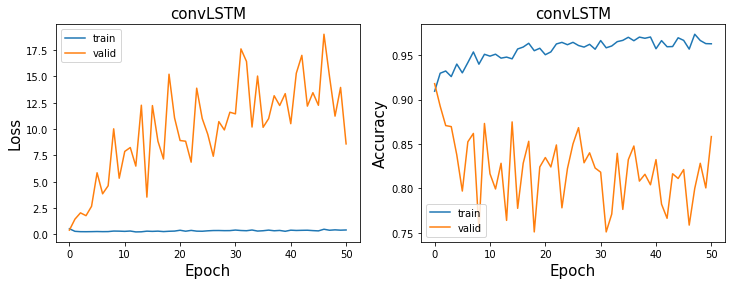

validation loss:0.4263824224472046 accuracy:0.922077922077922
test loss:0.6052827835083008 accuracy:0.9217988480283562
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD15_balanced_valcm.pt


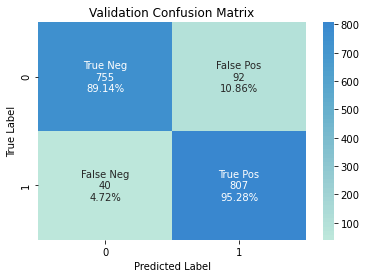

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD15_balanced_testcm.pt


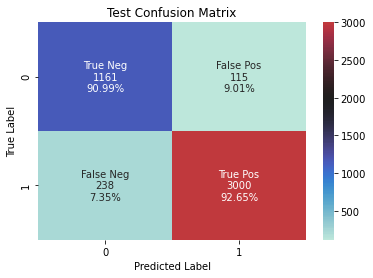

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD48_EPOCH49_balanced.pt
best epoch training accuracy:  0.5


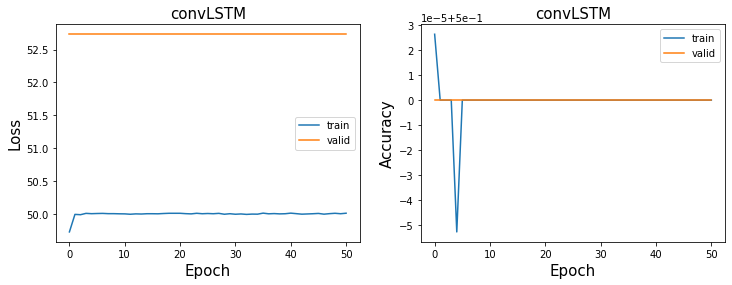

validation loss:52.734378814697266 accuracy:0.5
test loss:28.5909423828125 accuracy:0.7173238812583075
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD48_balanced_valcm.pt


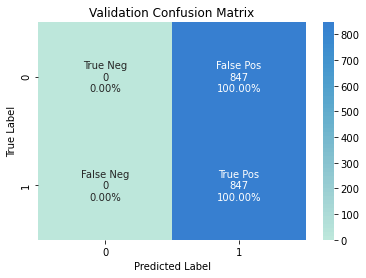

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD48_balanced_testcm.pt


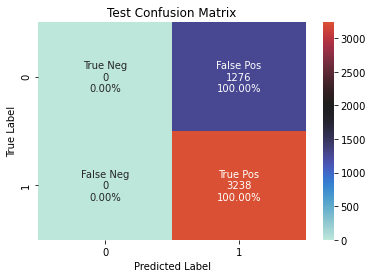

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD48_EPOCH5_balanced.pt
best epoch training accuracy:  0.9516512549537649


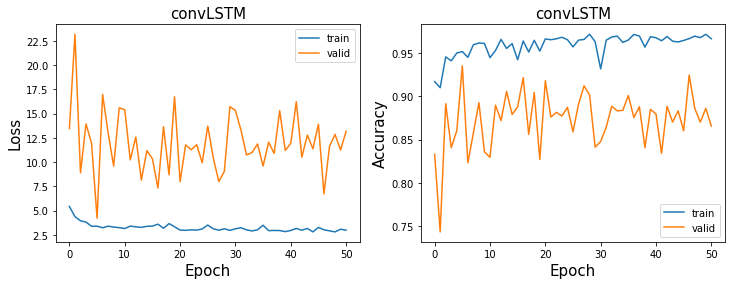

validation loss:4.394491195678711 accuracy:0.9321133412042503
test loss:3.4767067432403564 accuracy:0.9521488701816571
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD48_balanced_valcm.pt


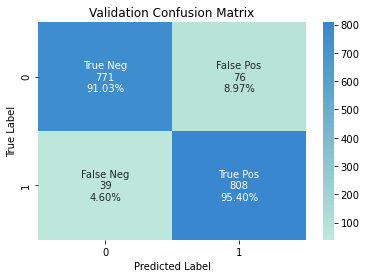

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD48_balanced_testcm.pt


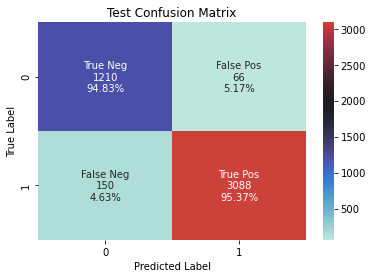

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD48_EPOCH0_balanced.pt
best epoch training accuracy:  0.9135006605019815


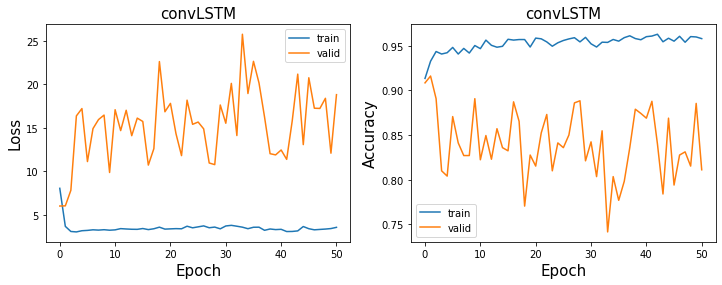

validation loss:6.335891246795654 accuracy:0.9073199527744983
test loss:4.2744460105896 accuracy:0.9308817013735047
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD48_balanced_valcm.pt


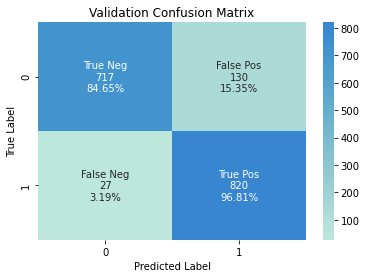

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD48_balanced_testcm.pt


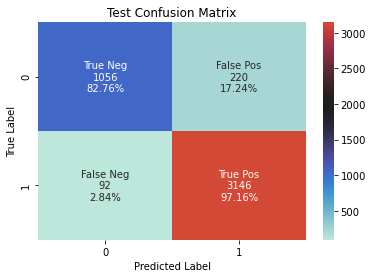

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD56_EPOCH4_balanced.pt
best epoch training accuracy:  0.9331043593130779


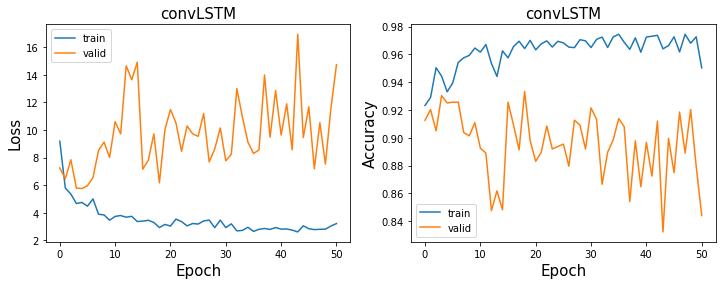

validation loss:6.098493576049805 accuracy:0.9203069657615112
test loss:5.276914596557617 accuracy:0.9370846256092158
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD56_balanced_valcm.pt


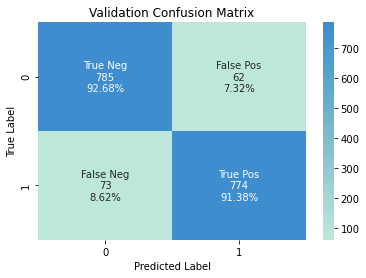

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.1_HD56_balanced_testcm.pt


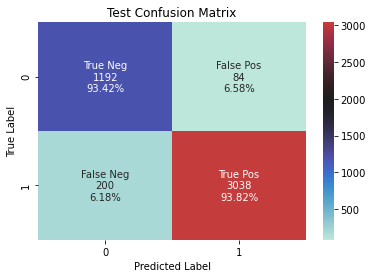

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD56_EPOCH25_balanced.pt
best epoch training accuracy:  0.9579920739762219


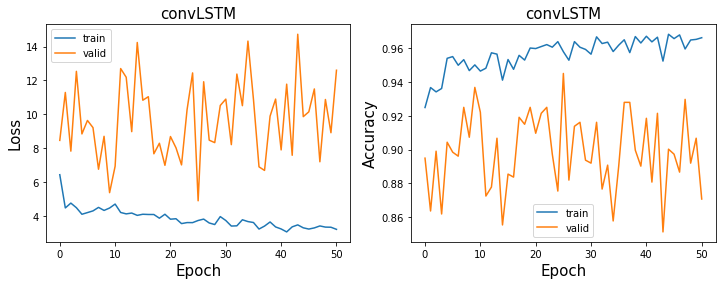

validation loss:5.088471412658691 accuracy:0.9445100354191264
test loss:3.472996473312378 accuracy:0.9612317235268055
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD56_balanced_valcm.pt


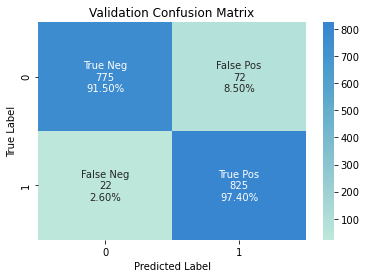

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.3_HD56_balanced_testcm.pt


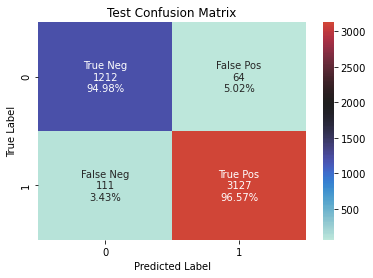

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD56_EPOCH7_balanced.pt
best epoch training accuracy:  0.9475033025099076


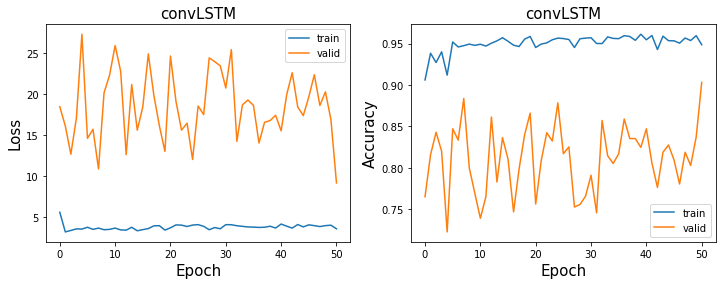

validation loss:10.35095500946045 accuracy:0.8831168831168831
test loss:4.49246883392334 accuracy:0.9474966770048737
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD56_balanced_valcm.pt


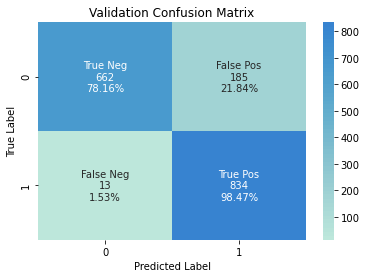

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLENGTH5_DO0.5_HD56_balanced_testcm.pt


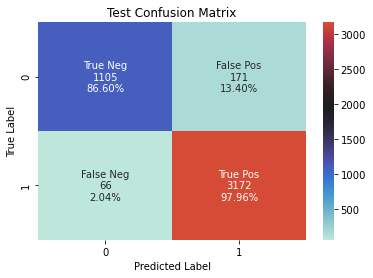

In [33]:
for i,(index,row) in enumerate(best_results.iterrows()):

    best_epoch = int(row)
    hidden = int(index[0])
    dropout = index[1]
    alpha = 0
    
    
    # load best model
    model = convLSTM(input_dim = 62, hidden_dim = hidden).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length,dropout, hidden,best_epoch)))
    
    print('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length,dropout, hidden,best_epoch))

    ## Print training result
    plot_train_result_file(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch)
    
    ## Calculate validation accuracy and validation loss
    val_loss, val_acc, val_preds, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
    print('validation loss:{} accuracy:{}'.format(val_loss, val_acc))
    
    ## Calculate test accuracy and test loss
    test_loss, test_acc, test_preds, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
    print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
    
    ## Confusion matrix-validation
    predictions_val = np.concatenate(val_preds)
    labels_val = np.concatenate(val_labels)
    
    val_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_balanced_valcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    print(val_cm_filename)
    val_cm_result = {'predictions_val': predictions_val, 'labels_val' : labels_val}

    pickle.dump( val_cm_result, open( val_cm_filename, "wb" ) )
    
    
    df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

    cm_val = confusion_matrix(labels_val, predictions_val)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_val.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_val, annot=labels, fmt='', center = 2000)
    ax.set_title('Validation Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    
    ## Confusion matrix-test
    predictions_test = np.concatenate(test_preds)
    labels_test = np.concatenate(test_labels)
    
    test_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLENGTH{}_DO{}_HD{}_balanced_testcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    print(test_cm_filename)
    test_cm_result = {'predictions_test': predictions_test, 'labels_test' : labels_test}

    pickle.dump( test_cm_result, open( test_cm_filename, "wb" ) )


    df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

    cm_test = confusion_matrix(labels_test, predictions_test)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_test.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
    ax.set_title('Test Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    


### Unbalanced Result

In [151]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]
# verbose = False

T_length = 5
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
criterion = nn.BCELoss() # BCE loss

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)


<ipython-input-66-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


0
Train loss for epoch 0: 0.8449340462684631
Val loss for epoch 0: 0.13456504046916962
Train loss for epoch 1: 0.09357845783233643
Val loss for epoch 1: 0.38636314868927
Train loss for epoch 2: 0.05407586321234703
Val loss for epoch 2: 0.23544743657112122
Train loss for epoch 3: 0.03373395651578903
Val loss for epoch 3: 0.3758200407028198
Train loss for epoch 4: 0.049502793699502945
Val loss for epoch 4: 0.5316338539123535
Train loss for epoch 5: 0.08965236693620682
Val loss for epoch 5: 1.0376789569854736
Train loss for epoch 6: 0.0493784099817276
Val loss for epoch 6: 0.6208425164222717
Train loss for epoch 7: 0.03142426908016205
Val loss for epoch 7: 1.439205527305603
Train loss for epoch 8: 0.07028214633464813
Val loss for epoch 8: 1.011743187904358
Train loss for epoch 9: 0.03198618441820145
Val loss for epoch 9: 1.2519806623458862
Train loss for epoch 10: 0.02714933454990387
Val loss for epoch 10: 0.8597263693809509
Train loss for epoch 11: 0.07284115999937057
Val loss for epoch 

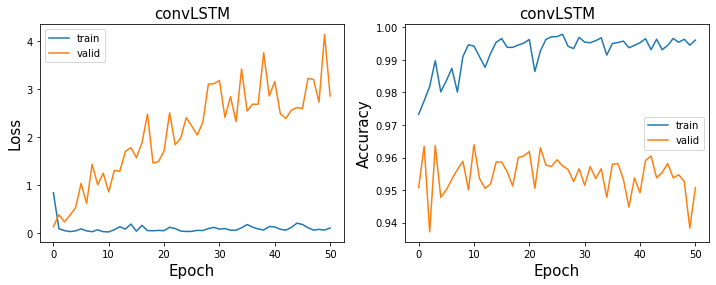

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.35889142751693726
Val loss for epoch 0: 0.13226434588432312
Train loss for epoch 1: 0.15526962280273438
Val loss for epoch 1: 0.25692474842071533
Train loss for epoch 2: 0.14129289984703064
Val loss for epoch 2: 0.2287033498287201
Train loss for epoch 3: 0.13480448722839355
Val loss for epoch 3: 0.3311977684497833
Train loss for epoch 4: 0.1358548402786255
Val loss for epoch 4: 0.4762668013572693
Train loss for epoch 5: 0.18318495154380798
Val loss for epoch 5: 1.7349464893341064
Train loss for epoch 6: 0.13332080841064453
Val loss for epoch 6: 1.276220679283142
Train loss for epoch 7: 0.10066534578800201
Val loss for epoch 7: 1.3758981227874756
Train loss for e

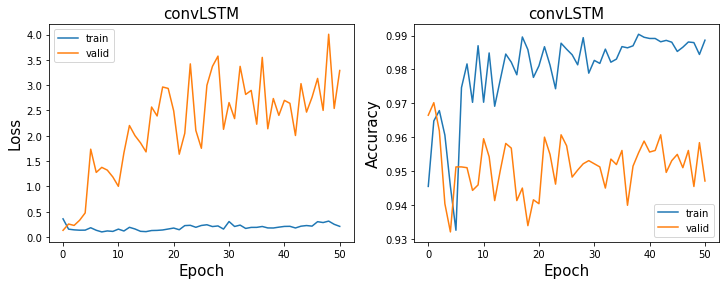

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.3841743469238281
Val loss for epoch 0: 0.2308325469493866
Train loss for epoch 1: 0.22388216853141785
Val loss for epoch 1: 0.3261164724826813
Train loss for epoch 2: 0.1872996985912323
Val loss for epoch 2: 0.27199938893318176
Train loss for epoch 3: 0.19525957107543945
Val loss for epoch 3: 0.435711145401001
Train loss for epoch 4: 0.17311479151248932
Val loss for epoch 4: 0.960680365562439
Train loss for epoch 5: 0.1852540522813797
Val loss for epoch 5: 0.40243321657180786
Train loss for epoch 6: 0.1857723593711853
Val loss for epoch 6: 0.6342393159866333
Train loss for epoch 7: 0.19017617404460907
Val loss for epoch 7: 0.5493934750556946
Train loss for epoch

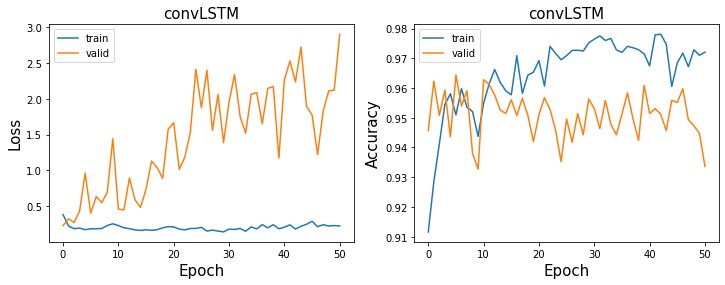

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.4697089195251465
Val loss for epoch 0: 0.24041832983493805
Train loss for epoch 1: 0.12677624821662903
Val loss for epoch 1: 0.4253404438495636
Train loss for epoch 2: 0.06410905718803406
Val loss for epoch 2: 0.7286115884780884
3
Train loss for epoch 3: 0.0916786715388298
Val loss for epoch 3: 0.22695805132389069
Train loss for epoch 4: 0.11338387429714203
Val loss for epoch 4: 0.6556479334831238
Train loss for epoch 5: 0.09490487724542618
Val loss for epoch 5: 0.6938334703445435
Train loss for epoch 6: 0.06869450956583023
Val loss for epoch 6: 1.0260764360427856
Train loss for epoch 7: 0.06516871601343155
Val loss for epoch 7: 1.047772765159607
Train loss for 

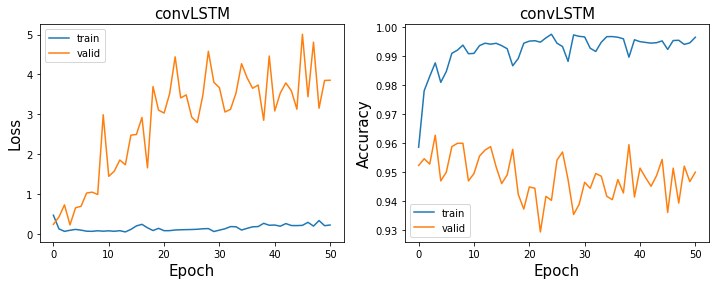

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.5960360169410706
Val loss for epoch 0: 0.3491096496582031
1
Train loss for epoch 1: 0.1740456521511078
Val loss for epoch 1: 0.29845649003982544
Train loss for epoch 2: 0.14549748599529266
Val loss for epoch 2: 0.6504817605018616
Train loss for epoch 3: 0.14440955221652985
Val loss for epoch 3: 0.89969402551651
Train loss for epoch 4: 0.1812734454870224
Val loss for epoch 4: 0.6296141147613525
Train loss for epoch 5: 0.18069927394390106
Val loss for epoch 5: 0.8858006000518799
Train loss for epoch 6: 0.16956280171871185
Val loss for epoch 6: 1.2771953344345093
Train loss for epoch 7: 0.2612363398075104
Val loss for epoch 7: 0.7677415609359741
Train loss for epoc

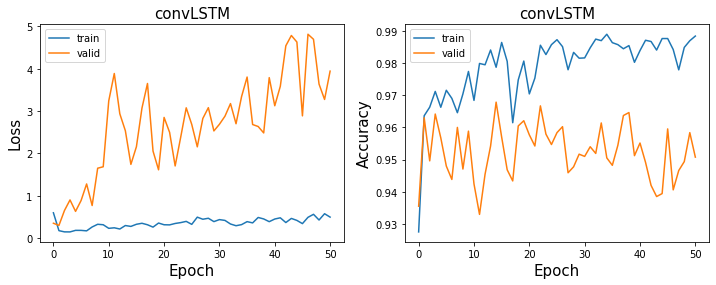

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.4221775233745575
Val loss for epoch 0: 0.40567055344581604
Train loss for epoch 1: 0.26811033487319946
Val loss for epoch 1: 0.8443800210952759
Train loss for epoch 2: 0.2448967844247818
Val loss for epoch 2: 0.41918835043907166
Train loss for epoch 3: 0.23563295602798462
Val loss for epoch 3: 0.5286895036697388
Train loss for epoch 4: 0.20651212334632874
Val loss for epoch 4: 1.014638066291809
Train loss for epoch 5: 0.21841682493686676
Val loss for epoch 5: 1.4037832021713257
Train loss for epoch 6: 0.2512092590332031
Val loss for epoch 6: 3.3608381748199463
Train loss for epoch 7: 0.24107414484024048
Val loss for epoch 7: 1.8649789094924927
Train loss for epo

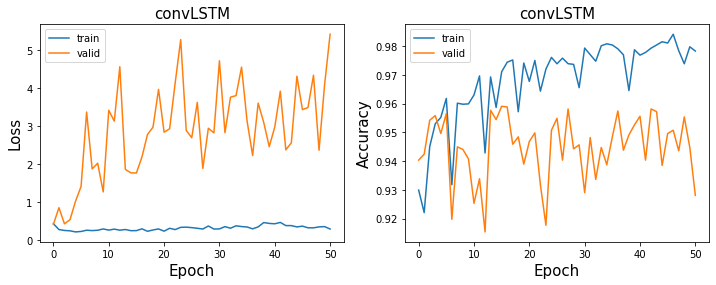

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.76763153076172
Val loss for epoch 0: 84.71784973144531
1
Train loss for epoch 1: 50.0
Val loss for epoch 1: 84.71784973144531
2
Train loss for epoch 2: 50.0
Val loss for epoch 2: 84.71784973144531
3
Train loss for epoch 3: 49.979286193847656
Val loss for epoch 3: 84.71784973144531
4
Train loss for epoch 4: 50.0
Val loss for epoch 4: 84.71784973144531
5
Train loss for epoch 5: 49.896427154541016
Val loss for epoch 5: 84.71784973144531
6
Train loss for epoch 6: 50.0
Val loss for epoch 6: 84.71784973144531
7
Train loss for epoch 7: 50.02071762084961
Val loss for epoch 7: 84.71784973144531
8
Train loss for epoch 8: 50.02071762084961
Val loss for epoch 8: 84.71784

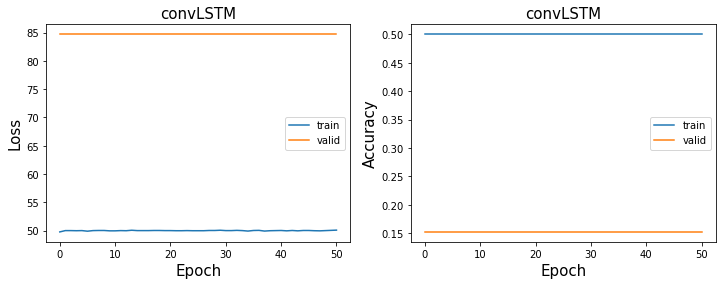

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 5.450507164001465
Val loss for epoch 0: 2.411480188369751
Train loss for epoch 1: 3.6199827194213867
Val loss for epoch 1: 2.8097825050354004
2
Train loss for epoch 2: 3.367382049560547
Val loss for epoch 2: 1.8743425607681274
Train loss for epoch 3: 3.5114898681640625
Val loss for epoch 3: 1.942308783531189
Train loss for epoch 4: 3.1356489658355713
Val loss for epoch 4: 2.260133981704712
5
Train loss for epoch 5: 3.017279624938965
Val loss for epoch 5: 1.6606765985488892
Train loss for epoch 6: 3.6357197761535645
Val loss for epoch 6: 4.222799777984619
Train loss for epoch 7: 3.1011111736297607
Val loss for epoch 7: 4.880792617797852
Train loss for epoch 8: 3.

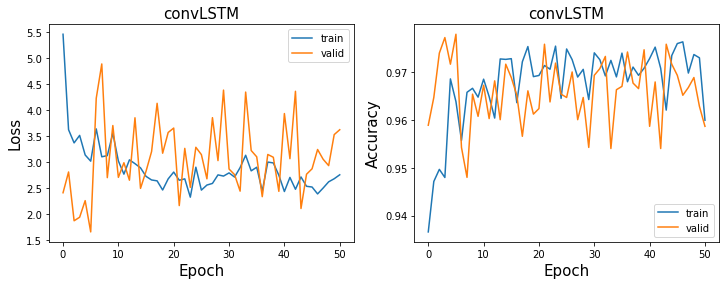

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 4.465260982513428
Val loss for epoch 0: 3.818296194076538
1
Train loss for epoch 1: 2.7401115894317627
Val loss for epoch 1: 3.2211062908172607
Train loss for epoch 2: 2.286299705505371
Val loss for epoch 2: 5.301553249359131
Train loss for epoch 3: 2.5124576091766357
Val loss for epoch 3: 4.46866512298584
Train loss for epoch 4: 2.227461099624634
Val loss for epoch 4: 6.931123733520508
Train loss for epoch 5: 2.296825408935547
Val loss for epoch 5: 6.610561847686768
6
Train loss for epoch 6: 2.1528069972991943
Val loss for epoch 6: 3.079111337661743
7
Train loss for epoch 7: 2.4700822830200195
Val loss for epoch 7: 2.5979714393615723
Train loss for epoch 8: 2.4

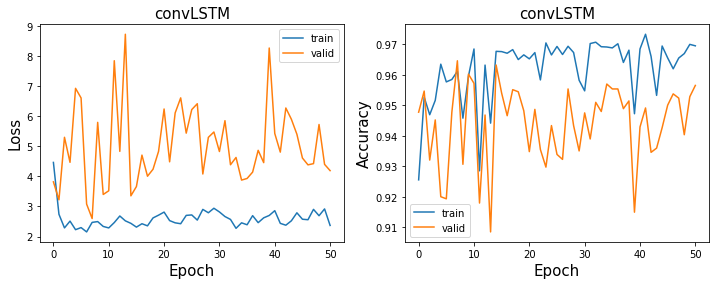

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.77604293823242
Val loss for epoch 0: 15.282151222229004
1
Train loss for epoch 1: 50.0
Val loss for epoch 1: 15.282151222229004
2
Train loss for epoch 2: 49.979286193847656
Val loss for epoch 2: 15.282151222229004
3
Train loss for epoch 3: 49.979286193847656
Val loss for epoch 3: 15.282151222229004
4
Train loss for epoch 4: 49.896427154541016
Val loss for epoch 4: 15.282151222229004
5
Train loss for epoch 5: 49.91714096069336
Val loss for epoch 5: 15.282151222229004
6
Train loss for epoch 6: 50.0
Val loss for epoch 6: 15.282151222229004
7
Train loss for epoch 7: 50.082862854003906
Val loss for epoch 7: 15.282151222229004
8
Train loss for epoch 8: 50.020717620

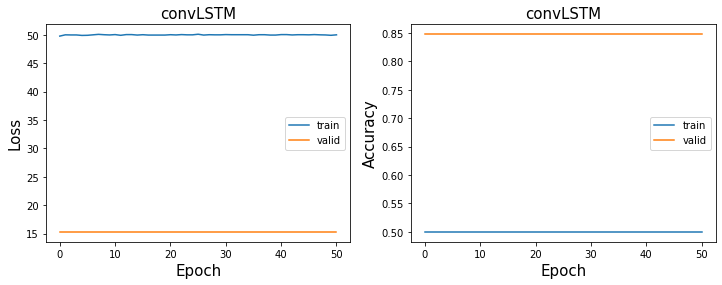

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 6.485975742340088
Val loss for epoch 0: 2.8456010818481445
Train loss for epoch 1: 4.169723987579346
Val loss for epoch 1: 3.845613479614258
2
Train loss for epoch 2: 3.9709787368774414
Val loss for epoch 2: 1.8486173152923584
Train loss for epoch 3: 4.2096991539001465
Val loss for epoch 3: 4.032639026641846
Train loss for epoch 4: 4.47953987121582
Val loss for epoch 4: 4.682586193084717
Train loss for epoch 5: 3.7507519721984863
Val loss for epoch 5: 2.922736883163452
Train loss for epoch 6: 3.724170207977295
Val loss for epoch 6: 2.8632302284240723
Train loss for epoch 7: 4.044810771942139
Val loss for epoch 7: 2.8418641090393066
Train loss for epoch 8: 3.7024

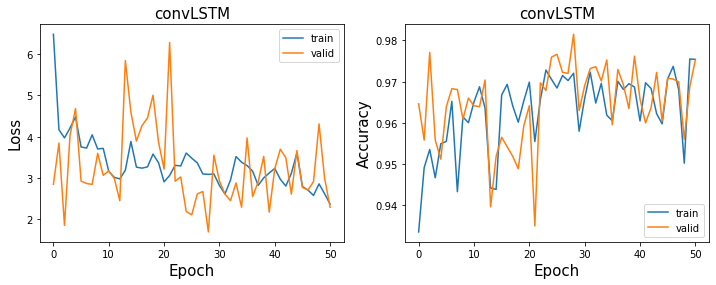

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 6.61280632019043
Val loss for epoch 0: 1.9369087219238281
Train loss for epoch 1: 4.404489517211914
Val loss for epoch 1: 4.643723964691162
Train loss for epoch 2: 3.811544418334961
Val loss for epoch 2: 2.6212778091430664
Train loss for epoch 3: 3.721318244934082
Val loss for epoch 3: 5.1412177085876465
Train loss for epoch 4: 3.3238182067871094
Val loss for epoch 4: 4.914698123931885
Train loss for epoch 5: 3.253685474395752
Val loss for epoch 5: 5.91303825378418
Train loss for epoch 6: 3.204587936401367
Val loss for epoch 6: 3.4972329139709473
Train loss for epoch 7: 3.3424532413482666
Val loss for epoch 7: 3.1326656341552734
Train loss for epoch 8: 3.5720448

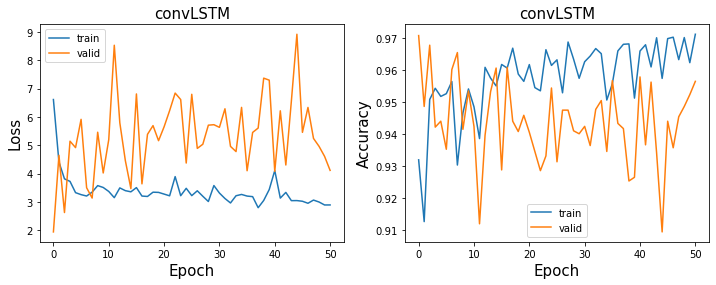

In [117]:
for i in hidden_dim:
    for d in dropout:
        model = convLSTM(input_dim = 62, hidden_dim = i, dropout = d).to(device)
        print(model)
        optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
        criterion = nn.BCELoss() # BCE loss
        train_losses, train_accs, val_losses, val_accs, parameter_history = [], [], [], [],[]

        for epoch in range(num_epochs):
            train_loss, train_acc, parameter_history = train(model, optimizer, criterion, train_loader,  device='cuda')
            val_loss, val_acc = evaluate(model, optimizer, criterion, val_loader, device='cuda')
            train_losses.append(train_loss)
            train_accs.append(train_acc)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
            if epoch == 0:
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))

            if val_loss <= min(val_losses):
                best_epoch = epoch
                print(epoch)
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))
            else:
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))

        #     if epoch == num_epochs-1:
        #         torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_EPOCH{}.pt'.format(model_saving_path, model_type, CH, loss_type, reg_type, alpha, timewindow, epoch))

        train_result_filename =  '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_trainresult.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch)
        train_result = {'model_type': model_type, 'train_losses' : train_losses, 'val_losses' : val_losses, 'train_accs': train_accs, 'val_accs': val_accs}
        pickle.dump( train_result, open( train_result_filename, "wb" ) )
        plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)

In [152]:
results = []
for h in hidden_dim:
    for d in dropout:
        model_convLSTM = os.listdir(model_saving_path)

        best_result = 0
        reg_alpha = 'REG'+reg_type+str(alpha)+'_'
        dropout_type = 'DO'+str(d)
        hidden_type = 'HD'+str(h)
        t_len = 'TLEN'+str(T_length)
        for i, s in enumerate(model_convLSTM):
            if 'convLSTM_CHall_' in s and reg_alpha in s and dropout_type in s and hidden_type in s and t_len in s and '_balanced' not in s and 'trainresult' not in s and 'valcm' not in s and 'testcm' not in s:
                model_name = model_convLSTM[i].split('_')
                epoch_name = [ind for ind,item in enumerate(np.array(model_name)) if "EPOCH" in item]
                res = [int(i) for i in model_name[epoch_name[0]] if i.isdigit()]
                if len(res) > 1:
                    epoch_result = res[0]*10+res[1]
                else:
                    epoch_result = res[0]
                if epoch_result>best_result and epoch_result != 50:
                    best_result = epoch_result

        results.append([h,d,best_result])

results = pd.DataFrame(np.array(results), columns=['hidden','dropout', 'epoch'])
best_results = results.groupby(['hidden','dropout']).max('epoch')
print(best_results)


                epoch
hidden dropout       
10.0   0.1        0.0
       0.3        0.0
       0.5        0.0
15.0   0.1        3.0
       0.3        1.0
       0.5        0.0
48.0   0.1       49.0
       0.3        5.0
       0.5        7.0
56.0   0.1       49.0
       0.3       28.0
       0.5        0.0


/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD10_EPOCH0.pt
best epoch training accuracy:  0.9732779097387173


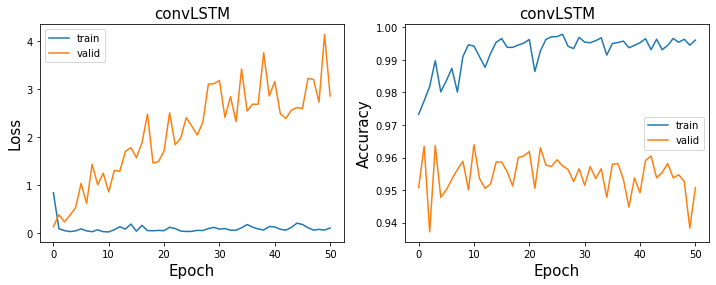

<ipython-input-66-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


validation loss:0.13491930067539215 accuracy:0.9507514450867052
test loss:0.2534252405166626 accuracy:0.937553221686063
0.706784
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD10_valcm.pt


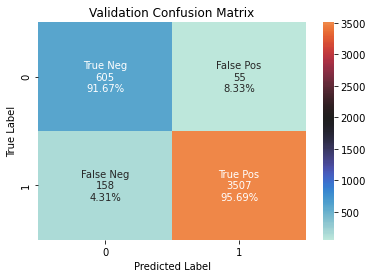

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD10_testcm.pt


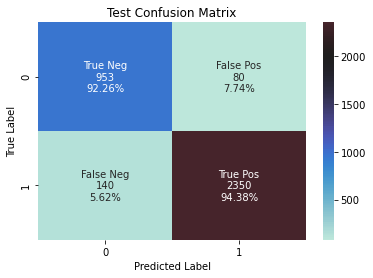

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD10_EPOCH0.pt
best epoch training accuracy:  0.9454572446555819


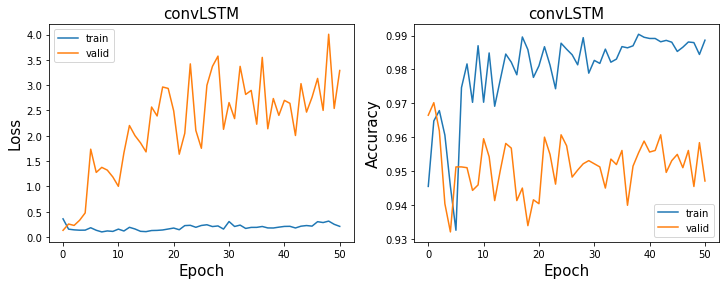

validation loss:0.13229812681674957 accuracy:0.9664739884393063
test loss:0.3023141622543335 accuracy:0.9403917116094238
0.706784
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD10_valcm.pt


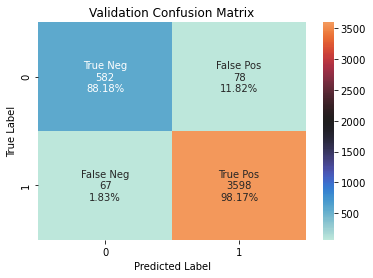

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD10_testcm.pt


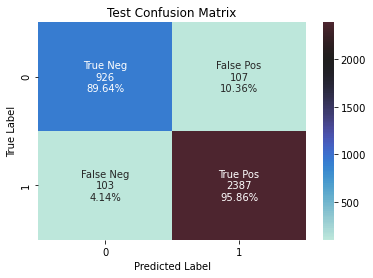

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD10_EPOCH0.pt
best epoch training accuracy:  0.9116092636579572


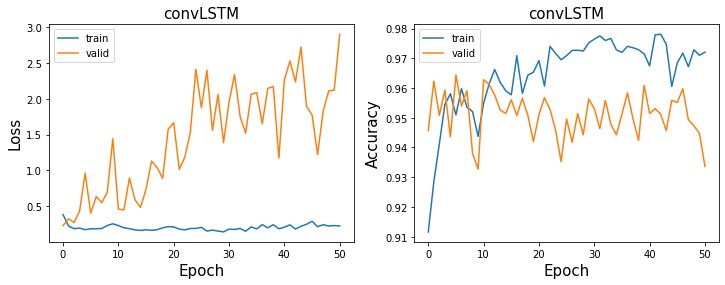

validation loss:0.23065386712551117 accuracy:0.945664739884393
test loss:0.42254841327667236 accuracy:0.9114391143911439
0.706784
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD10_valcm.pt


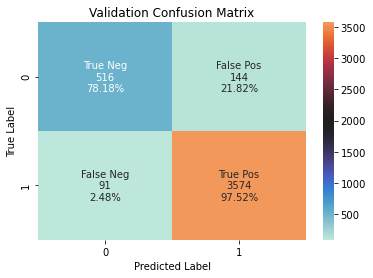

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD10_testcm.pt


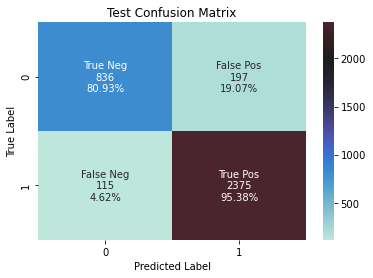

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD15_EPOCH3.pt
best epoch training accuracy:  0.98770783847981


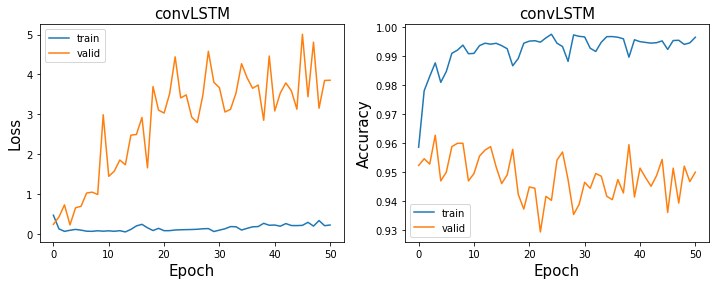

validation loss:0.22644147276878357 accuracy:0.9627745664739884
test loss:0.7909690737724304 accuracy:0.9463525404484814
0.706784
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD15_valcm.pt


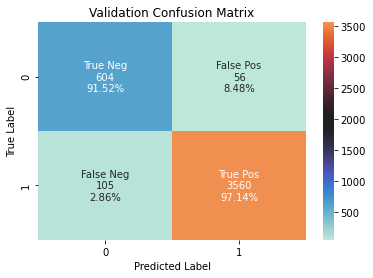

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD15_testcm.pt


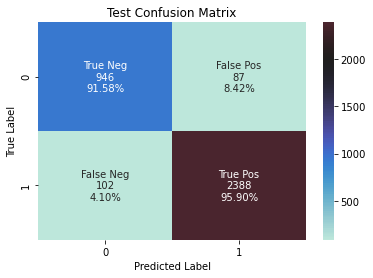

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD15_EPOCH1.pt
best epoch training accuracy:  0.9636282660332541


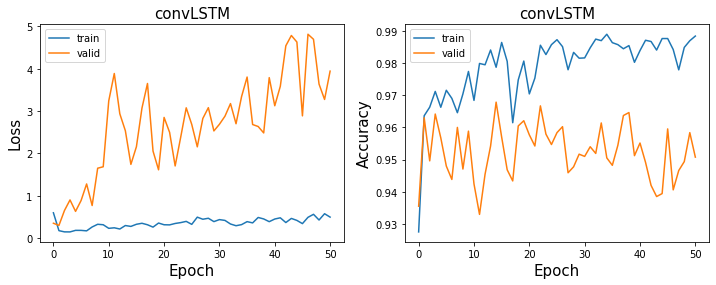

validation loss:0.29902318120002747 accuracy:0.9630057803468208
test loss:0.7862255573272705 accuracy:0.9256315640079478
0.706784
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD15_valcm.pt


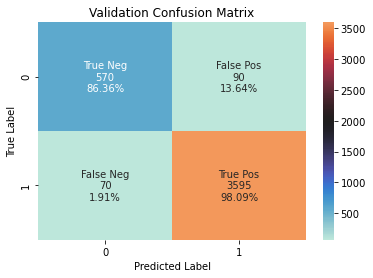

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD15_testcm.pt


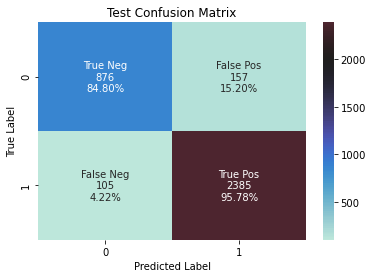

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD15_EPOCH0.pt
best epoch training accuracy:  0.9299287410926366


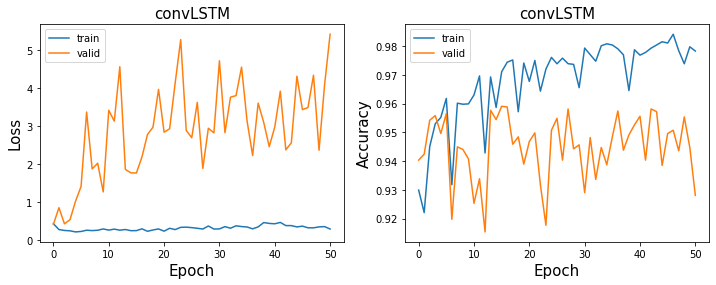

validation loss:0.4063760042190552 accuracy:0.9403468208092486
test loss:0.9192997813224792 accuracy:0.8924212319046267
0.706784
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD15_valcm.pt


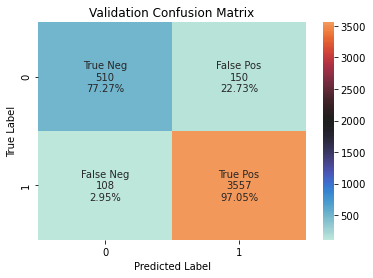

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD15_testcm.pt


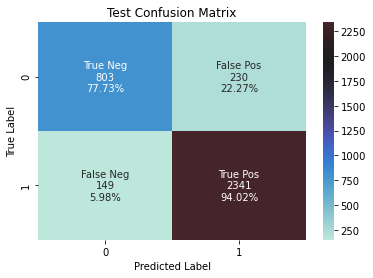

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD48_EPOCH49.pt
best epoch training accuracy:  0.5


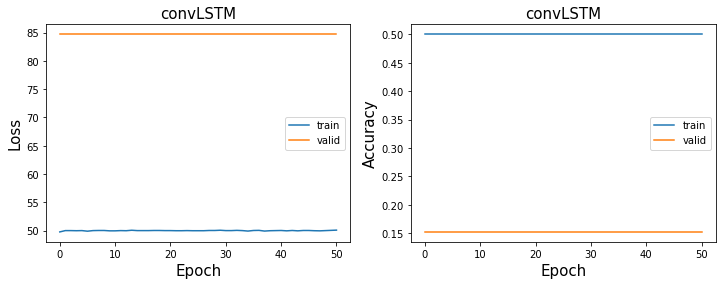

validation loss:84.73013305664062 accuracy:0.15260115606936417
test loss:70.61859130859375 accuracy:0.29321600908316775
0.706784
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD48_valcm.pt


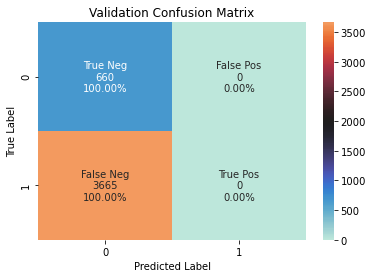

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD48_testcm.pt


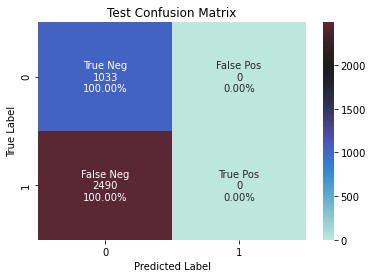

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD48_EPOCH5.pt
best epoch training accuracy:  0.9637767220902613


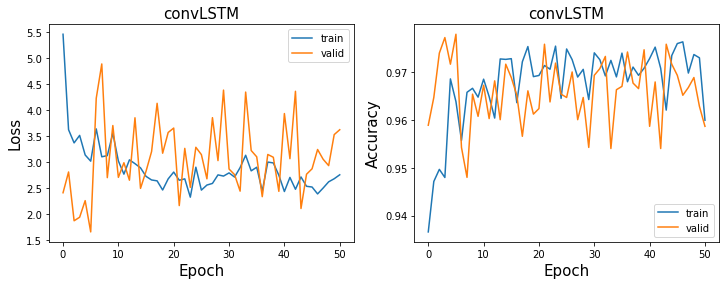

validation loss:1.6545332670211792 accuracy:0.9778034682080925
test loss:4.412091255187988 accuracy:0.9494748793641783
0.706784
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD48_valcm.pt


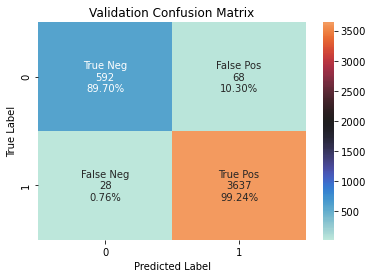

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD48_testcm.pt


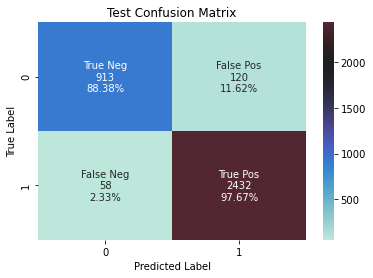

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD48_EPOCH7.pt
best epoch training accuracy:  0.9611638954869358


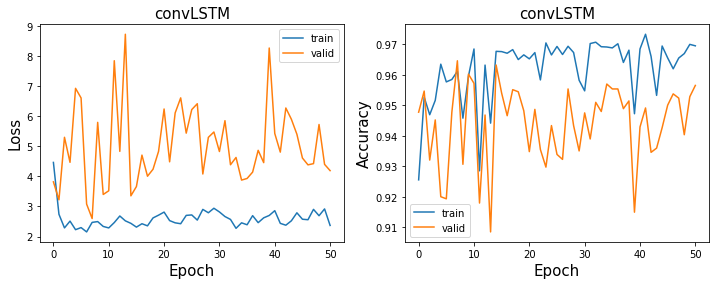

validation loss:2.6094822883605957 accuracy:0.9646242774566474
test loss:6.763225078582764 accuracy:0.9139937553221686
0.706784
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD48_valcm.pt


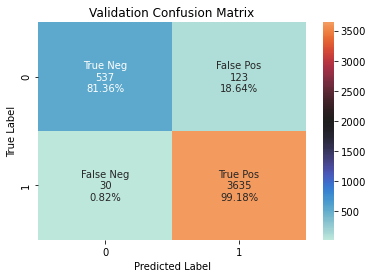

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD48_testcm.pt


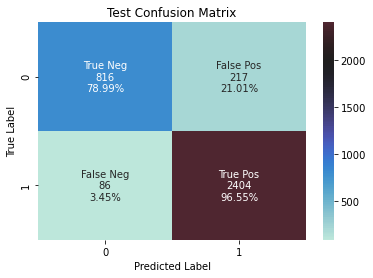

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD56_EPOCH49.pt
best epoch training accuracy:  0.5


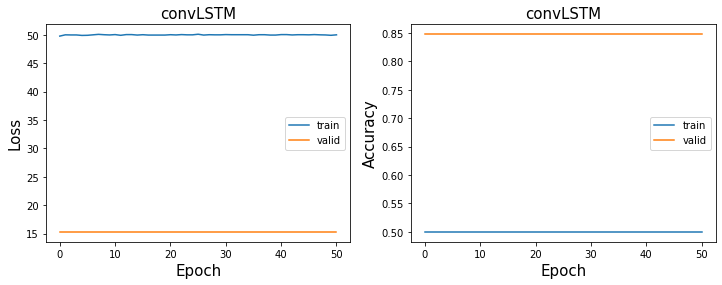

validation loss:15.269865036010742 accuracy:0.8473988439306358
test loss:29.38141441345215 accuracy:0.7067839909168322
0.706784
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD56_valcm.pt


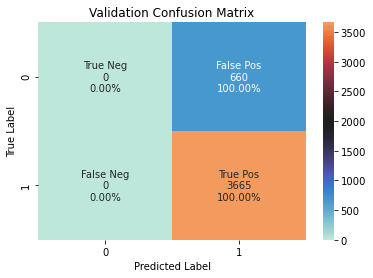

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.1_HD56_testcm.pt


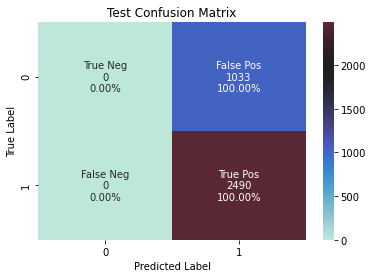

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD56_EPOCH28.pt
best epoch training accuracy:  0.9720605700712589


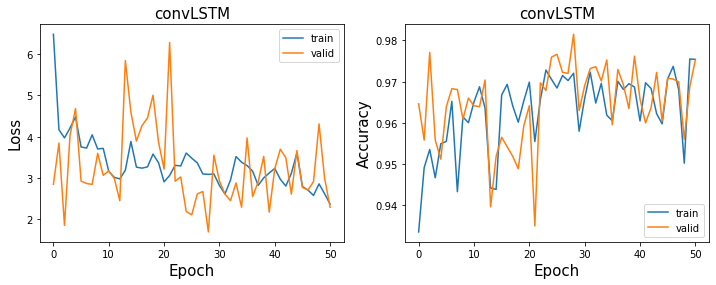

validation loss:1.706733226776123 accuracy:0.9815028901734104
test loss:4.732577323913574 accuracy:0.9511779733181948
0.706784
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD56_valcm.pt


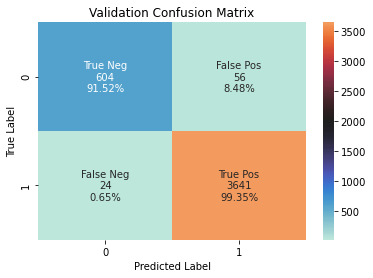

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.3_HD56_testcm.pt


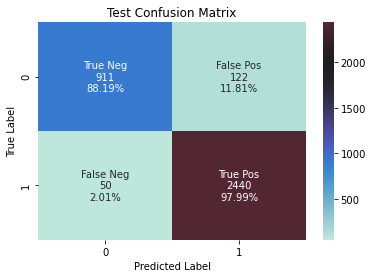

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD56_EPOCH0.pt
best epoch training accuracy:  0.9319477434679335


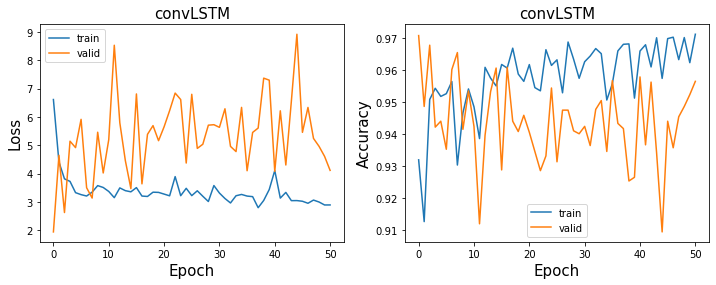

validation loss:1.9510337114334106 accuracy:0.9708670520231214
test loss:3.9411563873291016 accuracy:0.9384047686630712
0.706784
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD56_valcm.pt


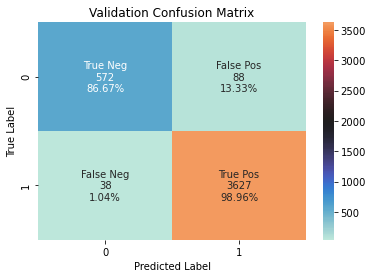

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN5_DO0.5_HD56_testcm.pt


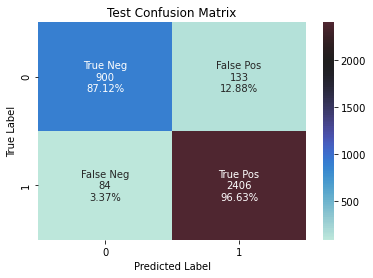

In [153]:
for i,(index,row) in enumerate(best_results.iterrows()):

    best_epoch = int(row)
    hidden = int(index[0])
    dropout = index[1]
    alpha = 0
    
    
    # load best model
    model = convLSTM(input_dim = 62, hidden_dim = hidden).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length,  dropout, hidden,best_epoch)))
    
    print('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, dropout, hidden,best_epoch))

    ## Print Training Result
    plot_train_result_file(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch)
    
    
    ## Calculate validation accuracy and validation loss
    val_loss, val_acc, val_preds, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
    print('validation loss:{} accuracy:{}'.format(val_loss, val_acc))
    
    ## Calculate test accuracy and test loss
    test_loss, test_acc, test_preds, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
    print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
    print(np.mean(np.concatenate(test_labels)))
    
    ## Confusion matrix-validation
    predictions_val = np.concatenate(val_preds)
    labels_val = np.concatenate(val_labels)
    
    val_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_valcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
    print(val_cm_filename)
    val_cm_result = {'predictions_val': predictions_val, 'labels_val' : labels_val}

    pickle.dump( val_cm_result, open( val_cm_filename, "wb" ) )
    
    
    df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

    cm_val = confusion_matrix(labels_val, predictions_val)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_val.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_val, annot=labels, fmt='', center = 2000)
    ax.set_title('Validation Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    
    ## Confusion matrix-test
    predictions_test = np.concatenate(test_preds)
    labels_test = np.concatenate(test_labels)

    test_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_testcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
    print(test_cm_filename)
    test_cm_result = {'predictions_test': predictions_test, 'labels_val' : labels_test}

    pickle.dump( test_cm_result, open( test_cm_filename, "wb" ) )

    df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

    cm_test = confusion_matrix(labels_test, predictions_test)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_test.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
    ax.set_title('Test Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    


## T-length = 10

In [120]:
time_window = 10
## Load files
move_files, sleep_files = create_files_new(load_path, bad_dates, T_length=3, proceed=1)
train_files, val_files, test_files = [], [], []

## Put files in val, test, and train
for f in move_files+sleep_files:
    if f:
        if f[0][1][3] in val_dates:
            val_files.extend(f)
        elif f[0][1][3] in test_dates:
            test_files.extend(f)
        else:
            train_files.extend(f)           

In [121]:
## Randomly shuffle inside train, val, and test
random.shuffle(train_files)
random.shuffle(val_files)
random.shuffle(test_files)

In [122]:
## Upsample train
train_files = upsample(train_files)

In [123]:
## Balance val 
sleep_files = []
move_files = []
for t in range(len(val_files)):
    if 'sleep' in val_files[t][0]:
        sleep_files.append(val_files[t])
    if 'move' in val_files[t][0]:
        move_files.append(val_files[t])

sleep_sample = sample(sleep_files, len(move_files))
val_2_files = sleep_sample+move_files

In [124]:
len(train_files), len(val_files), len(test_files)

(37850, 5197, 4514)

In [125]:
## Load files to dataloader
T_length = 10

# train_dataset = SpectrogramDatasetAtt(files=train_files, load_path=load_path, T_length=T_length, all_label=True)
# valid_dataset = SpectrogramDatasetAtt(files=val_2_files, load_path=load_path, T_length=T_length, all_label=True)
# test_dataset = SpectrogramDatasetAtt(files=test_files, load_path=load_path, T_length=T_length, all_label=True)

train_dataset = SpectrogramDatasetAtt(files=train_files, load_path=load_path, T_length=T_length, all_label=True)
valid_dataset = SpectrogramDatasetAtt(files=val_files, load_path=load_path, T_length=T_length, all_label=True)
test_dataset = SpectrogramDatasetAtt(files=test_files, load_path=load_path, T_length=T_length, all_label=True)

train_loader = DataLoader(dataset=train_dataset, batch_size=128, shuffle = True)
val_loader = DataLoader(dataset=valid_dataset, batch_size=128, shuffle = False)
test_loader = DataLoader(dataset=test_dataset, batch_size=128, shuffle = False)

### Training

In [126]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]
T_length = 10



convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)


<ipython-input-14-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


0
Train loss for epoch 0: 0.3486195504665375
Val loss for epoch 0: 0.44507521390914917
Train loss for epoch 1: 0.13690611720085144
Val loss for epoch 1: 1.0717947483062744
Train loss for epoch 2: 0.10935357213020325
Val loss for epoch 2: 1.1332247257232666
Train loss for epoch 3: 0.11611823737621307
Val loss for epoch 3: 1.2344939708709717
Train loss for epoch 4: 0.09930627048015594
Val loss for epoch 4: 1.7264869213104248
Train loss for epoch 5: 0.09061408042907715
Val loss for epoch 5: 3.9949724674224854
Train loss for epoch 6: 0.091551274061203
Val loss for epoch 6: 2.393179416656494
Train loss for epoch 7: 0.13386209309101105
Val loss for epoch 7: 5.140054702758789
Train loss for epoch 8: 0.0990203469991684
Val loss for epoch 8: 4.048463344573975
Train loss for epoch 9: 0.1026335209608078
Val loss for epoch 9: 7.694233417510986
Train loss for epoch 10: 0.07502073049545288
Val loss for epoch 10: 5.999204635620117
Train loss for epoch 11: 0.09747671335935593
Val loss for epoch 11: 7.

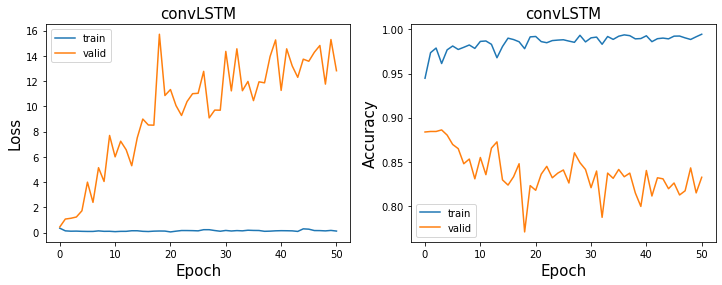

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.5256606340408325
Val loss for epoch 0: 0.255037397146225
Train loss for epoch 1: 0.19687551259994507
Val loss for epoch 1: 0.43936362862586975
Train loss for epoch 2: 0.17140920460224152
Val loss for epoch 2: 0.9184207916259766
Train loss for epoch 3: 0.14569008350372314
Val loss for epoch 3: 0.5214811563491821
Train loss for epoch 4: 0.1515137106180191
Val loss for epoch 4: 1.7943189144134521
Train loss for epoch 5: 0.16610629856586456
Val loss for epoch 5: 1.4536703824996948
Train loss for epoch 6: 0.16261117160320282
Val loss for epoch 6: 2.5365633964538574
Train loss for epoch 7: 0.1659209132194519
Val loss for epoch 7: 1.9094181060791016
Train loss for epoc

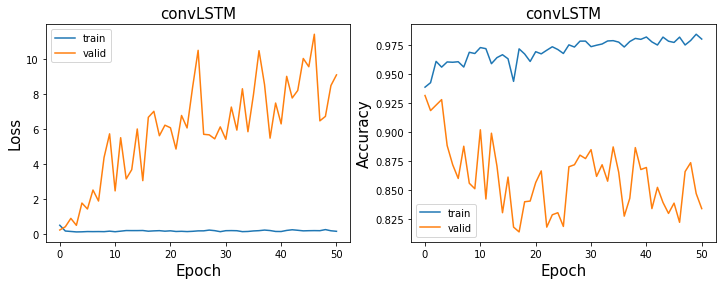

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.3611472249031067
Val loss for epoch 0: 0.8887577056884766
1
Train loss for epoch 1: 0.2539314031600952
Val loss for epoch 1: 0.45679086446762085
Train loss for epoch 2: 0.2665080726146698
Val loss for epoch 2: 2.3554913997650146
Train loss for epoch 3: 0.23574061691761017
Val loss for epoch 3: 1.650234341621399
Train loss for epoch 4: 0.24177448451519012
Val loss for epoch 4: 2.2376394271850586
Train loss for epoch 5: 0.2417287826538086
Val loss for epoch 5: 2.487529754638672
Train loss for epoch 6: 0.23035292327404022
Val loss for epoch 6: 4.10947847366333
Train loss for epoch 7: 0.22350727021694183
Val loss for epoch 7: 7.9345879554748535
Train loss for epoch 

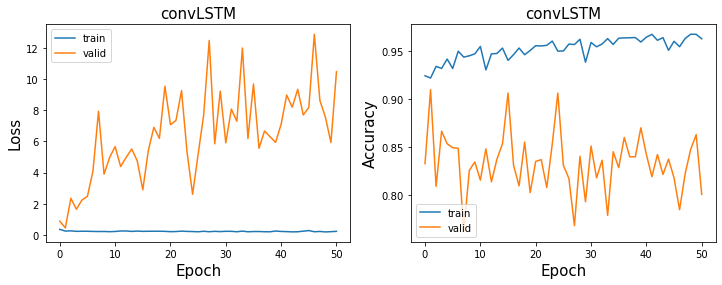

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.5584505200386047
Val loss for epoch 0: 0.5633686780929565
Train loss for epoch 1: 0.14725011587142944
Val loss for epoch 1: 1.013952374458313
Train loss for epoch 2: 0.10587115585803986
Val loss for epoch 2: 1.7089906930923462
Train loss for epoch 3: 0.10924964398145676
Val loss for epoch 3: 3.693802833557129
Train loss for epoch 4: 0.112602598965168
Val loss for epoch 4: 2.8584535121917725
Train loss for epoch 5: 0.1483967900276184
Val loss for epoch 5: 5.6958746910095215
Train loss for epoch 6: 0.13932369649410248
Val loss for epoch 6: 6.24574089050293
Train loss for epoch 7: 0.17279766499996185
Val loss for epoch 7: 6.656551837921143
Train loss for epoch 8: 0

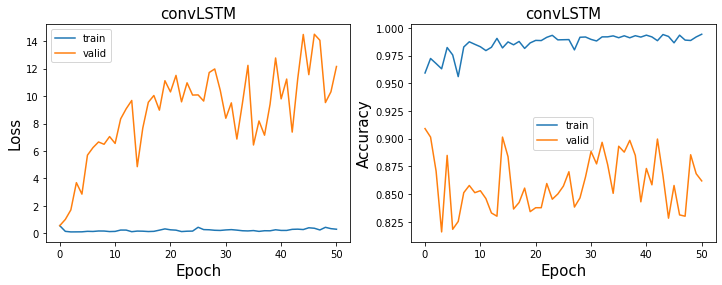

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.5609774589538574
Val loss for epoch 0: 0.7553083896636963
Train loss for epoch 1: 0.24867741763591766
Val loss for epoch 1: 1.0184109210968018
Train loss for epoch 2: 0.24811945855617523
Val loss for epoch 2: 2.1597745418548584
Train loss for epoch 3: 0.2996942102909088
Val loss for epoch 3: 6.672918319702148
Train loss for epoch 4: 0.2796858251094818
Val loss for epoch 4: 5.196272850036621
Train loss for epoch 5: 0.24140088260173798
Val loss for epoch 5: 6.368296146392822
Train loss for epoch 6: 0.2475673109292984
Val loss for epoch 6: 4.260442733764648
Train loss for epoch 7: 0.26826611161231995
Val loss for epoch 7: 2.1876533031463623
Train loss for epoch 8: 

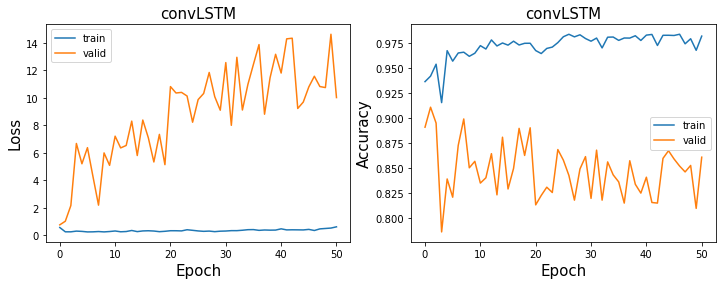

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.5473343133926392
Val loss for epoch 0: 1.2800226211547852
Train loss for epoch 1: 0.285634845495224
Val loss for epoch 1: 4.03472375869751
Train loss for epoch 2: 0.3408067226409912
Val loss for epoch 2: 4.285434246063232
3
Train loss for epoch 3: 0.3200448751449585
Val loss for epoch 3: 1.027331829071045
Train loss for epoch 4: 0.30247750878334045
Val loss for epoch 4: 3.5510125160217285
Train loss for epoch 5: 0.29315122961997986
Val loss for epoch 5: 4.750209331512451
Train loss for epoch 6: 0.29885363578796387
Val loss for epoch 6: 3.5980637073516846
Train loss for epoch 7: 0.33008813858032227
Val loss for epoch 7: 7.572883605957031
Train loss for epoch 8: 0

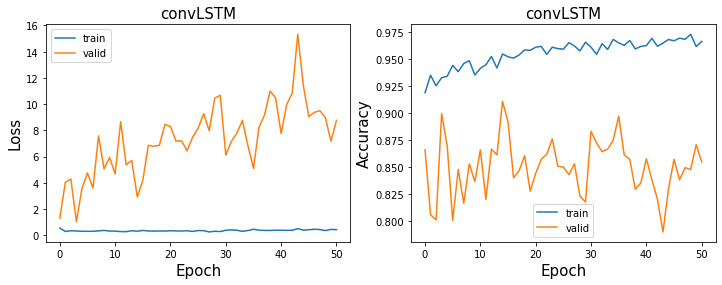

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 11.851161003112793
Val loss for epoch 0: 7.288140773773193
Train loss for epoch 1: 7.1032938957214355
Val loss for epoch 1: 13.489579200744629
Train loss for epoch 2: 5.253323554992676
Val loss for epoch 2: 11.672213554382324
Train loss for epoch 3: 4.791461944580078
Val loss for epoch 3: 11.622454643249512
4
Train loss for epoch 4: 4.4615159034729
Val loss for epoch 4: 5.363852024078369
Train loss for epoch 5: 3.833343505859375
Val loss for epoch 5: 11.998991012573242
Train loss for epoch 6: 4.27232027053833
Val loss for epoch 6: 13.343188285827637
Train loss for epoch 7: 4.3970818519592285
Val loss for epoch 7: 14.07644271850586
Train loss for epoch 8: 4.53303

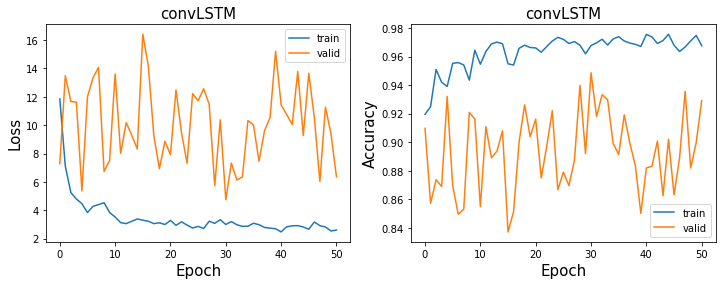

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.6527099609375
Val loss for epoch 0: 52.734378814697266
1
Train loss for epoch 1: 49.99888610839844
Val loss for epoch 1: 52.734378814697266
2
Train loss for epoch 2: 50.00334167480469
Val loss for epoch 2: 52.734378814697266
3
Train loss for epoch 3: 50.0078010559082
Val loss for epoch 3: 52.734378814697266
4
Train loss for epoch 4: 49.99665832519531
Val loss for epoch 4: 52.734378814697266
5
Train loss for epoch 5: 50.00334167480469
Val loss for epoch 5: 52.734378814697266
6
Train loss for epoch 6: 50.00557327270508
Val loss for epoch 6: 52.734378814697266
7
Train loss for epoch 7: 50.00111770629883
Val loss for epoch 7: 52.734378814697266
8
Train loss for e

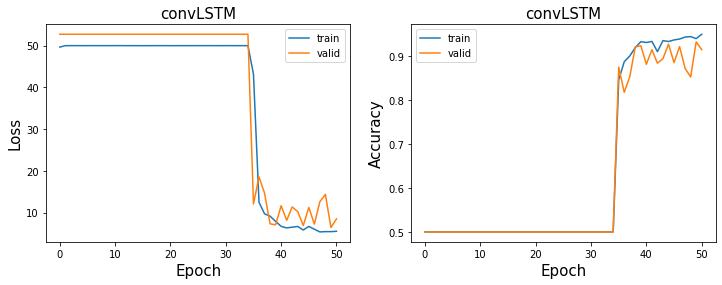

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 4.707102298736572
Val loss for epoch 0: 6.0482611656188965
Train loss for epoch 1: 2.6074612140655518
Val loss for epoch 1: 9.758625984191895
2
Train loss for epoch 2: 2.628171920776367
Val loss for epoch 2: 5.838840007781982
Train loss for epoch 3: 2.6499691009521484
Val loss for epoch 3: 14.50287914276123
Train loss for epoch 4: 2.718775749206543
Val loss for epoch 4: 10.168106079101562
Train loss for epoch 5: 2.7439424991607666
Val loss for epoch 5: 10.892325401306152
Train loss for epoch 6: 3.1188225746154785
Val loss for epoch 6: 13.273897171020508
Train loss for epoch 7: 2.7505548000335693
Val loss for epoch 7: 10.51547908782959
Train loss for epoch 8: 3.0

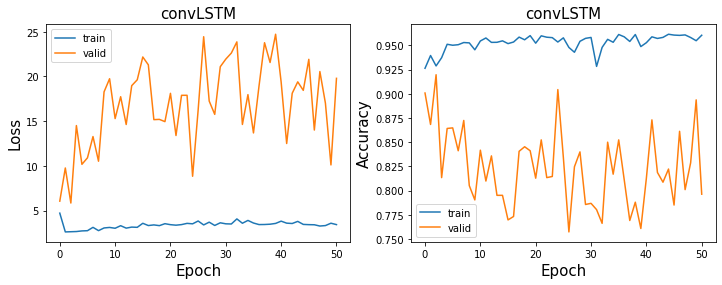

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 10.780974388122559
Val loss for epoch 0: 6.4830193519592285
1
Train loss for epoch 1: 6.38419771194458
Val loss for epoch 1: 5.3459062576293945
Train loss for epoch 2: 5.4198760986328125
Val loss for epoch 2: 8.749873161315918
Train loss for epoch 3: 4.275839805603027
Val loss for epoch 3: 6.3159613609313965
Train loss for epoch 4: 3.931530714035034
Val loss for epoch 4: 18.06806755065918
Train loss for epoch 5: 3.7794342041015625
Val loss for epoch 5: 8.166265487670898
Train loss for epoch 6: 3.5045578479766846
Val loss for epoch 6: 9.371024131774902
Train loss for epoch 7: 3.5922539234161377
Val loss for epoch 7: 15.28503704071045
Train loss for epoch 8: 3.500

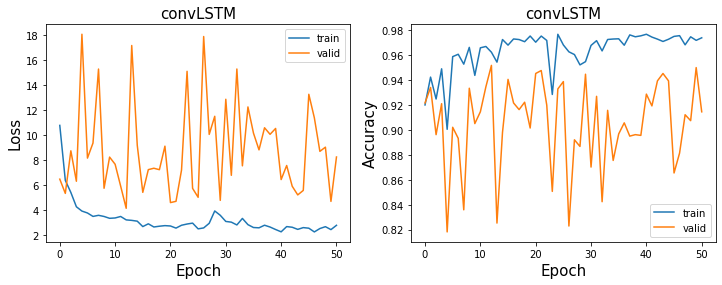

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 49.68339538574219
Val loss for epoch 0: 52.734378814697266
1
Train loss for epoch 1: 49.99594497680664
Val loss for epoch 1: 52.734378814697266
2
Train loss for epoch 2: 49.999237060546875
Val loss for epoch 2: 52.734378814697266
3
Train loss for epoch 3: 49.99665832519531
Val loss for epoch 3: 52.734378814697266
4
Train loss for epoch 4: 50.00111770629883
Val loss for epoch 4: 52.734378814697266
5
Train loss for epoch 5: 50.00475311279297
Val loss for epoch 5: 52.734378814697266
6
Train loss for epoch 6: 49.99331283569336
Val loss for epoch 6: 52.734378814697266
7
Train loss for epoch 7: 49.99220275878906
Val loss for epoch 7: 52.734378814697266
8
Train loss fo

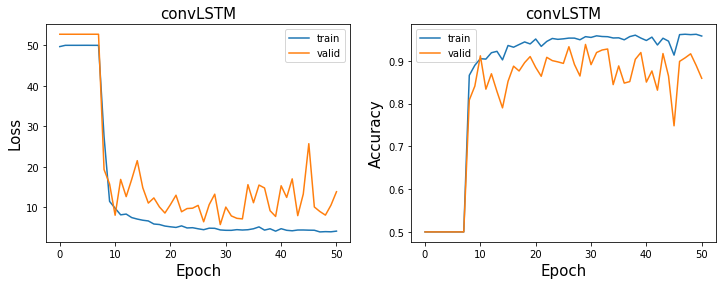

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 6.309453010559082
Val loss for epoch 0: 12.055584907531738
1
Train loss for epoch 1: 4.0352935791015625
Val loss for epoch 1: 11.756226539611816
2
Train loss for epoch 2: 3.2256011962890625
Val loss for epoch 2: 10.81539535522461
Train loss for epoch 3: 3.452829599380493
Val loss for epoch 3: 13.968086242675781
4
Train loss for epoch 4: 3.2947514057159424
Val loss for epoch 4: 10.64805793762207
Train loss for epoch 5: 3.3665361404418945
Val loss for epoch 5: 19.504966735839844
Train loss for epoch 6: 3.3926970958709717
Val loss for epoch 6: 13.309916496276855
7
Train loss for epoch 7: 3.7999277114868164
Val loss for epoch 7: 6.605371475219727
Train loss for epoc

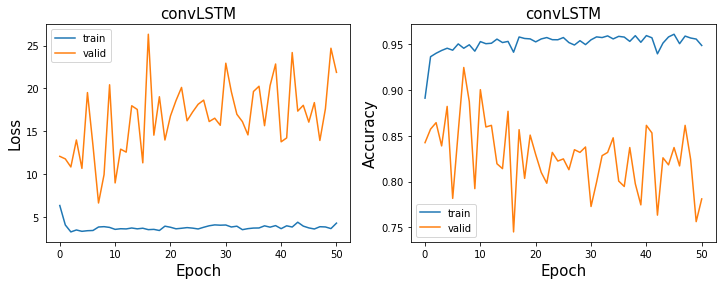

In [54]:
for i in hidden_dim:
    for d in dropout:
        model = convLSTM(input_dim = 62, hidden_dim = i, dropout = d).to(device)
        print(model)
        optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
        criterion = nn.BCELoss() # BCE loss
        train_losses, train_accs, val_losses, val_accs, parameter_history = [], [], [], [],[]

        for epoch in range(num_epochs):
            train_loss, train_acc, parameter_history = train(model, optimizer, criterion, train_loader,  device='cuda')
            val_loss, val_acc = evaluate(model, optimizer, criterion, val_loader, device='cuda')
            train_losses.append(train_loss)
            train_accs.append(train_acc)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
            if epoch == 0:
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))
            if val_loss <= min(val_losses):
                best_epoch = epoch
                print(epoch)
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length,d, i,epoch))
        #     elif verbose:
            else:
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))

        #     if epoch == num_epochs-1:
        #         torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_EPOCH{}.pt'.format(model_saving_path, model_type, CH, loss_type, reg_type, alpha, timewindow, epoch))
        train_result_filename =  '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced_trainresult.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch)
        train_result = {'model_type': model_type, 'train_losses' : train_losses, 'val_losses' : val_losses, 'train_accs': train_accs, 'val_accs': val_accs}
        pickle.dump( train_result, open( train_result_filename, "wb" ) )
        plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)

### Balanced Result

In [41]:
results = []
for h in hidden_dim:
    for d in dropout:
        model_convLSTM = os.listdir(model_saving_path)

        best_result = 0
        reg_alpha = 'REG'+reg_type+str(alpha)+'_'
        dropout_type = 'DO'+str(d)
        hidden_type = 'HD'+str(h)
        t_len = 'TLEN'+str(T_length)
        for i, s in enumerate(model_convLSTM):
            if 'convLSTM_CHall_' in s and reg_alpha in s and dropout_type in s and 'trainresult' not in s and hidden_type in s and t_len in s and 'valcm' not in s and 'testcm' not in s and 'balanced' in s:
                model_name = model_convLSTM[i].split('_')
                epoch_name = [ind for ind,item in enumerate(np.array(model_name)) if "EPOCH" in item]
                res = [int(i) for i in model_name[epoch_name[0]] if i.isdigit()]
                if len(res) > 1:
                    epoch_result = res[0]*10+res[1]
                else:
                    epoch_result = res[0]
                if epoch_result>best_result and epoch_result != 50:
                    best_result = epoch_result

        results.append([h,d,best_result])

results = pd.DataFrame(np.array(results), columns=['hidden','dropout', 'epoch'])
best_results = results.groupby(['hidden','dropout']).max('epoch')
print(best_results)


                epoch
hidden dropout       
10.0   0.1        0.0
       0.3        0.0
       0.5        1.0
15.0   0.1        0.0
       0.3        0.0
       0.5        3.0
48.0   0.1       30.0
       0.3       49.0
       0.5        2.0
56.0   0.1       12.0
       0.3       29.0
       0.5        7.0


In [43]:
def plot_train_result_file(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch):
    fb = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH50_balanced_trainresult.pt'.format(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    file = open(fb,'rb')
    train_result = pickle.load(file)
    train_losses = train_result['train_losses']
    val_losses = train_result['val_losses']
    train_accs = train_result['train_accs']
    val_accs = train_result['val_accs']
    model_type = train_result['model_type']
    print('best epoch training accuracy: ', train_accs[best_epoch])
    plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)
    

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.9446763540290621


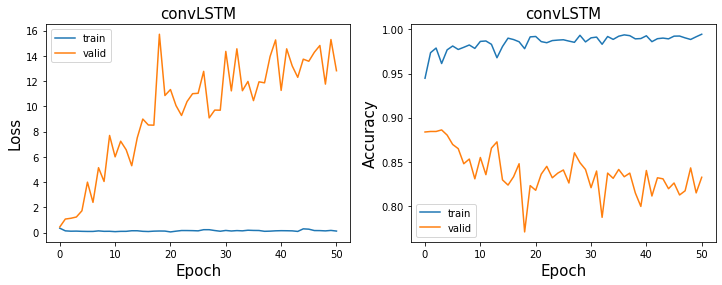

<ipython-input-14-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


validation loss:0.4427085518836975 accuracy:0.8819362455726092
test loss:0.36659660935401917 accuracy:0.9162605228178998
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD10_balanced_valcm.pt


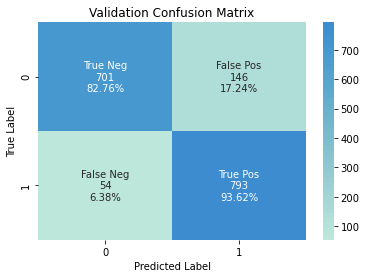

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD10_balanced_testcm.pt


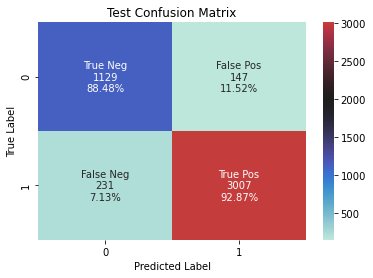

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD10_EPOCH0_balanced.pt
best epoch training accuracy:  0.9387054161162484


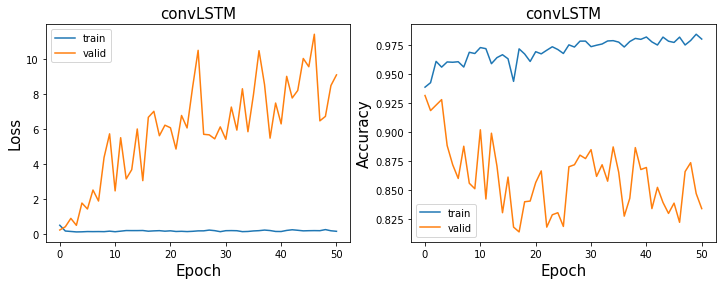

validation loss:0.27206429839134216 accuracy:0.9332939787485242
test loss:0.3233135938644409 accuracy:0.9348692955250333
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD10_balanced_valcm.pt


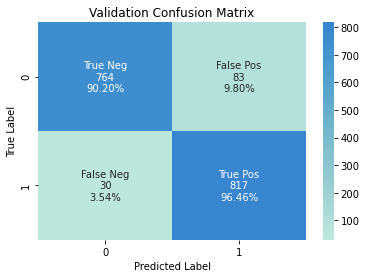

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD10_balanced_testcm.pt


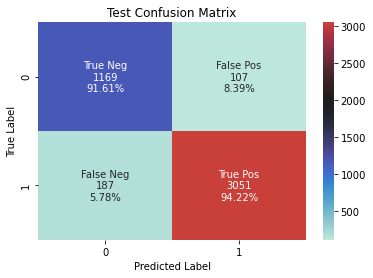

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD10_EPOCH1_balanced.pt
best epoch training accuracy:  0.9217701453104359


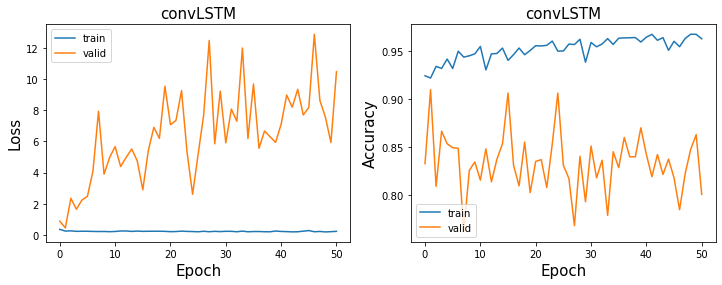

validation loss:0.46094703674316406 accuracy:0.9079102715466352
test loss:0.4700295031070709 accuracy:0.9244572441293752
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD10_balanced_valcm.pt


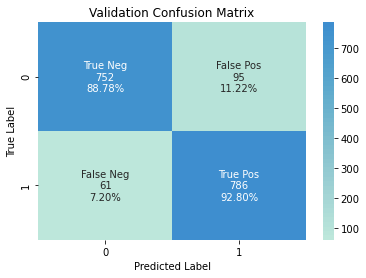

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD10_balanced_testcm.pt


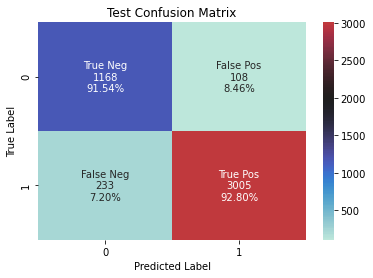

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.9592602377807133


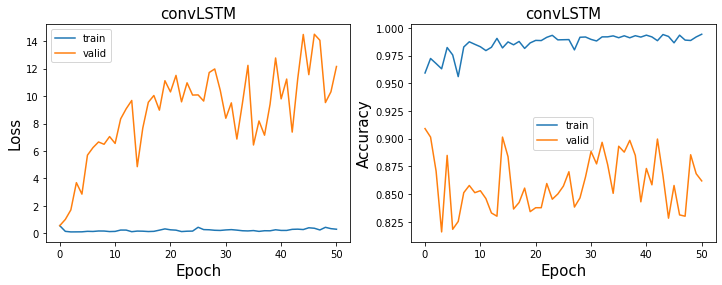

validation loss:0.7493561506271362 accuracy:0.9079102715466352
test loss:0.27456822991371155 accuracy:0.9426229508196722
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD15_balanced_valcm.pt


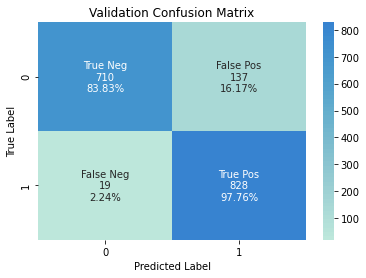

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD15_balanced_testcm.pt


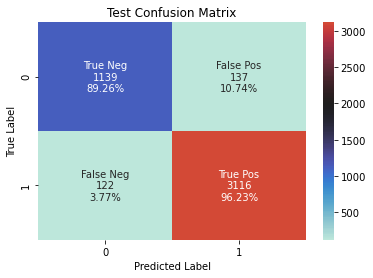

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD15_EPOCH0_balanced.pt
best epoch training accuracy:  0.9365125495376486


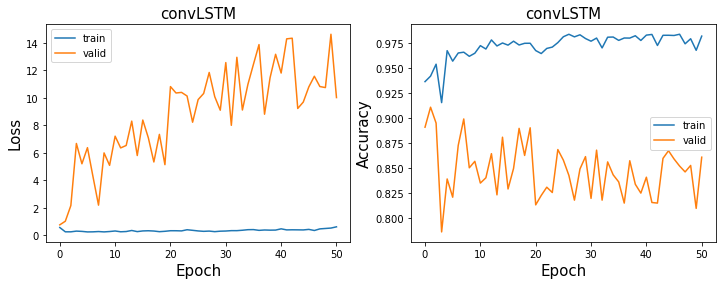

validation loss:0.9020950794219971 accuracy:0.8955135773317592
test loss:0.500307559967041 accuracy:0.9304386353566682
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD15_balanced_valcm.pt


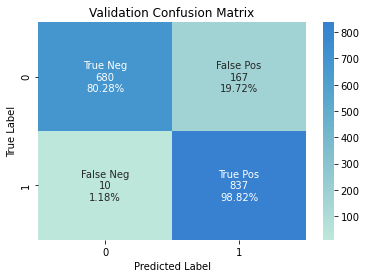

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD15_balanced_testcm.pt


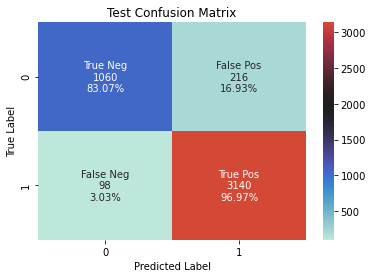

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD15_EPOCH3_balanced.pt
best epoch training accuracy:  0.9328665785997358


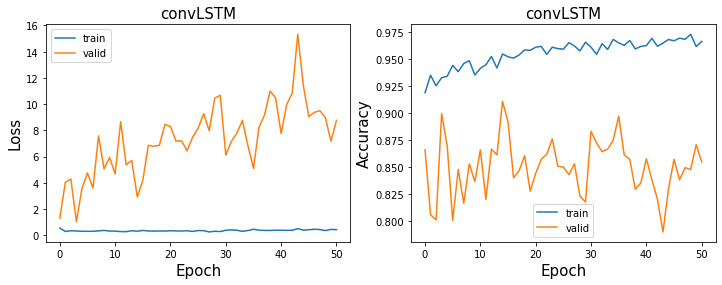

validation loss:1.022093415260315 accuracy:0.9061393152302243
test loss:0.9419900178909302 accuracy:0.9335400974745237
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD15_balanced_valcm.pt


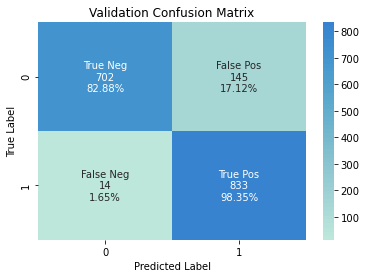

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD15_balanced_testcm.pt


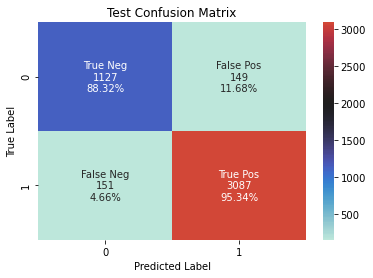

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD48_EPOCH30_balanced.pt
best epoch training accuracy:  0.9677410832232497


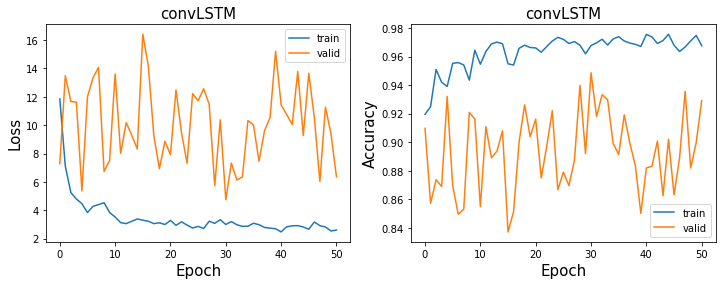

validation loss:4.431413650512695 accuracy:0.9521841794569067
test loss:3.87528395652771 accuracy:0.9590163934426229
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD48_balanced_valcm.pt


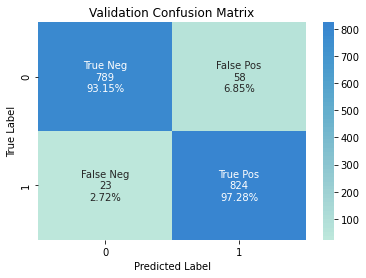

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD48_balanced_testcm.pt


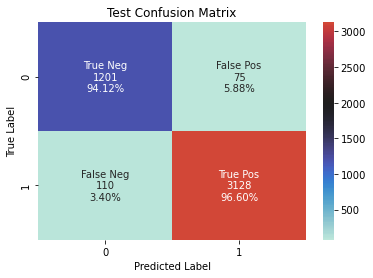

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD48_EPOCH49_balanced.pt
best epoch training accuracy:  0.9389431968295905


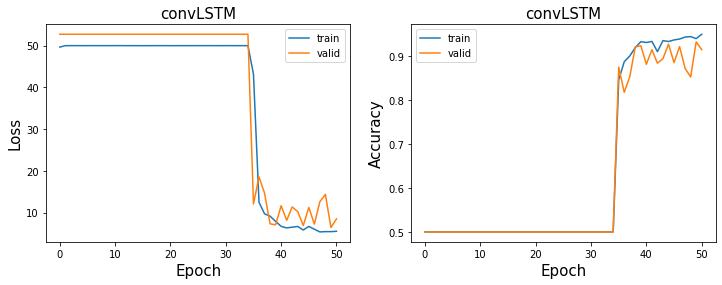

validation loss:6.279948711395264 accuracy:0.9332939787485242
test loss:4.294363975524902 accuracy:0.9574656623836951
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD48_balanced_valcm.pt


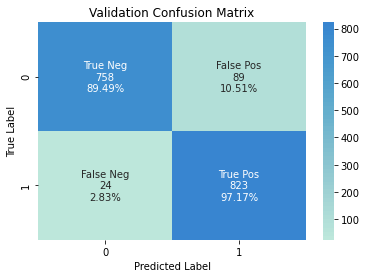

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD48_balanced_testcm.pt


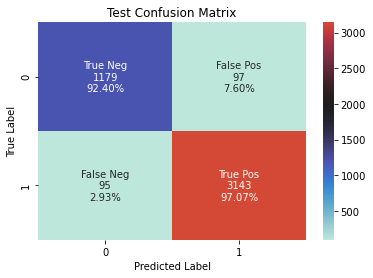

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD48_EPOCH2_balanced.pt
best epoch training accuracy:  0.9287978863936592


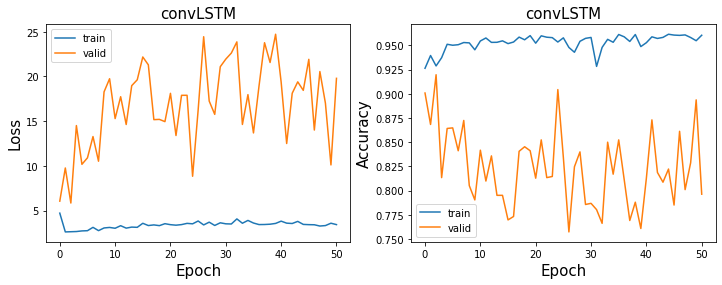

validation loss:5.759352684020996 accuracy:0.9197166469893743
test loss:3.388016939163208 accuracy:0.9412937527691626
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD48_balanced_valcm.pt


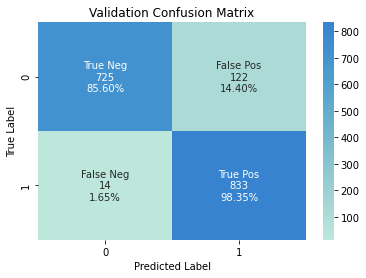

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD48_balanced_testcm.pt


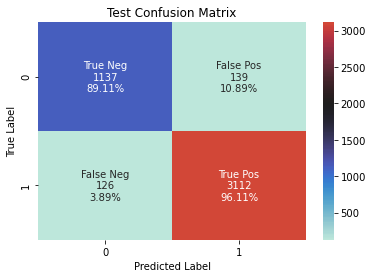

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD56_EPOCH12_balanced.pt
best epoch training accuracy:  0.9621400264200792


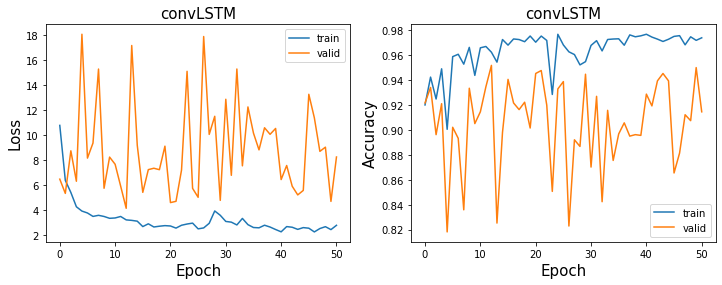

validation loss:4.502012252807617 accuracy:0.9545454545454546
test loss:4.642579555511475 accuracy:0.9514842711564023
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD56_balanced_valcm.pt


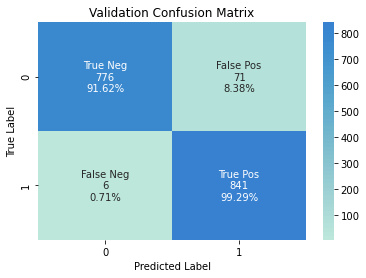

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD56_balanced_testcm.pt


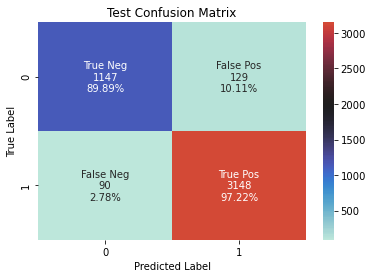

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD56_EPOCH29_balanced.pt
best epoch training accuracy:  0.956221928665786


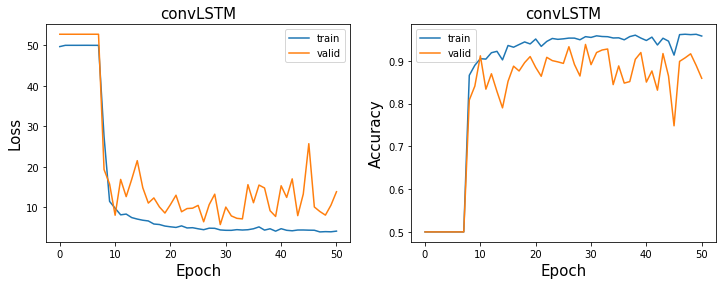

validation loss:5.759048938751221 accuracy:0.9397874852420307
test loss:5.047884464263916 accuracy:0.9501550731058928
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD56_balanced_valcm.pt


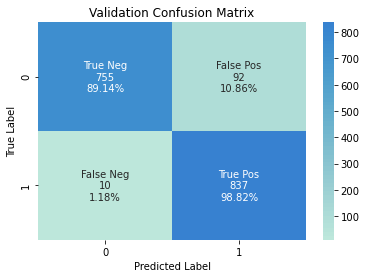

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD56_balanced_testcm.pt


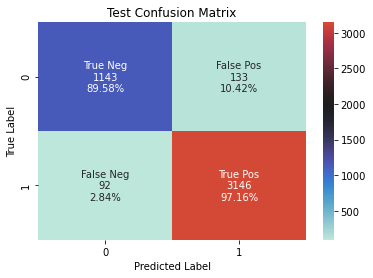

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD56_EPOCH7_balanced.pt
best epoch training accuracy:  0.9454161162483488


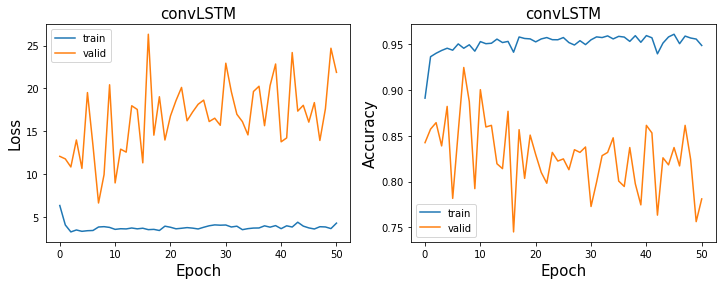

validation loss:6.693541049957275 accuracy:0.9256198347107438
test loss:4.089815616607666 accuracy:0.9523704031900754
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD56_balanced_valcm.pt


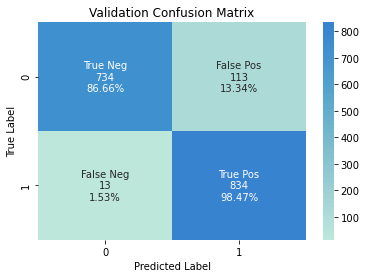

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD56_balanced_testcm.pt


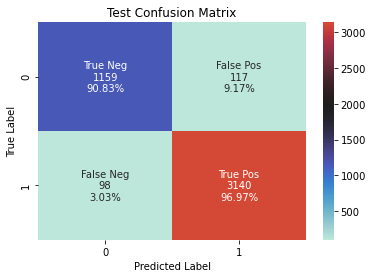

In [44]:
for i,(index,row) in enumerate(best_results.iterrows()):

    best_epoch = int(row)
    hidden = int(index[0])
    dropout = index[1]
    alpha = 0
    
    
    # load best model
    model = convLSTM(input_dim = 62, hidden_dim = hidden).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden,best_epoch)))
    
    print('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_balanced.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, dropout, hidden,best_epoch))

    ## Print training accuracy
    plot_train_result_file(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch)

    
    ## Calculate validation accuracy and validation loss
    val_loss, val_acc, val_preds, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
    print('validation loss:{} accuracy:{}'.format(val_loss, val_acc))
    
    
    
    ## Calculate test accuracy and test loss
    test_loss, test_acc, test_preds, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
    print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
    print(np.mean(np.concatenate(test_labels)))
    
    ## Confusion matrix-validation
    predictions_val = np.concatenate(val_preds)
    labels_val = np.concatenate(val_labels)
    
    val_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_balanced_valcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
    print(val_cm_filename)
    val_cm_result = {'predictions_val': predictions_val, 'labels_val' : labels_val}

    pickle.dump( val_cm_result, open( val_cm_filename, "wb" ) )
    
    
    df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

    cm_val = confusion_matrix(labels_val, predictions_val)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_val.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_val, annot=labels, fmt='', center = 2000)
    ax.set_title('Validation Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    
    ## Confusion matrix-test
    predictions_test = np.concatenate(test_preds)
    labels_test = np.concatenate(test_labels)

    test_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_balanced_testcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
    print(test_cm_filename)
    test_cm_result = {'predictions_test': predictions_test, 'labels_val' : labels_test}

    pickle.dump( test_cm_result, open( test_cm_filename, "wb" ) )

    df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

    cm_test = confusion_matrix(labels_test, predictions_test)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_test.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
    ax.set_title('Test Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    


### Unbalanced Result

In [136]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.01
num_epochs = 51
alpha = 0
model_type = 'convLSTM'
loss_type = 'bce'
reg_type = 'none'
alpha = 0
timewindow = 10
ch = 'all'
dropout = [0.1,0.3,0.5]
hidden_dim = [10,15,48,56]
# verbose = False

T_length = 10
criterion = nn.BCELoss() # BCE loss

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)


<ipython-input-66-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


0
Train loss for epoch 0: 0.43146559596061707
Val loss for epoch 0: 0.15232650935649872
Train loss for epoch 1: 0.12123872339725494
Val loss for epoch 1: 0.20053981244564056
Train loss for epoch 2: 0.08645131438970566
Val loss for epoch 2: 0.3704940378665924
Train loss for epoch 3: 0.07287954539060593
Val loss for epoch 3: 0.4745262861251831
Train loss for epoch 4: 0.05974680930376053
Val loss for epoch 4: 0.742043137550354
Train loss for epoch 5: 0.0641554743051529
Val loss for epoch 5: 0.7053490281105042
Train loss for epoch 6: 0.07041789591312408
Val loss for epoch 6: 0.7336220741271973
Train loss for epoch 7: 0.10045010596513748
Val loss for epoch 7: 1.3486963510513306
Train loss for epoch 8: 0.06549049913883209
Val loss for epoch 8: 1.3068019151687622
Train loss for epoch 9: 0.08384378254413605
Val loss for epoch 9: 2.026914596557617
Train loss for epoch 10: 0.13335205614566803
Val loss for epoch 10: 1.4705321788787842
Train loss for epoch 11: 0.12336656451225281
Val loss for epoc

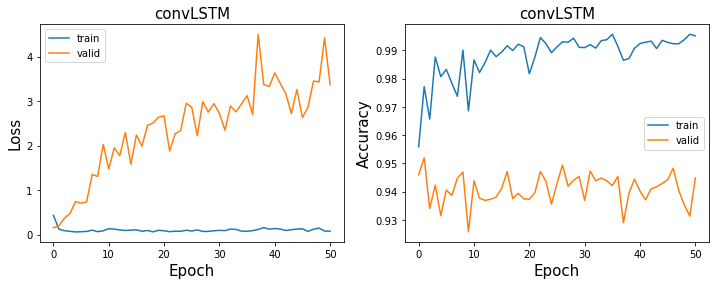

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.3660135567188263
Val loss for epoch 0: 0.5863631963729858
1
Train loss for epoch 1: 0.21318712830543518
Val loss for epoch 1: 0.36612212657928467
Train loss for epoch 2: 0.19089478254318237
Val loss for epoch 2: 0.8078368306159973
Train loss for epoch 3: 0.22007273137569427
Val loss for epoch 3: 0.8316124677658081
Train loss for epoch 4: 0.15853527188301086
Val loss for epoch 4: 0.8328431844711304
Train loss for epoch 5: 0.16707345843315125
Val loss for epoch 5: 1.6708415746688843
Train loss for epoch 6: 0.19706441462039948
Val loss for epoch 6: 1.3235889673233032
Train loss for epoch 7: 0.18774719536304474
Val loss for epoch 7: 0.735135555267334
Train loss for 

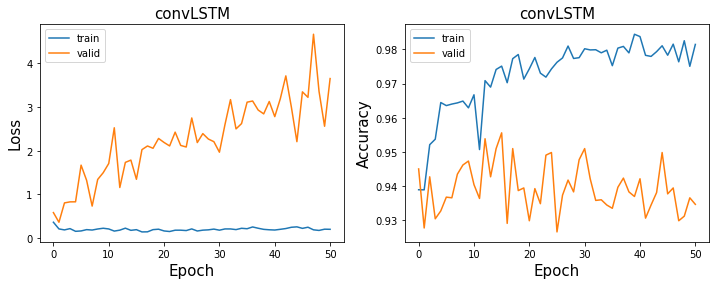

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(72, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=10000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.39030683040618896
Val loss for epoch 0: 0.48735886812210083
Train loss for epoch 1: 0.2737343907356262
Val loss for epoch 1: 0.5660660862922668
Train loss for epoch 2: 0.23759961128234863
Val loss for epoch 2: 0.5726069211959839
Train loss for epoch 3: 0.25517329573631287
Val loss for epoch 3: 0.8069599866867065
Train loss for epoch 4: 0.2521422803401947
Val loss for epoch 4: 0.6987713575363159
Train loss for epoch 5: 0.23906011879444122
Val loss for epoch 5: 1.2316232919692993
Train loss for epoch 6: 0.22646769881248474
Val loss for epoch 6: 1.2714343070983887
Train loss for epoch 7: 0.20810507237911224
Val loss for epoch 7: 1.2599687576293945
Train loss for ep

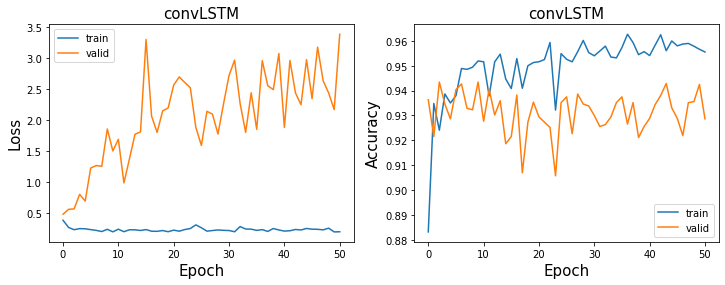

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.46602290868759155
Val loss for epoch 0: 0.16564251482486725
Train loss for epoch 1: 0.10277161747217178
Val loss for epoch 1: 0.3344409167766571
Train loss for epoch 2: 0.10835262387990952
Val loss for epoch 2: 0.40195146203041077
Train loss for epoch 3: 0.08705586194992065
Val loss for epoch 3: 1.0230522155761719
Train loss for epoch 4: 0.13602183759212494
Val loss for epoch 4: 2.235384702682495
Train loss for epoch 5: 0.11369842290878296
Val loss for epoch 5: 2.419677257537842
Train loss for epoch 6: 0.09517154097557068
Val loss for epoch 6: 2.440683126449585
Train loss for epoch 7: 0.09531310945749283
Val loss for epoch 7: 2.3128294944763184
Train loss for ep

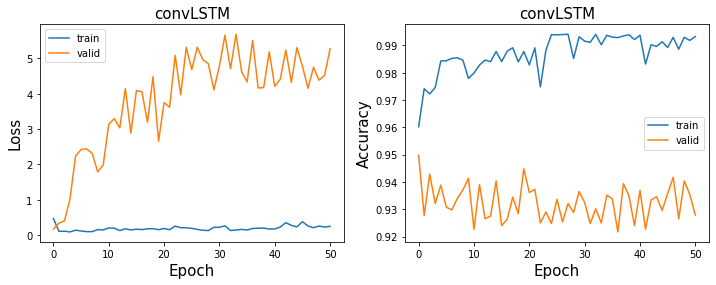

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.671421468257904
Val loss for epoch 0: 0.27488020062446594
Train loss for epoch 1: 0.22982394695281982
Val loss for epoch 1: 0.4098626971244812
Train loss for epoch 2: 0.2537846565246582
Val loss for epoch 2: 0.8628638982772827
Train loss for epoch 3: 0.24913769960403442
Val loss for epoch 3: 1.348486065864563
Train loss for epoch 4: 0.20935669541358948
Val loss for epoch 4: 0.8996272087097168
Train loss for epoch 5: 0.21377041935920715
Val loss for epoch 5: 1.6664772033691406
Train loss for epoch 6: 0.22683574259281158
Val loss for epoch 6: 3.069154977798462
Train loss for epoch 7: 0.2272755652666092
Val loss for epoch 7: 2.3218612670898438
Train loss for epoch 

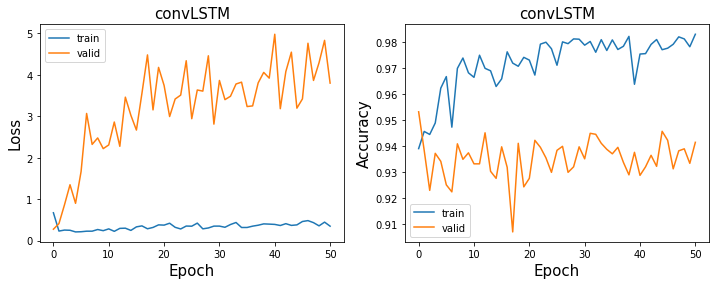

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(77, 60, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=15000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 0.4768264591693878
Val loss for epoch 0: 0.4035930335521698
Train loss for epoch 1: 0.2886286973953247
Val loss for epoch 1: 1.112389326095581
Train loss for epoch 2: 0.3087923228740692
Val loss for epoch 2: 0.7453498840332031
Train loss for epoch 3: 0.2753083407878876
Val loss for epoch 3: 0.848680317401886
Train loss for epoch 4: 0.2630181610584259
Val loss for epoch 4: 2.045649528503418
Train loss for epoch 5: 0.2885349690914154
Val loss for epoch 5: 0.9756110906600952
Train loss for epoch 6: 0.30016058683395386
Val loss for epoch 6: 1.395484447479248
Train loss for epoch 7: 0.3104844093322754
Val loss for epoch 7: 2.148020029067993
Train loss for epoch 8: 0.31

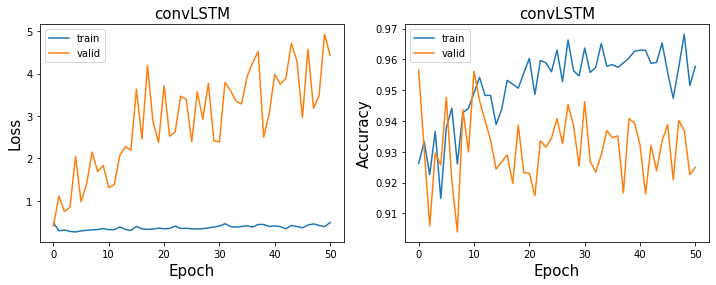

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 9.894786834716797
Val loss for epoch 0: 3.272944211959839
Train loss for epoch 1: 5.271224498748779
Val loss for epoch 1: 3.637845516204834
Train loss for epoch 2: 4.725942134857178
Val loss for epoch 2: 3.8095521926879883
Train loss for epoch 3: 3.943830728530884
Val loss for epoch 3: 3.912367582321167
Train loss for epoch 4: 3.1742656230926514
Val loss for epoch 4: 4.146615505218506
5
Train loss for epoch 5: 2.9342575073242188
Val loss for epoch 5: 3.0894603729248047
Train loss for epoch 6: 3.1695659160614014
Val loss for epoch 6: 3.4032058715820312
Train loss for epoch 7: 2.703131675720215
Val loss for epoch 7: 4.481729507446289
8
Train loss for epoch 8: 3.08

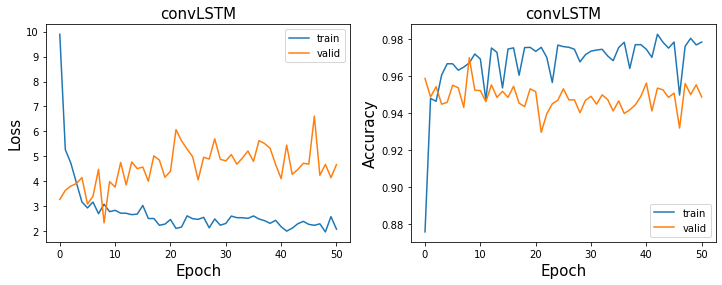

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 5.85115909576416
Val loss for epoch 0: 3.090566873550415
1
Train loss for epoch 1: 3.590111494064331
Val loss for epoch 1: 2.512557029724121
2
Train loss for epoch 2: 3.6570663452148438
Val loss for epoch 2: 2.122117280960083
Train loss for epoch 3: 3.3526012897491455
Val loss for epoch 3: 3.8735387325286865
Train loss for epoch 4: 3.1360232830047607
Val loss for epoch 4: 3.3983654975891113
Train loss for epoch 5: 2.8089864253997803
Val loss for epoch 5: 3.59346079826355
Train loss for epoch 6: 2.83017897605896
Val loss for epoch 6: 2.792264223098755
Train loss for epoch 7: 3.1492457389831543
Val loss for epoch 7: 3.562645435333252
Train loss for epoch 8: 3.1436

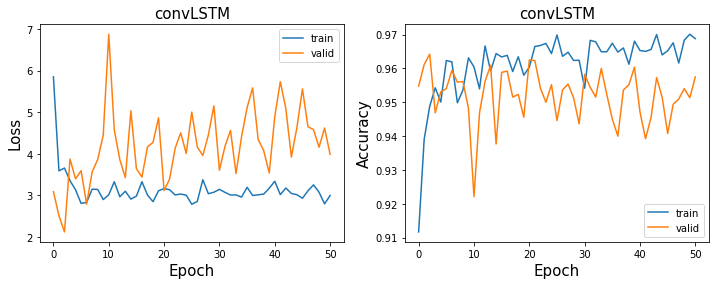

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(110, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=48000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 4.293166637420654
Val loss for epoch 0: 2.549429178237915
Train loss for epoch 1: 2.432025909423828
Val loss for epoch 1: 3.660310983657837
Train loss for epoch 2: 2.5077524185180664
Val loss for epoch 2: 5.0581793785095215
Train loss for epoch 3: 2.50211763381958
Val loss for epoch 3: 4.103878498077393
Train loss for epoch 4: 2.479748249053955
Val loss for epoch 4: 4.612306118011475
Train loss for epoch 5: 2.510606288909912
Val loss for epoch 5: 5.507717609405518
Train loss for epoch 6: 2.528160572052002
Val loss for epoch 6: 4.476082801818848
Train loss for epoch 7: 2.8794143199920654
Val loss for epoch 7: 4.934237003326416
Train loss for epoch 8: 2.8390636444

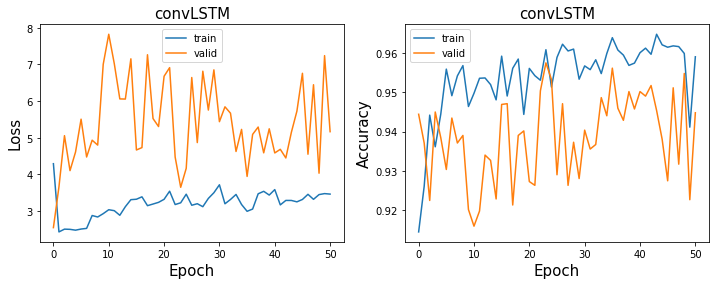

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 8.731571197509766
Val loss for epoch 0: 3.3479528427124023
Train loss for epoch 1: 5.473766326904297
Val loss for epoch 1: 3.5876095294952393
2
Train loss for epoch 2: 4.8337202072143555
Val loss for epoch 2: 2.674288034439087
Train loss for epoch 3: 4.753076076507568
Val loss for epoch 3: 4.323493003845215
Train loss for epoch 4: 4.285915374755859
Val loss for epoch 4: 5.4449262619018555
Train loss for epoch 5: 4.282758712768555
Val loss for epoch 5: 4.211171627044678
Train loss for epoch 6: 4.000151634216309
Val loss for epoch 6: 4.365743160247803
Train loss for epoch 7: 3.9101781845092773
Val loss for epoch 7: 4.242496967315674
Train loss for epoch 8: 4.13207

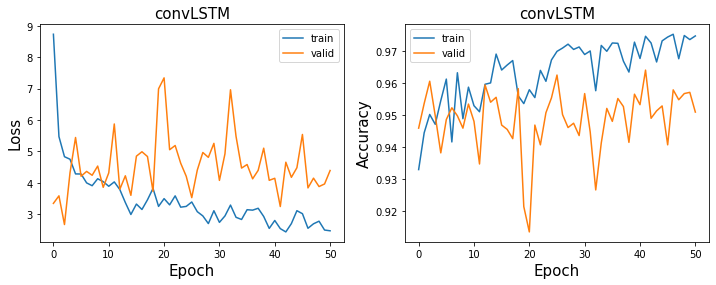

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.3, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 10.028072357177734
Val loss for epoch 0: 3.172240734100342
1
Train loss for epoch 1: 5.5987420082092285
Val loss for epoch 1: 3.1287949085235596
2
Train loss for epoch 2: 4.832326412200928
Val loss for epoch 2: 3.1244289875030518
Train loss for epoch 3: 4.360119342803955
Val loss for epoch 3: 4.075869083404541
Train loss for epoch 4: 4.492543697357178
Val loss for epoch 4: 3.308576822280884
Train loss for epoch 5: 4.056450843811035
Val loss for epoch 5: 3.620849132537842
Train loss for epoch 6: 3.7844314575195312
Val loss for epoch 6: 3.7682323455810547
Train loss for epoch 7: 3.63638973236084
Val loss for epoch 7: 4.23333740234375
Train loss for epoch 8: 3.9312

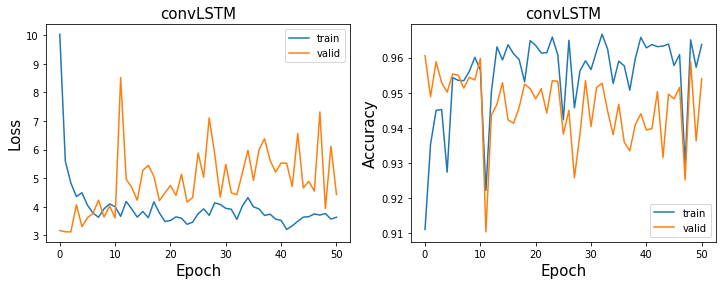

convLSTM(
  (convLSTM): ConvLSTM(
    (cell_list): ModuleList(
      (0): ConvLSTMCell(
        (conv): Conv2d(118, 224, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (dropout): Dropout2d(p=0.5, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=56000, out_features=1, bias=True)
)
0
Train loss for epoch 0: 3.496365547180176
Val loss for epoch 0: 4.753161430358887
1
Train loss for epoch 1: 3.230867862701416
Val loss for epoch 1: 4.368074417114258
Train loss for epoch 2: 3.3936023712158203
Val loss for epoch 2: 4.593316078186035
Train loss for epoch 3: 3.244978189468384
Val loss for epoch 3: 4.504037857055664
4
Train loss for epoch 4: 3.694913864135742
Val loss for epoch 4: 3.640986680984497
Train loss for epoch 5: 3.6833794116973877
Val loss for epoch 5: 5.254092693328857
Train loss for epoch 6: 3.8050851821899414
Val loss for epoch 6: 7.478594779968262
7
Train loss for epoch 7: 3.3217287063598633
Val loss for epoch 7: 3.520354986190796
Train loss for epoch 8: 3.51

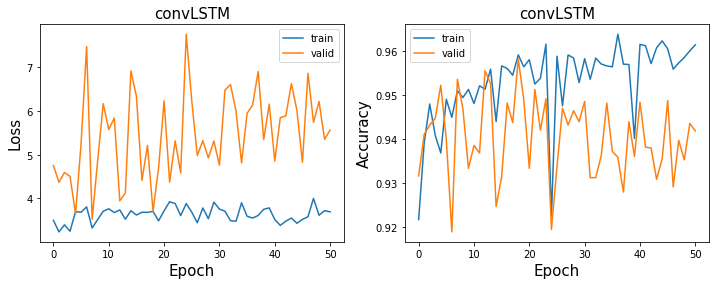

In [128]:
for i in hidden_dim:
    for d in dropout:
        model = convLSTM(input_dim = 62, hidden_dim = i, dropout = d).to(device)
        print(model)
        optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
        criterion = nn.BCELoss() # BCE loss
        train_losses, train_accs, val_losses, val_accs, parameter_history = [], [], [], [],[]

        for epoch in range(num_epochs):
            train_loss, train_acc, parameter_history = train(model, optimizer, criterion, train_loader,  device='cuda')
            val_loss, val_acc = evaluate(model, optimizer, criterion, val_loader, device='cuda')
            train_losses.append(train_loss)
            train_accs.append(train_acc)
            val_losses.append(val_loss)
            val_accs.append(val_acc)
            if epoch == 0:
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))

            if val_loss <= min(val_losses):
                best_epoch = epoch
                print(epoch)
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch))
            else:
                print('Train loss for epoch {}: {}'.format(epoch, train_loss))
                print('Val loss for epoch {}: {}'.format(epoch, val_loss))

        #     if epoch == num_epochs-1:
        #         torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_EPOCH{}.pt'.format(model_saving_path, model_type, CH, loss_type, reg_type, alpha, timewindow, epoch))

        train_result_filename =  '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}_trainresult.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, d, i,epoch)
        train_result = {'model_type': model_type, 'train_losses' : train_losses, 'val_losses' : val_losses, 'train_accs': train_accs, 'val_accs': val_accs}
        pickle.dump( train_result, open( train_result_filename, "wb" ) )
        plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)

In [137]:
def plot_train_result_file(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch):
    fb = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH50_trainresult.pt'.format(model_saving_path, model_type, num_channel, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden)
    file = open(fb,'rb')
    train_result = pickle.load(file)
    train_losses = train_result['train_losses']
    val_losses = train_result['val_losses']
    train_accs = train_result['train_accs']
    val_accs = train_result['val_accs']
    model_type = train_result['model_type']
    print('best epoch training accuracy: ', train_accs[best_epoch])
    plot_loss_acc(train_losses, val_losses, train_accs, val_accs, model_type)
    

In [138]:
results = []
for h in hidden_dim:
    for d in dropout:
        model_convLSTM = os.listdir(model_saving_path)

        best_result = 0
        reg_alpha = 'REG'+reg_type+str(alpha)+'_'
        dropout_type = 'DO'+str(d)
        hidden_type = 'HD'+str(h)
        t_len = 'TLEN'+str(T_length)
        for i, s in enumerate(model_convLSTM):
            if 'convLSTM_CHall_' in s and reg_alpha in s and dropout_type in s and hidden_type in s and t_len in s and '_balanced' not in s and 'trainresult' not in s and 'valcm' not in s and 'testcm' not in s:
                model_name = model_convLSTM[i].split('_')
                epoch_name = [ind for ind,item in enumerate(np.array(model_name)) if "EPOCH" in item]
                res = [int(i) for i in model_name[epoch_name[0]] if i.isdigit()]
                if len(res) > 1:
                    epoch_result = res[0]*10+res[1]
                else:
                    epoch_result = res[0]
                if epoch_result>best_result and epoch_result != 50:
                    best_result = epoch_result

        results.append([h,d,best_result])

results = pd.DataFrame(np.array(results), columns=['hidden','dropout', 'epoch'])
best_results = results.groupby(['hidden','dropout']).max('epoch')
print(best_results)


                epoch
hidden dropout       
10.0   0.1        0.0
       0.3        1.0
       0.5        0.0
15.0   0.1        0.0
       0.3        0.0
       0.5        0.0
48.0   0.1        8.0
       0.3        2.0
       0.5        0.0
56.0   0.1        2.0
       0.3        2.0
       0.5        7.0


/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD10_EPOCH0.pt
best epoch training accuracy:  0.9558256274768824


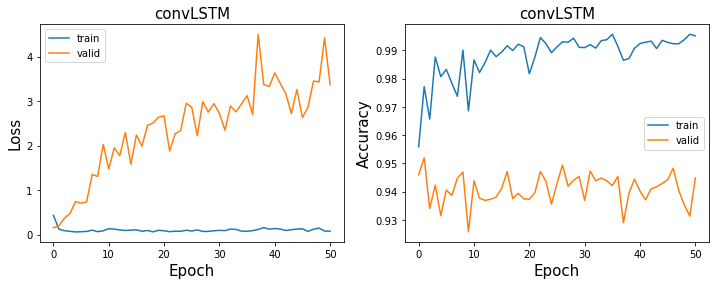

<ipython-input-66-894d578093d0>:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  outputs = torch.tensor(outputs).to(device)


validation loss:0.15232650935649872 accuracy:0.9459303444294785
test loss:0.199343740940094 accuracy:0.9490474080638015
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD10_valcm.pt


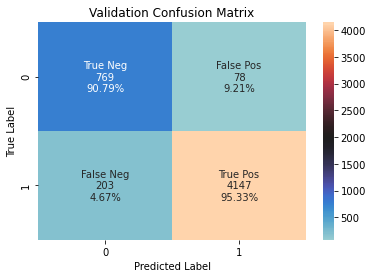

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD10_testcm.pt


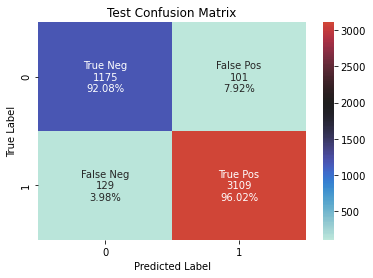

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD10_EPOCH1.pt
best epoch training accuracy:  0.9388375165125495


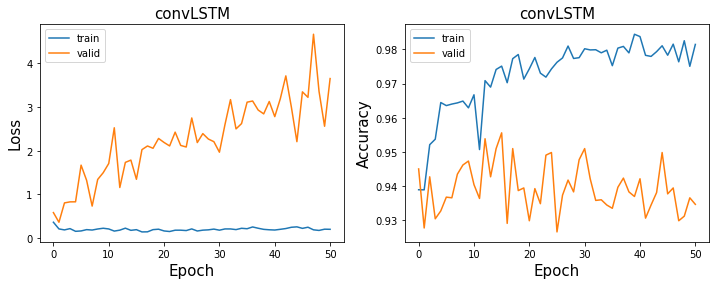

validation loss:0.36612212657928467 accuracy:0.9276505676351742
test loss:0.4718259871006012 accuracy:0.9220203810367745
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD10_valcm.pt


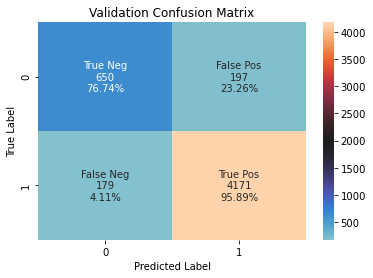

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD10_testcm.pt


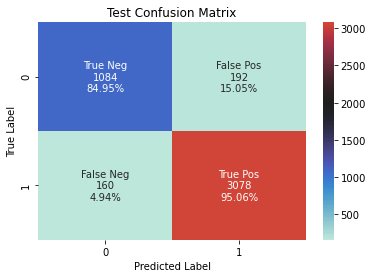

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD10_EPOCH0.pt
best epoch training accuracy:  0.883117569352708


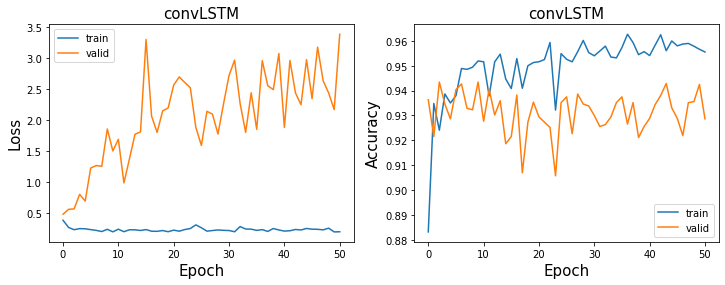

validation loss:0.48735886812210083 accuracy:0.9363094092745815
test loss:0.9524500370025635 accuracy:0.871067789100576
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD10_valcm.pt


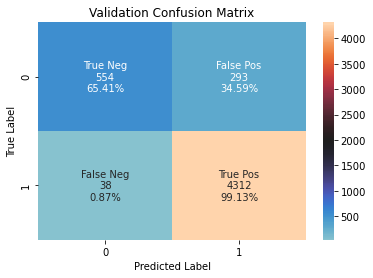

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD10_testcm.pt


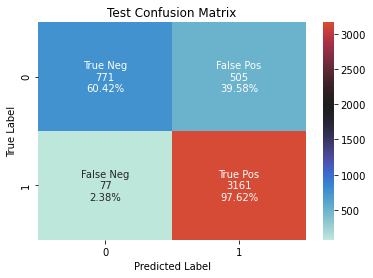

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD15_EPOCH0.pt
best epoch training accuracy:  0.9601849405548216


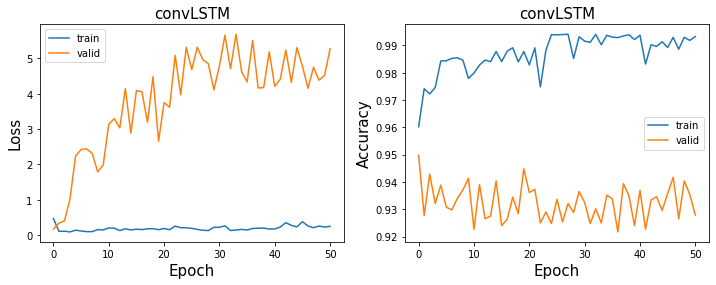

validation loss:0.16564251482486725 accuracy:0.9497787184914374
test loss:0.28708991408348083 accuracy:0.9348692955250333
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD15_valcm.pt


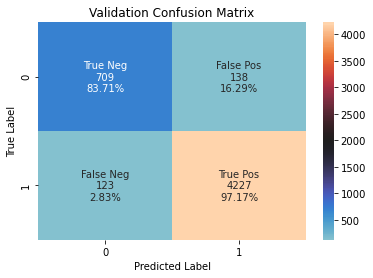

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD15_testcm.pt


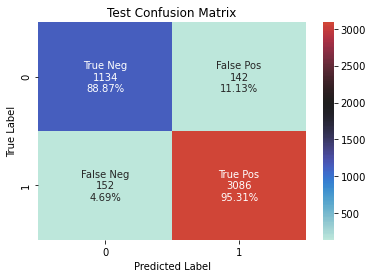

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD15_EPOCH0.pt
best epoch training accuracy:  0.93889035667107


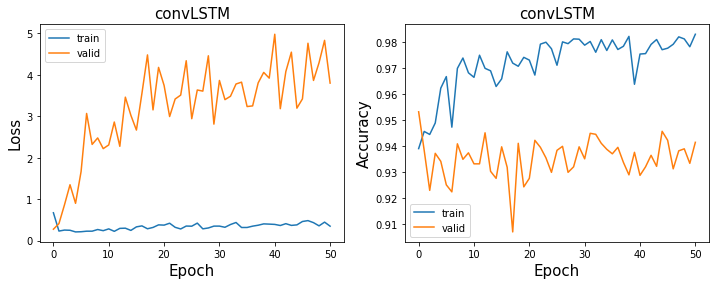

validation loss:0.27488020062446594 accuracy:0.9530498364441023
test loss:0.4730605185031891 accuracy:0.9280017722640673
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD15_valcm.pt


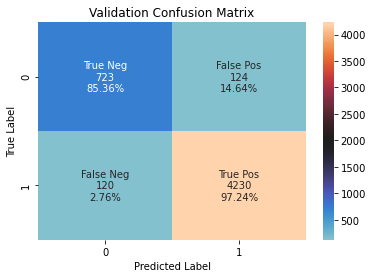

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD15_testcm.pt


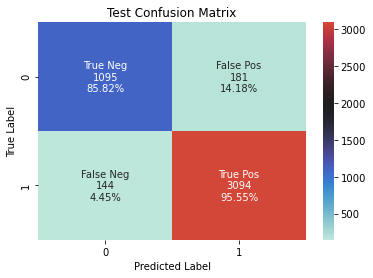

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD15_EPOCH0.pt
best epoch training accuracy:  0.9262351387054161


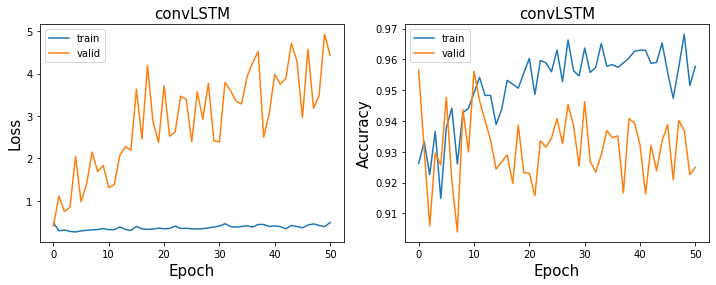

validation loss:0.4035930335521698 accuracy:0.9565133730998653
test loss:0.6368401646614075 accuracy:0.9359769605671245
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD15_valcm.pt


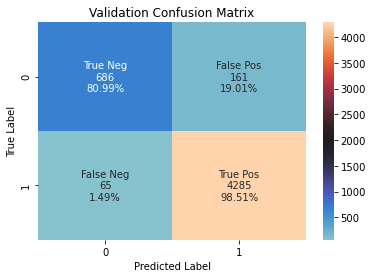

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD15_testcm.pt


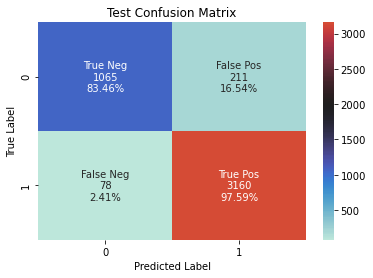

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD48_EPOCH8.pt
best epoch training accuracy:  0.967001321003963


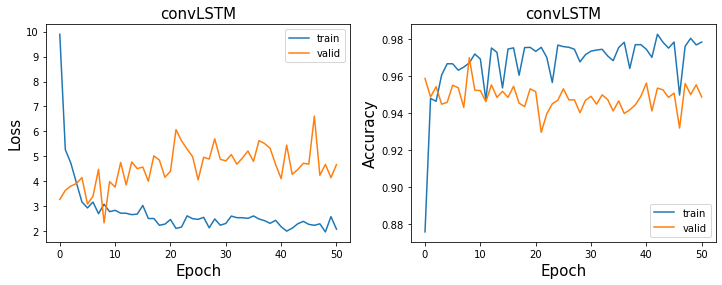

validation loss:2.33481764793396 accuracy:0.9697902636136232
test loss:3.935389280319214 accuracy:0.9523704031900754
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD48_valcm.pt


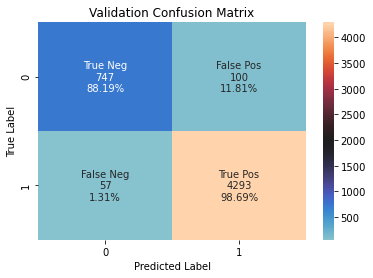

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD48_testcm.pt


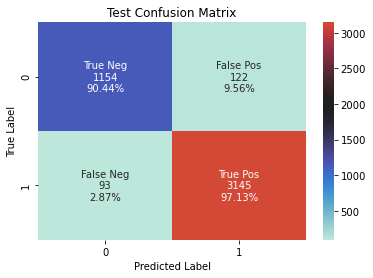

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD48_EPOCH2.pt
best epoch training accuracy:  0.9487978863936591


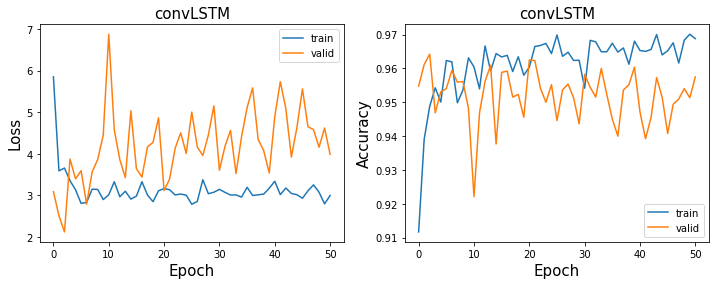

validation loss:2.122117280960083 accuracy:0.9642101212237829
test loss:3.73392915725708 accuracy:0.9417368187859991
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD48_valcm.pt


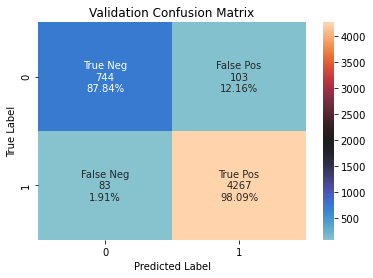

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD48_testcm.pt


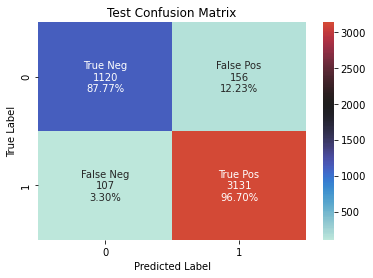

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD48_EPOCH0.pt
best epoch training accuracy:  0.91445178335535


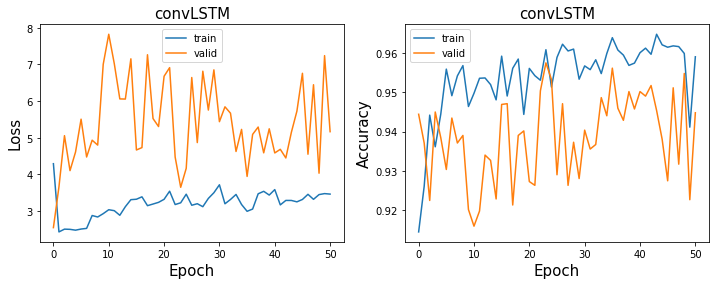

validation loss:2.549429178237915 accuracy:0.944390994804695
test loss:3.71393084526062 accuracy:0.9016393442622951
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD48_valcm.pt


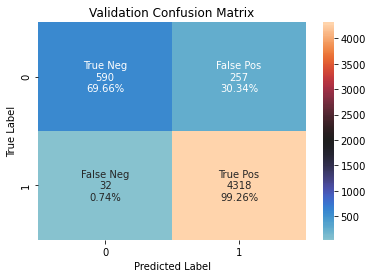

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD48_testcm.pt


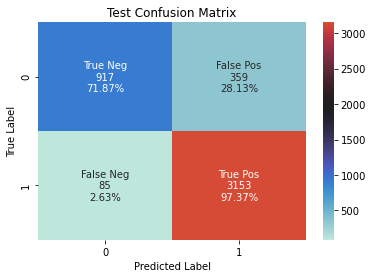

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD56_EPOCH2.pt
best epoch training accuracy:  0.9501981505944518


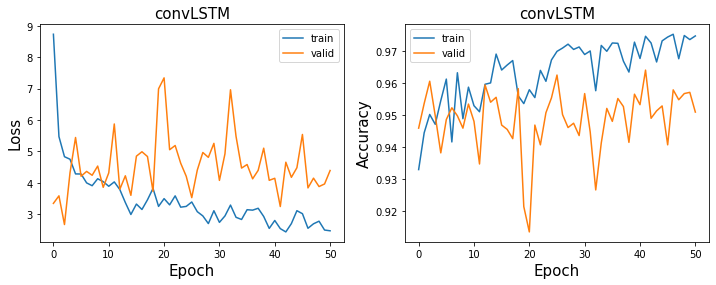

validation loss:2.674288034439087 accuracy:0.960554165864922
test loss:5.3061041831970215 accuracy:0.938192290651307
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD56_valcm.pt


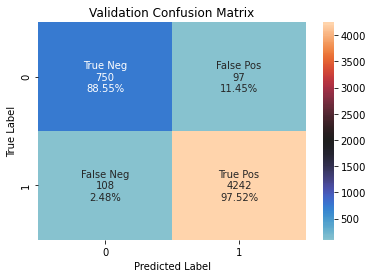

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.1_HD56_testcm.pt


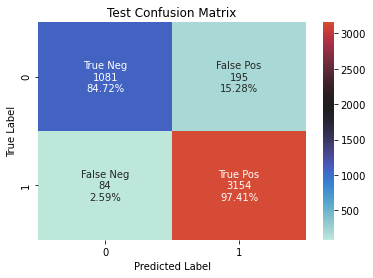

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD56_EPOCH2.pt
best epoch training accuracy:  0.9449669749009247


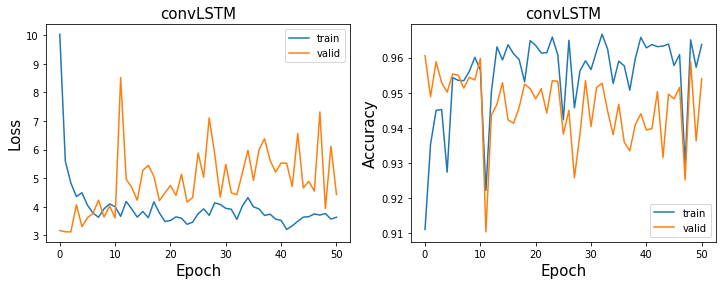

validation loss:3.1244289875030518 accuracy:0.9588223975370406
test loss:4.535818099975586 accuracy:0.9452813469206912
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD56_valcm.pt


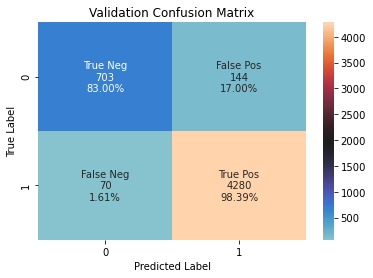

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.3_HD56_testcm.pt


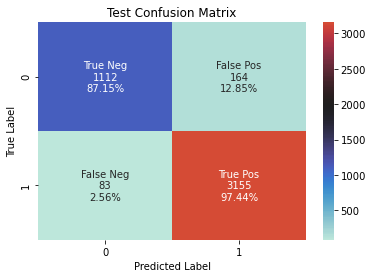

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD56_EPOCH7.pt
best epoch training accuracy:  0.9510171730515191


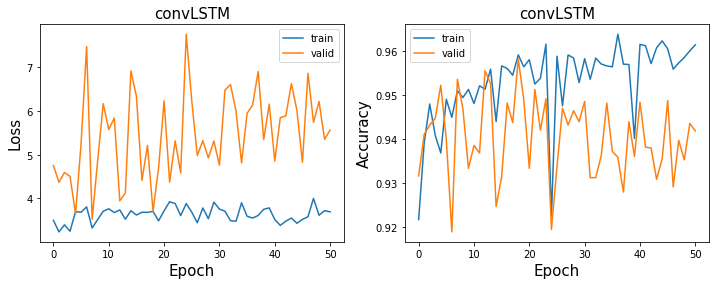

validation loss:3.520354986190796 accuracy:0.9536270925533962
test loss:4.524698734283447 accuracy:0.9461674789543641
0.7173239
/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD56_valcm.pt


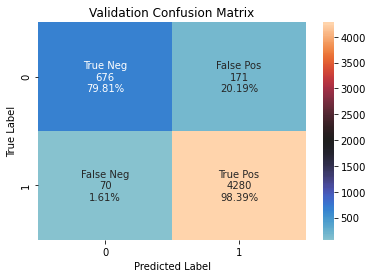

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/convLSTM_models/convLSTM_CHall_LOSSbce_REGnone0_TW10_TLEN10_DO0.5_HD56_testcm.pt


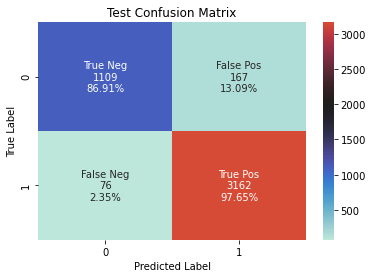

In [139]:
for i,(index,row) in enumerate(best_results.iterrows()):

    best_epoch = int(row)
    hidden = int(index[0])
    dropout = index[1]
    alpha = 0
    
    
    # load best model
    model = convLSTM(input_dim = 62, hidden_dim = hidden).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length,  dropout, hidden,best_epoch)))
    
    print('{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_EPOCH{}.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow,T_length, dropout, hidden,best_epoch))

    ## Print Training Result
    plot_train_result_file(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout, hidden, best_epoch)
    
    
    ## Calculate validation accuracy and validation loss
    val_loss, val_acc, val_preds, val_labels = evaluate(model, optimizer, criterion, val_loader, device='cuda', collect_result = True)
    print('validation loss:{} accuracy:{}'.format(val_loss, val_acc))
    
    ## Calculate test accuracy and test loss
    test_loss, test_acc, test_preds, test_labels = evaluate(model, optimizer, criterion, test_loader, device='cuda', collect_result = True)
    print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
    print(np.mean(np.concatenate(test_labels)))
    
    ## Confusion matrix-validation
    predictions_val = np.concatenate(val_preds)
    labels_val = np.concatenate(val_labels)
    
    val_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_valcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
    print(val_cm_filename)
    val_cm_result = {'predictions_val': predictions_val, 'labels_val' : labels_val}

    pickle.dump( val_cm_result, open( val_cm_filename, "wb" ) )
    
    
    df_val = pd.DataFrame({'predictions': predictions_val, 'labels': labels_val})

    cm_val = confusion_matrix(labels_val, predictions_val)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_val.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_val, annot=labels, fmt='', center = 2000)
    ax.set_title('Validation Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    
    ## Confusion matrix-test
    predictions_test = np.concatenate(test_preds)
    labels_test = np.concatenate(test_labels)

    test_cm_filename = '{}/{}_CH{}_LOSS{}_REG{}{}_TW{}_TLEN{}_DO{}_HD{}_testcm.pt'.format(model_saving_path, model_type, ch, loss_type, reg_type, alpha, timewindow, T_length, dropout,hidden)
    print(test_cm_filename)
    test_cm_result = {'predictions_test': predictions_test, 'labels_val' : labels_test}

    pickle.dump( test_cm_result, open( test_cm_filename, "wb" ) )

    df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

    cm_test = confusion_matrix(labels_test, predictions_test)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_test.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
    ax.set_title('Test Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    
